### Problem Statement - TSF Project
Context As an analyst at ABC Estate Wines, we are presented with historical data encompassing the sales of different types of wines throughout the 20th century. These datasets originate from the same company but represent sales figures for distinct wine varieties. Our objective is to delve into the data, analyze trends, patterns, and factors influencing wine sales over the course of the century. By leveraging data analytics and forecasting techniques, we aim to gain actionable insights that can inform strategic decision-making and optimize sales strategies for the future.

Objective The primary objective of this project is to analyze and forecast wine sales trends for the 20th century based on historical data provided by ABC Estate Wines. We aim to equip ABC Estate Wines with the necessary insights and foresight to enhance sales performance, capitalize on emerging market opportunities, and maintain a competitive edge in the wine industry.

In [1]:
##Import the required libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode()
%matplotlib inline
import seaborn as sns
from pylab import rcParams
import statsmodels.tools.eval_measures as      em
from   sklearn.metrics                 import  mean_squared_error
from   statsmodels.tsa.api             import ExponentialSmoothing, SimpleExpSmoothing, Holt
from   IPython.display                 import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"




### A.Define the problem and perform Exploratory Data Analysis

### Problem Definition :
* Analyze and forecast wine sales trends using 20th-century historical data.
* Identify seasonal patterns, trends, and anomalies in sales.
* Decompose the data to isolate trend, seasonality, and residual components for deeper insights.
* Identify factors influencing wine sales, including external events and market dynamics.
* Address data variability across wine varieties and time periods.
* Develop accurate sales forecasting models for strategic planning.
* Provide actionable insights to optimize future sales and maintain market competitiveness.

#### 1.Read the data as an appropriate time series data

In [2]:
rose_data = pd.read_csv("Rose.csv")
rose_data.head()
rose_data.tail()
rose_data.shape

,YearMonth,Rose
0,1980-01,112.0
1,1980-02,118.0
2,1980-03,129.0
3,1980-04,99.0
4,1980-05,116.0


,YearMonth,Rose
182,1995-03,45.0
183,1995-04,52.0
184,1995-05,28.0
185,1995-06,40.0
186,1995-07,62.0


(187, 2)

* This rose dataset contains 187 records with 2 columns.

In [3]:
sparkling_data = pd.read_csv("Sparkling.csv")
sparkling_data.head()
sparkling_data.tail()
sparkling_data.shape

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


,YearMonth,Sparkling
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688
186,1995-07,2031


(187, 2)

* This sparkling dataset contains 187 records with 2 columns.

In [4]:
# let's check column types and number of values
rose_data.info()
sparkling_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   YearMonth  187 non-null    object 
 1   Rose       185 non-null    float64
dtypes: float64(1), object(1)
memory usage: 3.1+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   YearMonth  187 non-null    object
 1   Sparkling  187 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.1+ KB


In [5]:
# Convert 'YearMonth' to datetime format for proper alignment
rose_data['YearMonth'] = pd.to_datetime(rose_data['YearMonth'], format='%Y-%m')
sparkling_data['YearMonth'] = pd.to_datetime(sparkling_data['YearMonth'], format='%Y-%m')

# Set 'YearMonth' as the index for both datasets for alignment
rose_data.set_index('YearMonth', inplace=True)
sparkling_data.set_index('YearMonth', inplace=True)

# Verify the changes
print("Rose Data:")
print(rose_data.head())  # Displaying first few rows to check the changes
print("\nSparkling Data:")
print(sparkling_data.head())  # Displaying first few rows to check the changes


Rose Data:
             Rose
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0

Sparkling Data:
            Sparkling
YearMonth            
1980-01-01       1686
1980-02-01       1591
1980-03-01       2304
1980-04-01       1712
1980-05-01       1471


#### 2.Plot the data

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Rose Wine Time Series')

([<matplotlib.axis.XTick at 0x221e32832d0>,
 [Text(3652.0, 0, '1980-01-01'),
  Text(3834.0, 0, '1980-07-01'),
  Text(4018.0, 0, '1981-01-01'),
  Text(4199.0, 0, '1981-07-01'),
  Text(4383.0, 0, '1982-01-01'),
  Text(4564.0, 0, '1982-07-01'),
  Text(4748.0, 0, '1983-01-01'),
  Text(4929.0, 0, '1983-07-01'),
  Text(5113.0, 0, '1984-01-01'),
  Text(5295.0, 0, '1984-07-01'),
  Text(5479.0, 0, '1985-01-01'),
  Text(5660.0, 0, '1985-07-01'),
  Text(5844.0, 0, '1986-01-01'),
  Text(6025.0, 0, '1986-07-01'),
  Text(6209.0, 0, '1987-01-01'),
  Text(6390.0, 0, '1987-07-01'),
  Text(6574.0, 0, '1988-01-01'),
  Text(6756.0, 0, '1988-07-01'),
  Text(6940.0, 0, '1989-01-01'),
  Text(7121.0, 0, '1989-07-01'),
  Text(7305.0, 0, '1990-01-01'),
  Text(7486.0, 0, '1990-07-01'),
  Text(7670.0, 0, '1991-01-01'),
  Text(7851.0, 0, '1991-07-01'),
  Text(8035.0, 0, '1992-01-01'),
  Text(8217.0, 0, '1992-07-01'),
  Text(8401.0, 0, '1993-01-01'),
  Text(8582.0, 0, '1993-07-01'),
  Text(8766.0, 0, '1994-01-01'),

Text(0.5, 0, 'YearMonth')

Text(0, 0.5, 'Sales')

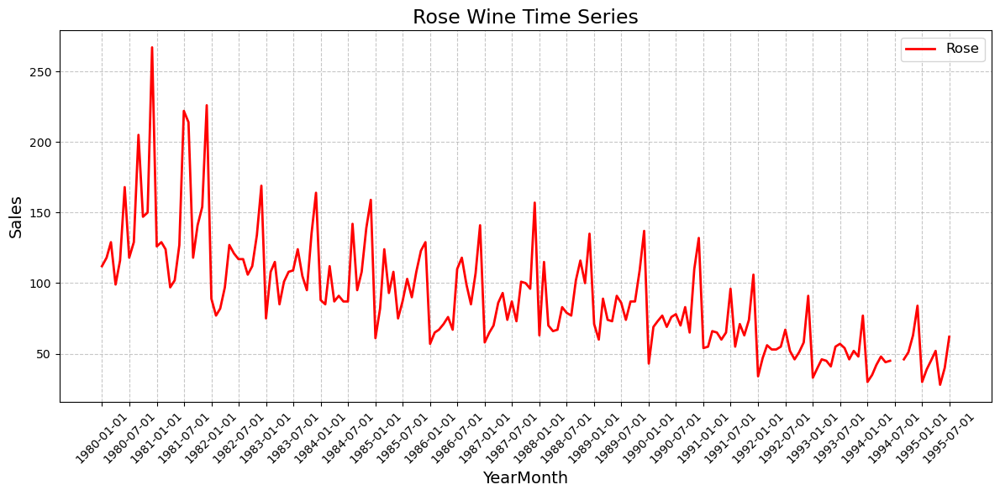

In [6]:
# Plotting Rose time series
plt.figure(figsize=(12, 6))  
plt.plot(rose_data.index, rose_data['Rose'], color='red', linewidth=2)  
plt.title('Rose Wine Time Series', fontsize=17)
plt.xticks(rose_data.index[::6], rotation=45)  # Show every 6th label and rotate by 45 degrees
plt.xlabel('YearMonth', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.legend(['Rose'], loc='best', fontsize=12)
plt.tight_layout()
plt.savefig('rose_ts.jpg', bbox_inches='tight')  # Save the plot
plt.show()

### observation:
* Sales Trends: There is an overall declining trend in the sales of Rosé wine from 1980 to 1995.
* Seasonality: The sales exhibit a recurring pattern, suggesting the presence of seasonality. Peaks and troughs seem to repeat at regular intervals, possibly due to seasonal demand.
* High Variability in Early Years: Sales are more volatile with larger fluctuations between 1980 and 1985 compared to later years.
* Decreasing Peaks: The magnitude of the highest sales values diminishes over time, indicating reduced peak demand.
* Stabilization in Later Years: The sales variability reduces after 1990, with the data appearing more stable but with lower overall sales levels.
* Potential Anomalies: Some outliers might exist during early years with unusually high peaks, possibly indicating special events or external factors affecting sales.

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Sparkling Wine Time Series')

([<matplotlib.axis.XTick at 0x221e4390890>,
 [Text(3652.0, 0, '1980-01-01'),
  Text(3834.0, 0, '1980-07-01'),
  Text(4018.0, 0, '1981-01-01'),
  Text(4199.0, 0, '1981-07-01'),
  Text(4383.0, 0, '1982-01-01'),
  Text(4564.0, 0, '1982-07-01'),
  Text(4748.0, 0, '1983-01-01'),
  Text(4929.0, 0, '1983-07-01'),
  Text(5113.0, 0, '1984-01-01'),
  Text(5295.0, 0, '1984-07-01'),
  Text(5479.0, 0, '1985-01-01'),
  Text(5660.0, 0, '1985-07-01'),
  Text(5844.0, 0, '1986-01-01'),
  Text(6025.0, 0, '1986-07-01'),
  Text(6209.0, 0, '1987-01-01'),
  Text(6390.0, 0, '1987-07-01'),
  Text(6574.0, 0, '1988-01-01'),
  Text(6756.0, 0, '1988-07-01'),
  Text(6940.0, 0, '1989-01-01'),
  Text(7121.0, 0, '1989-07-01'),
  Text(7305.0, 0, '1990-01-01'),
  Text(7486.0, 0, '1990-07-01'),
  Text(7670.0, 0, '1991-01-01'),
  Text(7851.0, 0, '1991-07-01'),
  Text(8035.0, 0, '1992-01-01'),
  Text(8217.0, 0, '1992-07-01'),
  Text(8401.0, 0, '1993-01-01'),
  Text(8582.0, 0, '1993-07-01'),
  Text(8766.0, 0, '1994-01-01'),

Text(0.5, 0, 'YearMonth')

Text(0, 0.5, 'Sales')

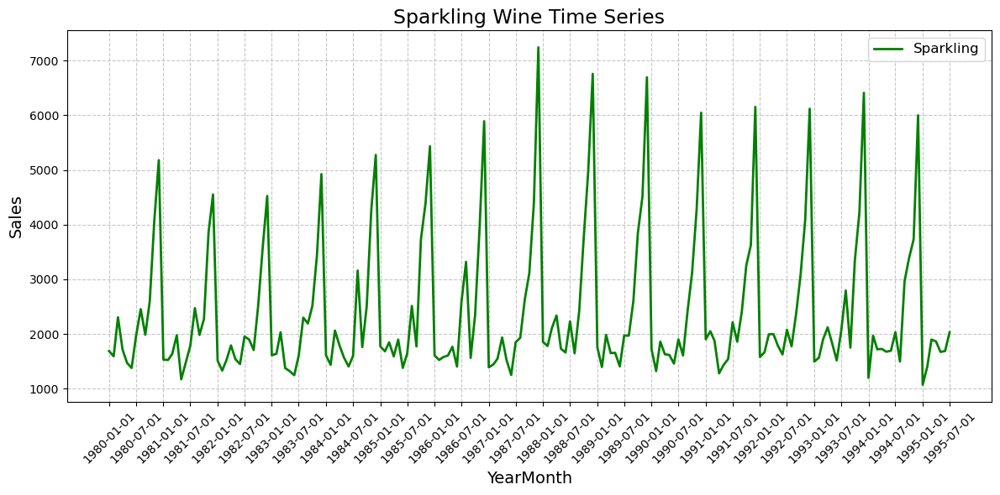

In [7]:
# Plotting Sparkling time series
plt.figure(figsize=(12, 6))  # Increase figure size
plt.plot(sparkling_data.index, sparkling_data['Sparkling'], color='green', linewidth=2)  # Use index for X-axis
plt.title('Sparkling Wine Time Series', fontsize=17)
plt.xticks(sparkling_data.index[::6], rotation=45)  # Show every 6th label and rotate by 45 degrees
plt.xlabel('YearMonth', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.legend(['Sparkling'], loc='best', fontsize=12)
plt.tight_layout()
plt.savefig('spark_ts.jpg', bbox_inches='tight')  # Save the plot
plt.show()

* From the time series plot for sparkling wine sales, here are the observations:

#### Strong Seasonality:

* The sales exhibit a clear seasonal pattern with prominent peaks recurring annually.
* Likely influenced by holidays, festivals, or specific events when sparkling wine is in higher demand.
#### Stable Trends:

* The overall sales trend appears stable, with consistent peak magnitudes over time.
* No significant long-term increase or decrease in sales is noticeable.
#### Peak Magnitudes:

* Peaks are significantly higher than off-peak periods, suggesting a highly seasonal product with concentrated demand.
#### Low Sales Between Peaks:

* The sales during off-peak periods remain relatively low, indicating minimal demand outside peak seasons.
#### Regular Patterns:

* The time intervals between peaks are uniform, reflecting a predictable annual demand cycle.

#### 3.Perform EDA

In [8]:
# Summary statistics for Rose dataset
rose_summary = rose_data.describe()
print("Summary statistics for Rose dataset:\n", rose_summary)

# Summary statistics for Sparkling dataset
sparkling_summary = sparkling_data.describe()
print("\nSummary statistics for Sparkling dataset:\n", sparkling_summary)


Summary statistics for Rose dataset:
              Rose
count  185.000000
mean    90.394595
std     39.175344
min     28.000000
25%     63.000000
50%     86.000000
75%    112.000000
max    267.000000

Summary statistics for Sparkling dataset:
          Sparkling
count   187.000000
mean   2402.417112
std    1295.111540
min    1070.000000
25%    1605.000000
50%    1874.000000
75%    2549.000000
max    7242.000000


#### Observation:
##### Rose Dataset:
* Count: The dataset contains 185 observations, indicating 185 time periods.
* Mean Sales: The average sales for Rosé wine are approximately 90.39 units.
* Sales Variability:
* The standard deviation is 39.18, suggesting moderate variability in sales.
* Sales range from a minimum of 28 to a maximum of 267, indicating significant fluctuations.
###### Quartiles:
- 25% of sales are below 63.
- The median (50th percentile) is 86, showing the central tendency of sales.
- 75% of sales are below 112, with the remaining 25% contributing to higher sales figures.
##### Sparkling Dataset:
- Count: The dataset contains 187 observations, slightly more than the Rosé dataset.
- Mean Sales: The average sales for Sparkling wine are 2402.42 units, significantly higher than Rosé wine sales.
- Sales Variability:
- The standard deviation is 1295.11, indicating high variability in sales.
- Sales range from 1070 to 7242, showcasing much larger fluctuations than Rosé.
###### Quartiles:
- 25% of sales are below 1605.
- The median is 1874, meaning half the sales are below this value.
- 75% of sales are below 2549, with the remaining 25% showing higher sales, likely during seasonal peaks.
##### Comparison and Insights:
- Sparkling wine has significantly higher average sales and variability compared to Rosé wine.
- Rosé sales are more stable and less volatile, whereas Sparkling sales exhibit extreme peaks during high-demand periods.
- The higher maximum value and broader range in Sparkling wine sales highlight its strong seasonality and demand surges.
- Sparkling wine's demand is likely tied to specific events or seasons, while Rosé wine seems to have more consistent year-round demand.

In [9]:
# Check for missing values
print("\nMissing Values in Rose Data:")
print(rose_data.isnull().sum())
print("\nMissing Values in Sparkling Data:")
print(sparkling_data.isnull().sum())


Missing Values in Rose Data:
Rose    2
dtype: int64

Missing Values in Sparkling Data:
Sparkling    0
dtype: int64


<Figure size 1000x600 with 0 Axes>

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='Rose', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Rose Sales')

Text(0.5, 0, 'Sales')

Text(0, 0.5, 'Frequency')

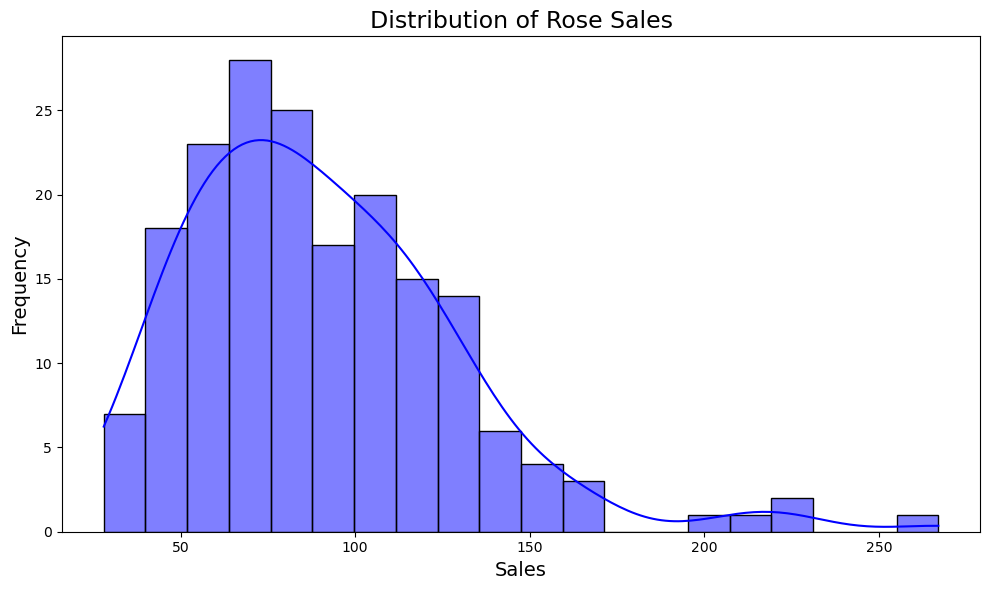

<Figure size 1000x600 with 0 Axes>

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='Sparkling', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Sparkling Sales')

Text(0.5, 0, 'Sales')

Text(0, 0.5, 'Frequency')

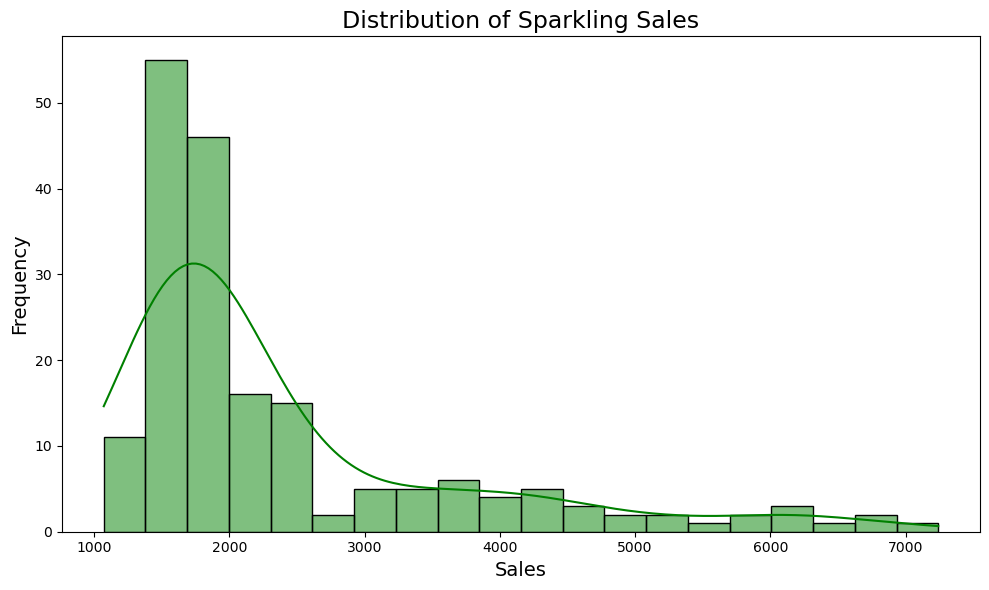

In [10]:
# Rose Sales Distribution
plt.figure(figsize=(10, 6))
sns.histplot(rose_data['Rose'], kde=True, color='blue', bins=20)
plt.title('Distribution of Rose Sales', fontsize=17)
plt.xlabel('Sales', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.tight_layout()
plt.show()

# Sparkling Sales Distribution
plt.figure(figsize=(10, 6))
sns.histplot(sparkling_data['Sparkling'], kde=True, color='green', bins=20)
plt.title('Distribution of Sparkling Sales', fontsize=17)
plt.xlabel('Sales', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.tight_layout()
plt.show()

In [11]:
# Correlation analysis between Rose and Sparkling sales
correlation = rose_data['Rose'].corr(sparkling_data['Sparkling'])
print("Correlation between Rose and Sparkling sales:", correlation)

Correlation between Rose and Sparkling sales: 0.4045790477054335


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='YearMonth', ylabel='Rose'>

Text(0.5, 1.0, 'Monthly Boxplot of Rose Sales')

Text(0.5, 0, 'Month')

Text(0, 0.5, 'Sales')

([<matplotlib.axis.XTick at 0x221e45dd650>,
 [Text(0, 0, 'Jan'),
  Text(1, 0, 'Feb'),
  Text(2, 0, 'Mar'),
  Text(3, 0, 'Apr'),
  Text(4, 0, 'May'),
  Text(5, 0, 'Jun'),
  Text(6, 0, 'Jul'),
  Text(7, 0, 'Aug'),
  Text(8, 0, 'Sep'),
  Text(9, 0, 'Oct'),
  Text(10, 0, 'Nov'),
  Text(11, 0, 'Dec')])

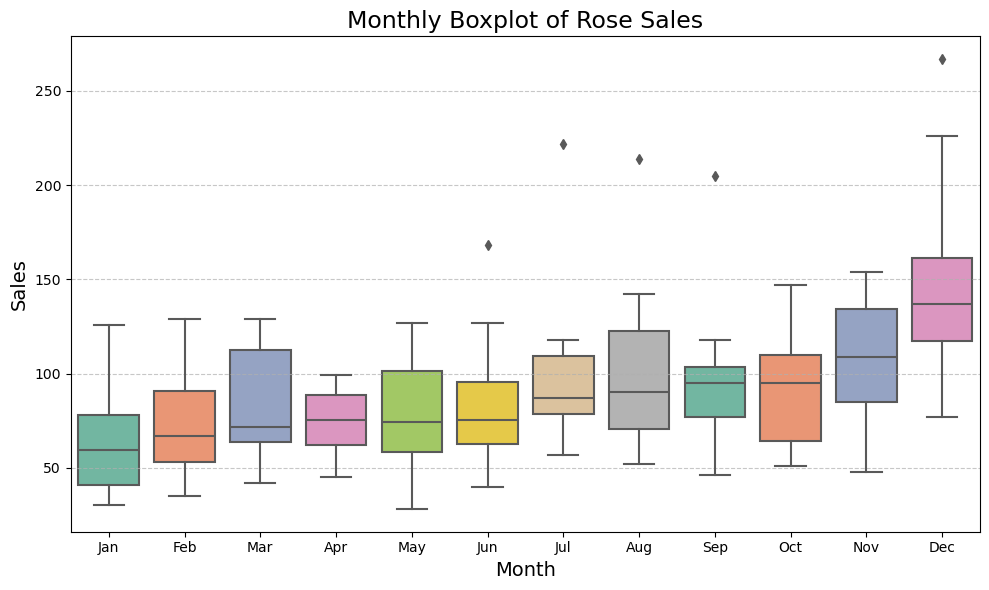

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='YearMonth', ylabel='Sparkling'>

Text(0.5, 1.0, 'Monthly Boxplot of Sparkling Sales')

Text(0.5, 0, 'Month')

Text(0, 0.5, 'Sales')

([<matplotlib.axis.XTick at 0x221e64b1090>,
 [Text(0, 0, 'Jan'),
  Text(1, 0, 'Feb'),
  Text(2, 0, 'Mar'),
  Text(3, 0, 'Apr'),
  Text(4, 0, 'May'),
  Text(5, 0, 'Jun'),
  Text(6, 0, 'Jul'),
  Text(7, 0, 'Aug'),
  Text(8, 0, 'Sep'),
  Text(9, 0, 'Oct'),
  Text(10, 0, 'Nov'),
  Text(11, 0, 'Dec')])

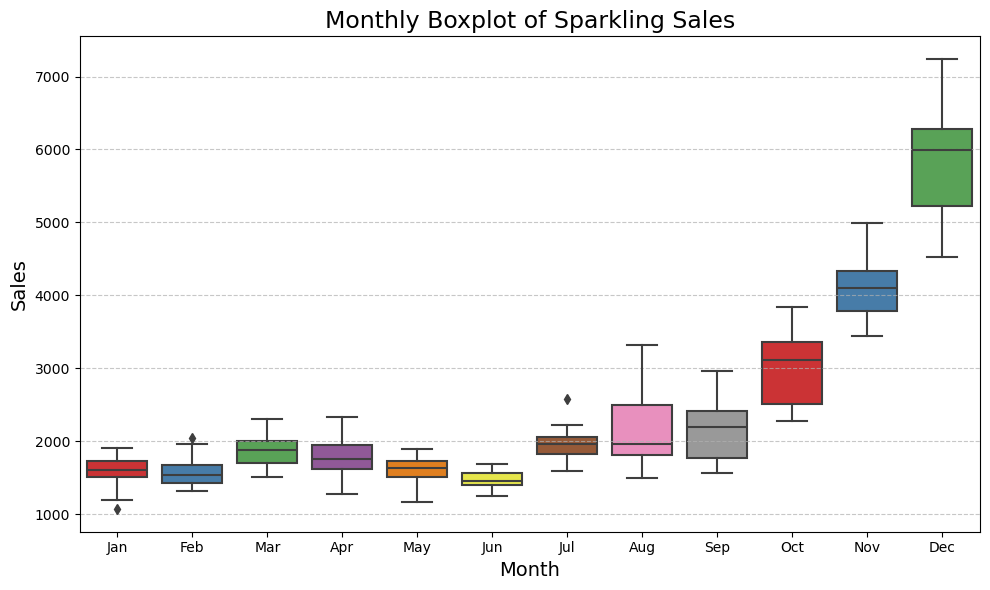

In [12]:

# Monthly Boxplot for Rose data
plt.figure(figsize=(10, 6))
sns.boxplot(x=rose_data.index.month, y=rose_data['Rose'], palette='Set2')
plt.title('Monthly Boxplot of Rose Sales', fontsize=17)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Monthly Boxplot for Sparkling data
plt.figure(figsize=(10, 6))
sns.boxplot(x=sparkling_data.index.month, y=sparkling_data['Sparkling'], palette='Set1')
plt.title('Monthly Boxplot of Sparkling Sales', fontsize=17)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 4. Perform Decomposition

##### Note

- Decomposition functions cannot handle missing values, so addressing these gaps is crucial for obtaining accurate and reliable results from the decomposition process.
Here ,Rose dataset has missing values.
- To perform the decomposition of Rose wine sales, it is essential to treat the missing values in the Rose dataset first.

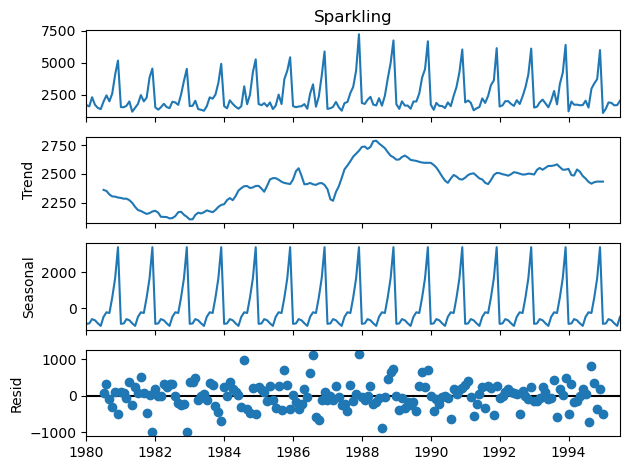

Text(0.5, 0.98, 'Decomposition of Sparkling Wine Sales')

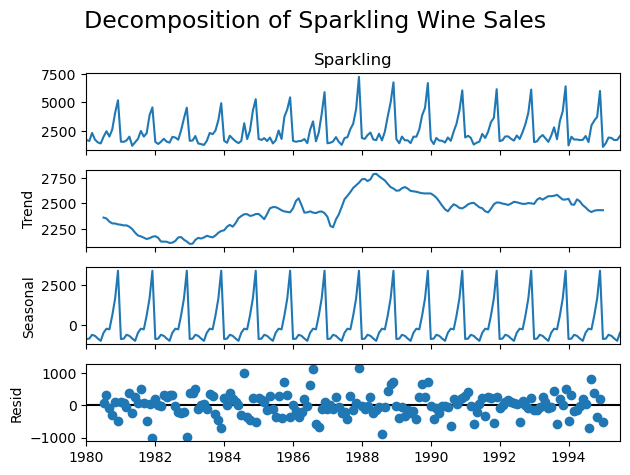

In [13]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Decompose Sparkling Wine Sales
sparkling_decomp = seasonal_decompose(sparkling_data['Sparkling'], model='additive', period=12)
sparkling_decomp.plot()
plt.suptitle('Decomposition of Sparkling Wine Sales', fontsize=17)
plt.tight_layout()
plt.show()

### B.Data Pre-processing

#### 1.Missing value treatment

In [14]:
# Check for missing values in Rose dataset 
rose_data.isnull().sum()
print("Missing values in Rose dataset before fillng:\n", rose_data)

# Check for missing values in Sparkling dataset
sparkling_data.isnull().sum()
print("\nMissing values in Sparkling dataset:\n", sparkling_data)


Rose    2
dtype: int64

Missing values in Rose dataset before fillng:
              Rose
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0
...           ...
1995-03-01   45.0
1995-04-01   52.0
1995-05-01   28.0
1995-06-01   40.0
1995-07-01   62.0

[187 rows x 1 columns]


Sparkling    0
dtype: int64


Missing values in Sparkling dataset:
             Sparkling
YearMonth            
1980-01-01       1686
1980-02-01       1591
1980-03-01       2304
1980-04-01       1712
1980-05-01       1471
...               ...
1995-03-01       1897
1995-04-01       1862
1995-05-01       1670
1995-06-01       1688
1995-07-01       2031

[187 rows x 1 columns]


In [15]:
# Fill missing values in Rose dataset using forward filling
rose_data['Rose'].fillna(method='ffill', inplace=True)

# Check for missing values in Rose dataset after forward filling
rose_missing_values_after_fill = rose_data.isnull().sum()
print("Missing values in Rose dataset after forward filling:\n", rose_missing_values_after_fill)

Missing values in Rose dataset after forward filling:
 Rose    0
dtype: int64


C:\Users\Benita Merlin E\AppData\Local\Temp\ipykernel_1968\2839033747.py:2: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [16]:
# Check for missing values in Rose dataset
rose_missing_values_final = rose_data.isnull().sum()
print("Missing values in Rose dataset:\n", rose_missing_values_final)

# Check for missing values in Sparkling dataset
sparkling_missing_values_final = sparkling_data.isnull().sum()
print("\nMissing values in Sparkling dataset:\n", sparkling_missing_values_final)


Missing values in Rose dataset:
 Rose    0
dtype: int64

Missing values in Sparkling dataset:
 Sparkling    0
dtype: int64


#### (A._4.Perform Decomposition for Rose data)

<Figure size 1000x600 with 0 Axes>

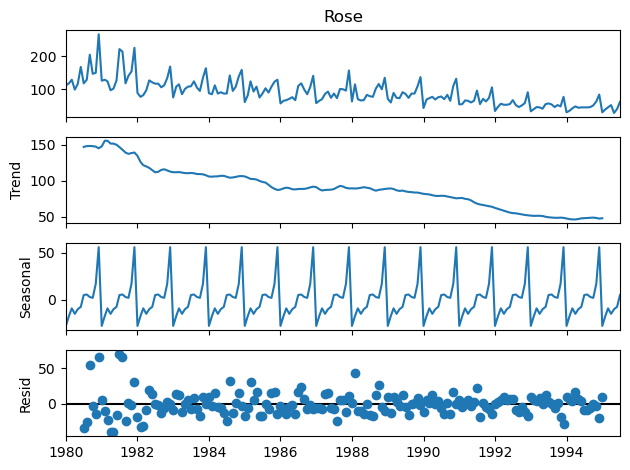

Text(0.5, 1.02, 'Seasonal Decomposition of Rose Sales')

<Figure size 1000x600 with 0 Axes>

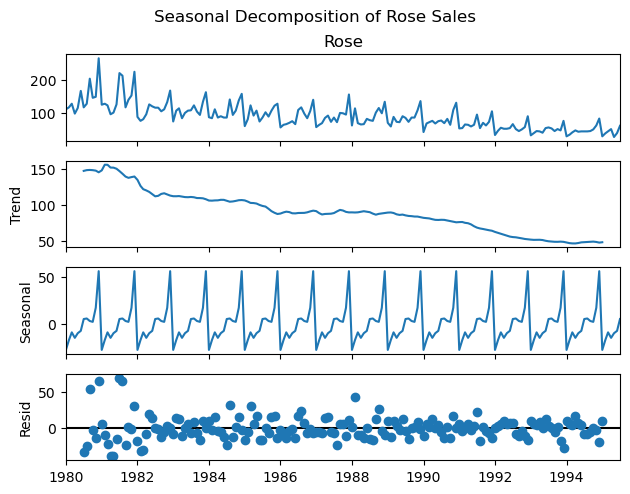

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform seasonal decomposition for Rose sales
rose_decomposition = seasonal_decompose(rose_data['Rose'], model='additive', period=12)

# Plot seasonal decomposition for Rose sales
plt.figure(figsize=(10, 6))
rose_decomposition.plot()
plt.suptitle('Seasonal Decomposition of Rose Sales', y=1.02)
plt.show()




Trend 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01    147.083333
1980-08-01    148.125000
1980-09-01    148.375000
1980-10-01    148.083333
1980-11-01    147.416667
1980-12-01    145.125000
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01   -27.903092
1980-02-01   -17.431663
1980-03-01    -9.279878
1980-04-01   -15.092378
1980-05-01   -10.190592
1980-06-01    -7.672735
1980-07-01     4.880241
1980-08-01     5.460797
1980-09-01     2.780241
1980-10-01     1.877464
1980-11-01    16.852464
1980-12-01    55.719130
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01          NaN
1980-02-01          NaN
1980-03-01          NaN
1980-04-01          NaN
1980-05-01          NaN
1980-06-01          NaN
1980-07-01   -33.963575
1980-08-01   -24.585797
1980-09-01    53.844759
1980-10-01    -2.960797
1980-11-01   -14.269130
1980-12-01    66.15587

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='YearMonth'>

Text(0.5, 1.0, 'Residual Component of Rose Wine Sales')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Residual')

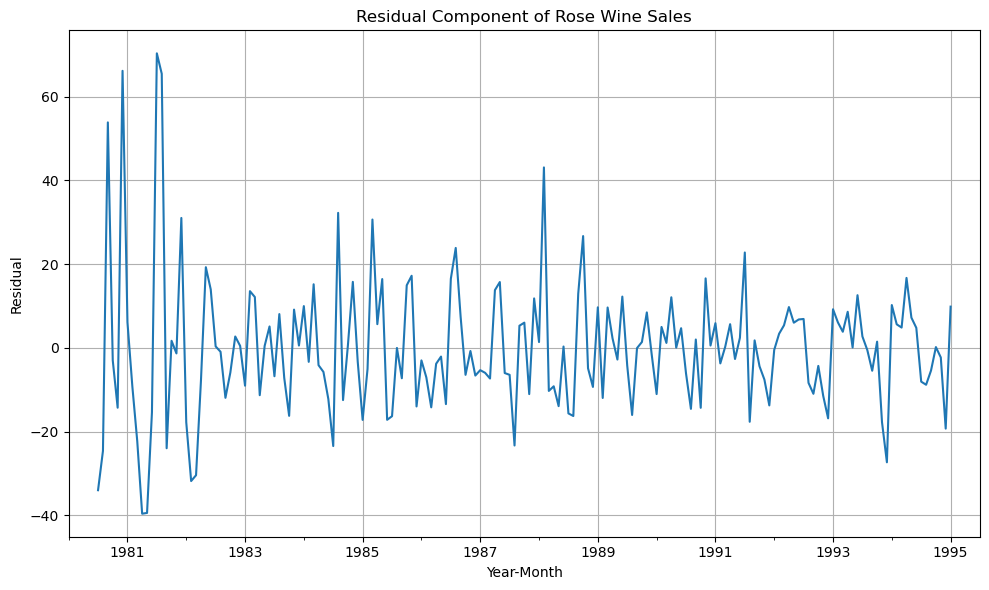

In [18]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform seasonal decomposition for Rose dataset
decomposition_rose = seasonal_decompose(rose_data['Rose'], model='additive', period=12)

# Extract trend, seasonality, and residual components
trend_rose = decomposition_rose.trend
seasonality_rose = decomposition_rose.seasonal
residual_rose = decomposition_rose.resid

# Print and save trend, seasonality, and residual components for Rose dataset
print('Trend', '\n', trend_rose.head(12), '\n')
print('Seasonality', '\n', seasonality_rose.head(12), '\n')
print('Residual', '\n', residual_rose.head(12), '\n')

trend_rose.head(12).to_csv('rose_trend_m.csv')
seasonality_rose.head(12).to_csv('rose_season_m.csv')
residual_rose.head(12).to_csv('rose_resid_m.csv')

import matplotlib.pyplot as plt

# Plot the residual component
plt.figure(figsize=(10, 6))
residual_rose.plot()
plt.title('Residual Component of Rose Wine Sales')
plt.xlabel('Year-Month')
plt.ylabel('Residual')
plt.grid(True)
plt.tight_layout()
plt.show()


In [280]:
# Calculate coefficient of variation for the residual component
cvsm = residual_rose.std() / residual_rose.mean()
print("Coefficient of Variation for the Residual Component:", cvsm)


Coefficient of Variation for the Residual Component: -204.47574842057438


Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    -854.260599
1980-02-01    -830.350678
1980-03-01    -592.356630
1980-04-01    -658.490559
1980-05-01    -824.416154
1980-06-01    -967.434011
1980-07-01    -465.502265
1980-08-01    -214.332821
1980-09-01    -254.677265
1980-10-01     599.769957
1980-11-01    1675.067179
1980-12-01    3386.983846
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01     70.835599
1980-08-01    315.999487
1980-09-01    -81.864401
1980-10-01   -307.353290


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='YearMonth'>

Text(0.5, 1.0, 'Residual Component of sparkling Wine Sales')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Residual')

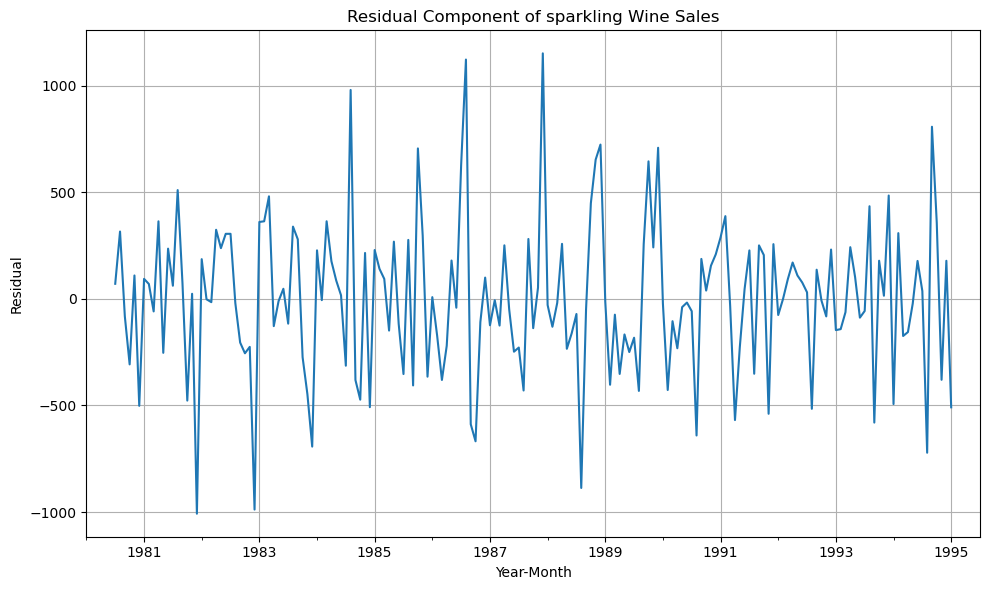

In [19]:
# Perform seasonal decomposition for Sparkling dataset
decomposition_sparkling = seasonal_decompose(sparkling_data['Sparkling'], model='additive', period=12)

# Extract trend, seasonality, and residual components for Sparkling dataset
trend_sparkling = decomposition_sparkling.trend
seasonality_sparkling = decomposition_sparkling.seasonal
residual_sparkling = decomposition_sparkling.resid

# Print and save trend, seasonality, and residual components for Sparkling dataset
print('Trend', '\n', trend_sparkling.head(12), '\n')
print('Seasonality', '\n', seasonality_sparkling.head(12), '\n')
print('Residual', '\n', residual_sparkling.head(12), '\n')

trend_sparkling.head(12).to_csv('spark_trend_m.csv')
seasonality_sparkling.head(12).to_csv('spark_season_m.csv')
residual_sparkling.head(12).to_csv('spark_resid_m.csv')

import matplotlib.pyplot as plt

# Plot the residual component
plt.figure(figsize=(10, 6))
residual_sparkling.plot()
plt.title('Residual Component of sparkling Wine Sales')
plt.xlabel('Year-Month')
plt.ylabel('Residual')
plt.grid(True)
plt.tight_layout()
plt.show()

In [20]:
# Calculate coefficient of variation for the residual component
cvsm = residual_sparkling.std() / residual_sparkling.mean()
print("Coefficient of Variation for the Residual Component:", cvsm)


Coefficient of Variation for the Residual Component: -296.0833529414275


#### 2.Visualize the processed data

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Rose Wine Sales Over Time')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Sales')

(array([2922., 3652., 4383., 5113., 5844., 6574., 7305., 8035., 8766.,
        9496.]),
 [Text(2922.0, 0, '1978'),
  Text(3652.0, 0, '1980'),
  Text(4383.0, 0, '1982'),
  Text(5113.0, 0, '1984'),
  Text(5844.0, 0, '1986'),
  Text(6574.0, 0, '1988'),
  Text(7305.0, 0, '1990'),
  Text(8035.0, 0, '1992'),
  Text(8766.0, 0, '1994'),
  Text(9496.0, 0, '1996')])

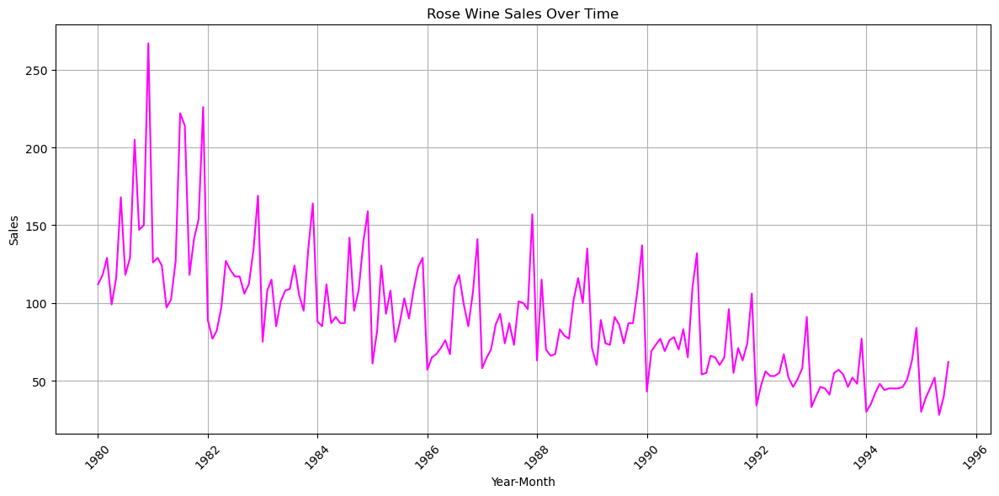

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Sparkling Wine Sales Over Time')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Sales')

(array([2922., 3652., 4383., 5113., 5844., 6574., 7305., 8035., 8766.,
        9496.]),
 [Text(2922.0, 0, '1978'),
  Text(3652.0, 0, '1980'),
  Text(4383.0, 0, '1982'),
  Text(5113.0, 0, '1984'),
  Text(5844.0, 0, '1986'),
  Text(6574.0, 0, '1988'),
  Text(7305.0, 0, '1990'),
  Text(8035.0, 0, '1992'),
  Text(8766.0, 0, '1994'),
  Text(9496.0, 0, '1996')])

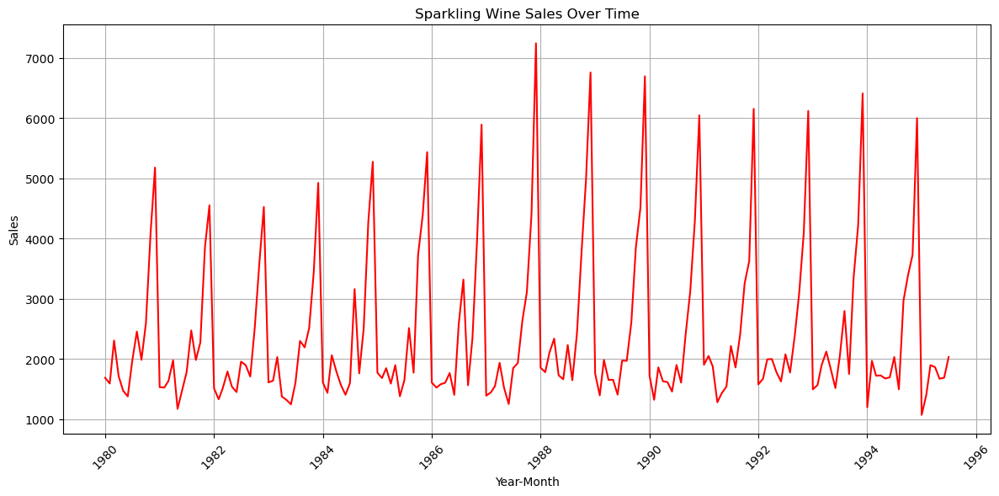

In [21]:
# Plotting Rose dataset
plt.figure(figsize=(12, 6))
plt.plot(rose_data.index, rose_data['Rose'], color='magenta')
plt.title('Rose Wine Sales Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sales')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plotting Sparkling dataset
plt.figure(figsize=(12, 6))
plt.plot(sparkling_data.index, sparkling_data['Sparkling'], color='red')
plt.title('Sparkling Wine Sales Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sales')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### 3.Train-test split

In [22]:
from sklearn.model_selection import train_test_split

# Reset index to have 'YearMonth' as a column
rose_data.reset_index(inplace=True)
sparkling_data.reset_index(inplace=True)

# Train-test split for Rose dataset
rose_train, rose_test = train_test_split(rose_data, test_size=0.2, shuffle=False)

# Train-test split for Sparkling dataset
sparkling_train, sparkling_test = train_test_split(sparkling_data, test_size=0.2, shuffle=False)

# Display shapes of train and test sets
print("Rose Train shape:", rose_train.shape)
print("Rose Test shape:", rose_test.shape)
print("Sparkling Train shape:", sparkling_train.shape)
print("Sparkling Test shape:", sparkling_test.shape)


Rose Train shape: (149, 2)
Rose Test shape: (38, 2)
Sparkling Train shape: (149, 2)
Sparkling Test shape: (38, 2)


In [23]:
# Printing and saving Rose training and testing sets
print('First few rows of Rose Training Data')
display(rose_train.head())
print('Last few rows of Rose Training Data')
display(rose_train.tail())
print('First few rows of Rose Test Data')
display(rose_test.head())
print('Last few rows of Rose Test Data')
display(rose_test.tail())

rose_train.to_csv('rose_train.csv', index=False)
rose_test.to_csv('rose_test.csv', index=False)


# Printing and saving Sparkling training and testing sets
print('First few rows of Sparkling Training Data')
display(sparkling_train.head())
print('Last few rows of Sparkling Training Data')
display(sparkling_train.tail())
print('First few rows of Sparkling Test Data')
display(sparkling_test.head())
print('Last few rows of Sparkling Test Data')
display(sparkling_test.tail())

sparkling_train.to_csv('sparkling_train.csv', index=False)
sparkling_test.to_csv('sparkling_test.csv', index=False)


First few rows of Rose Training Data


,YearMonth,Rose
0,1980-01-01,112.0
1,1980-02-01,118.0
2,1980-03-01,129.0
3,1980-04-01,99.0
4,1980-05-01,116.0


Last few rows of Rose Training Data


,YearMonth,Rose
144,1992-01-01,34.0
145,1992-02-01,47.0
146,1992-03-01,56.0
147,1992-04-01,53.0
148,1992-05-01,53.0


First few rows of Rose Test Data


,YearMonth,Rose
149,1992-06-01,55.0
150,1992-07-01,67.0
151,1992-08-01,52.0
152,1992-09-01,46.0
153,1992-10-01,51.0


Last few rows of Rose Test Data


,YearMonth,Rose
182,1995-03-01,45.0
183,1995-04-01,52.0
184,1995-05-01,28.0
185,1995-06-01,40.0
186,1995-07-01,62.0


First few rows of Sparkling Training Data


,YearMonth,Sparkling
0,1980-01-01,1686
1,1980-02-01,1591
2,1980-03-01,2304
3,1980-04-01,1712
4,1980-05-01,1471


Last few rows of Sparkling Training Data


,YearMonth,Sparkling
144,1992-01-01,1577
145,1992-02-01,1667
146,1992-03-01,1993
147,1992-04-01,1997
148,1992-05-01,1783


First few rows of Sparkling Test Data


,YearMonth,Sparkling
149,1992-06-01,1625
150,1992-07-01,2076
151,1992-08-01,1773
152,1992-09-01,2377
153,1992-10-01,3088


Last few rows of Sparkling Test Data


,YearMonth,Sparkling
182,1995-03-01,1897
183,1995-04-01,1862
184,1995-05-01,1670
185,1995-06-01,1688
186,1995-07-01,2031


<Figure size 1200x600 with 0 Axes>

<Axes: xlabel='YearMonth'>

<Axes: xlabel='YearMonth'>

Text(0.5, 1.0, 'Rose Data Train and Test Split')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Sales')

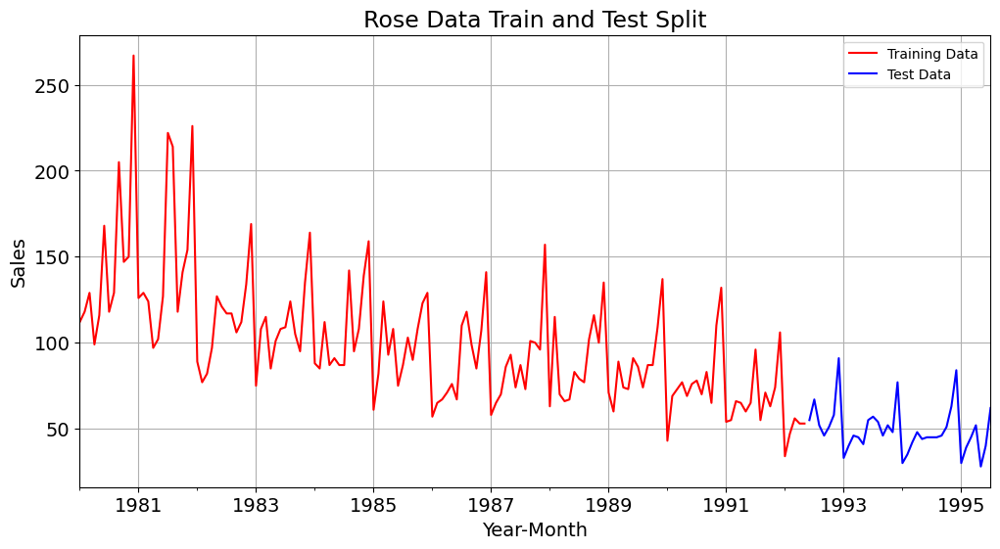

In [24]:
# Splitting the data into training and testing sets
# Assuming 'YearMonth' column contains datetime information
rose_data['YearMonth'] = pd.to_datetime(rose_data['YearMonth'])
rose_data.set_index('YearMonth', inplace=True)

train_ratio = 0.8  # 80% for training, 20% for testing
split_index = int(len(rose_data) * train_ratio)
rtrain = rose_data.iloc[:split_index]
rtest = rose_data.iloc[split_index:]

# Plotting Rose data train and test split
plt.figure(figsize=(12, 6))
rtrain['Rose'].plot(fontsize=14, color='red')
rtest['Rose'].plot(fontsize=14, color='blue')
plt.grid()
plt.legend(['Training Data', 'Test Data'])
plt.title('Rose Data Train and Test Split', fontsize=17)
plt.xlabel('Year-Month', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.savefig('rose_split_ts.jpg', bbox_inches='tight')
plt.show()


<Figure size 1200x600 with 0 Axes>

<Axes: xlabel='YearMonth'>

<Axes: xlabel='YearMonth'>

Text(0.5, 1.0, 'Sparkling Data Train and Test Split')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Sales')

(array([132, 156, 180, 204, 228, 252, 276, 300]),
 [Text(132, 0, '1981'),
  Text(156, 0, '1983'),
  Text(180, 0, '1985'),
  Text(204, 0, '1987'),
  Text(228, 0, '1989'),
  Text(252, 0, '1991'),
  Text(276, 0, '1993'),
  Text(300, 0, '1995')])

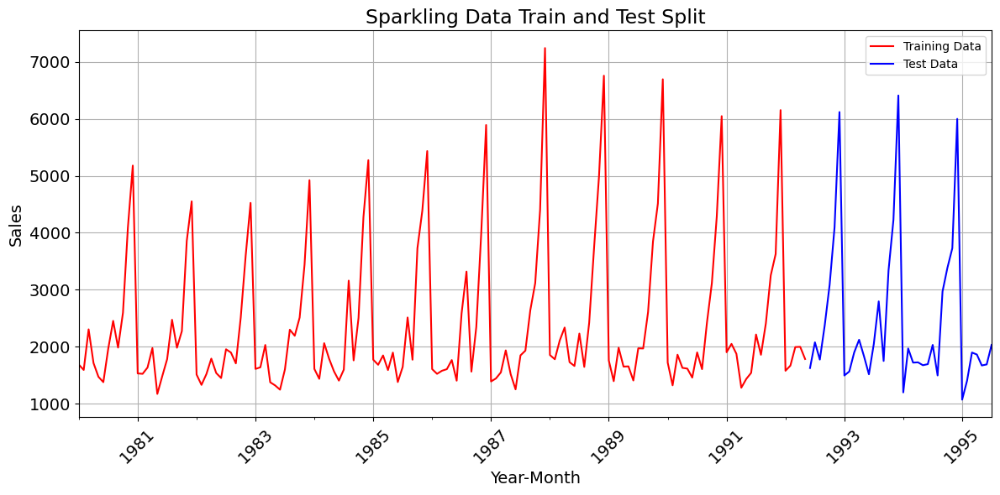

In [25]:
# Splitting the data into training and testing sets
# Assuming 'YearMonth' column contains datetime information
sparkling_data['YearMonth'] = pd.to_datetime(sparkling_data['YearMonth'])
sparkling_data.set_index('YearMonth', inplace=True)

train_ratio = 0.8  # 80% for training, 20% for testing
split_index = int(len(sparkling_data) * train_ratio)
strain = sparkling_data.iloc[:split_index]
stest = sparkling_data.iloc[split_index:]

# Plotting Sparkling data train and test split
plt.figure(figsize=(12, 6))
strain['Sparkling'].plot(fontsize=14, color='red')
stest['Sparkling'].plot(fontsize=14, color='blue')
plt.grid()
plt.legend(['Training Data', 'Test Data'])
plt.title('Sparkling Data Train and Test Split', fontsize=17)
plt.xlabel('Year-Month', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.savefig('spark_split_ts.jpg', bbox_inches='tight')
plt.show()


### C.  Model Building - Original Data

### Model 1- Linear regression

##### Rose

In [26]:
rtrain.shape
rtest.shape

(149, 1)

(38, 1)

In [27]:
train_time = [i+1 for i in range(len(rtrain))]
test_time = [i+133 for i in range(len(rtest))]
print('Training Time Instance :','\n',train_time)
print('Test Time Instance :','\n',test_time)

Training Time Instance : 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149]
Test Time Instance : 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170]


In [28]:
LinearRegression_train = rtrain.copy()
LinearRegression_test = rtest.copy()

In [29]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data')
display(LinearRegression_train.head())
print('Last few rows of Training Data')
display(LinearRegression_train.tail())
print('First few rows of Test Data')
display(LinearRegression_test.head())
print('Last few rows of Test Data')
display(LinearRegression_test.tail())

First few rows of Training Data


,Rose,time
YearMonth,,
1980-01-01,112.0,1
1980-02-01,118.0,2
1980-03-01,129.0,3
1980-04-01,99.0,4
1980-05-01,116.0,5


Last few rows of Training Data


,Rose,time
YearMonth,,
1992-01-01,34.0,145
1992-02-01,47.0,146
1992-03-01,56.0,147
1992-04-01,53.0,148
1992-05-01,53.0,149


First few rows of Test Data


,Rose,time
YearMonth,,
1992-06-01,55.0,133
1992-07-01,67.0,134
1992-08-01,52.0,135
1992-09-01,46.0,136
1992-10-01,51.0,137


Last few rows of Test Data


,Rose,time
YearMonth,,
1995-03-01,45.0,166
1995-04-01,52.0,167
1995-05-01,28.0,168
1995-06-01,40.0,169
1995-07-01,62.0,170


In [30]:
from sklearn.linear_model import LinearRegression

In [31]:
lr = LinearRegression()

In [32]:
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Rose'])

LinearRegression()

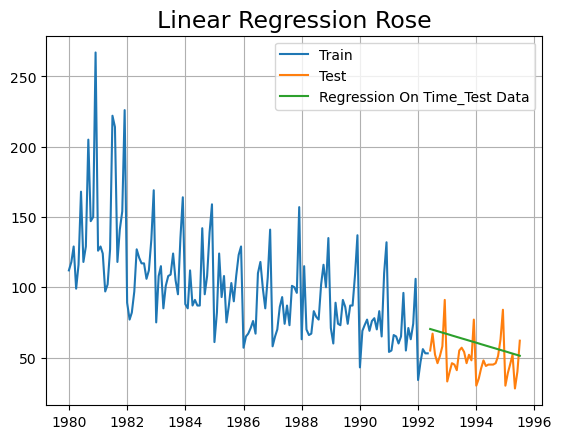

In [33]:
train_predictions_model1         = lr.predict(LinearRegression_train[['time']])
LinearRegression_train['RegOnTime'] = train_predictions_model1

test_predictions_model1         = lr.predict(LinearRegression_test[['time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

plt.plot(rtrain['Rose'], label='Train')
plt.plot(rtest['Rose'], label='Test')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')
plt.title('Linear Regression Rose', fontsize=17)
plt.legend(loc='best')
plt.grid();
plt.savefig('lr_rose.jpg', bbox_inches='tight');

In [34]:
from sklearn import metrics

In [35]:
rmse_model11_test = metrics.mean_squared_error(rtest['Rose'],test_predictions_model1,squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f " %(rmse_model11_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 17.510 


In [36]:
resultsDf = pd.DataFrame({'Test RMSE Rose': [rmse_model11_test]},index=['RegressionOnTime'])
resultsDf

,Test RMSE Rose
RegressionOnTime,17.510241


##### Sparkling

In [37]:
train_time = [i+1 for i in range(len(strain))]
test_time = [i+133 for i in range(len(stest))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149]
Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170]


In [38]:
LinearRegression_train = strain.copy()
LinearRegression_test = stest.copy()

In [39]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data')
display(LinearRegression_train.head())
print('Last few rows of Training Data')
display(LinearRegression_train.tail())
print('First few rows of Test Data')
display(LinearRegression_test.head())
print('Last few rows of Test Data')
display(LinearRegression_test.tail())

First few rows of Training Data


,Sparkling,time
YearMonth,,
1980-01-01,1686,1
1980-02-01,1591,2
1980-03-01,2304,3
1980-04-01,1712,4
1980-05-01,1471,5


Last few rows of Training Data


,Sparkling,time
YearMonth,,
1992-01-01,1577,145
1992-02-01,1667,146
1992-03-01,1993,147
1992-04-01,1997,148
1992-05-01,1783,149


First few rows of Test Data


,Sparkling,time
YearMonth,,
1992-06-01,1625,133
1992-07-01,2076,134
1992-08-01,1773,135
1992-09-01,2377,136
1992-10-01,3088,137


Last few rows of Test Data


,Sparkling,time
YearMonth,,
1995-03-01,1897,166
1995-04-01,1862,167
1995-05-01,1670,168
1995-06-01,1688,169
1995-07-01,2031,170


In [40]:
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sparkling'])

LinearRegression()

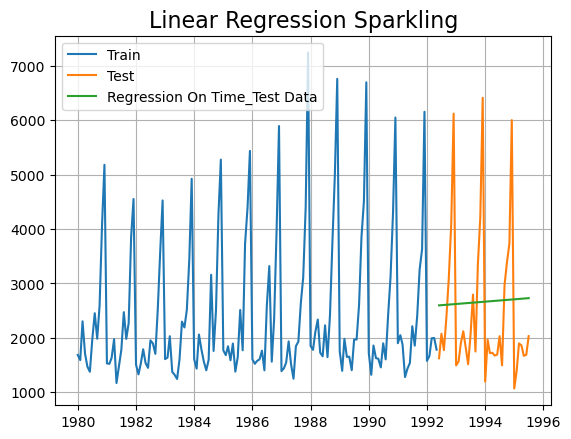

In [41]:
train_predictions_model1         = lr.predict(LinearRegression_train[['time']])
LinearRegression_train['RegOnTime'] = train_predictions_model1

test_predictions_model1         = lr.predict(LinearRegression_test[['time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

plt.plot(strain['Sparkling'], label='Train')
plt.plot(stest['Sparkling'], label='Test')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')

plt.legend(loc='best')
plt.title('Linear Regression Sparkling', fontsize=16)
plt.grid();
plt.savefig('spark_lr.jpg', bbox_inches='tight');

In [42]:
rmse_model12_test = metrics.mean_squared_error(stest['Sparkling'],test_predictions_model1,squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f " %(rmse_model12_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 1349.042 


In [43]:
resultsDf_12 = pd.DataFrame({'Test RMSE Sparkling': [rmse_model12_test]},index=['RegressionOnTime'])

resultsDf = pd.merge(resultsDf, resultsDf_12, left_index=True, right_index=True)
resultsDf.to_csv('results_lr.csv')
resultsDf


,Test RMSE Rose,Test RMSE Sparkling
RegressionOnTime,17.510241,1349.042457


### Model 2- Simple Average

##### Sparkling & Rose

In [44]:
# Creating copies of train and test data for Rose
SimpleAverage_train_rose = rtrain.copy()
SimpleAverage_test_rose = rtest.copy()

# Calculating the mean forecast using training data
SimpleAverage_test_rose['mean_forecast'] = rtrain['Rose'].mean()

# Display the test dataset with the added forecast column
print("First few rows of Simple Average Test Data (Rose):")
print(SimpleAverage_test_rose.head())

First few rows of Simple Average Test Data (Rose):
            Rose  mean_forecast
YearMonth                      
1992-06-01  55.0     100.167785
1992-07-01  67.0     100.167785
1992-08-01  52.0     100.167785
1992-09-01  46.0     100.167785
1992-10-01  51.0     100.167785


In [45]:
# Creating copies of train and test data for Sparkling
SimpleAverage_train_sparkling = strain.copy()
SimpleAverage_test_sparkling = stest.copy()

# Calculating the mean forecast using training data
SimpleAverage_test_sparkling['mean_forecast'] = strain['Sparkling'].mean()

# Display the test dataset with the added forecast column
print("First few rows of Simple Average Test Data (Sparkling):")
print(SimpleAverage_test_sparkling.head())

First few rows of Simple Average Test Data (Sparkling):
            Sparkling  mean_forecast
YearMonth                           
1992-06-01       1625    2388.610738
1992-07-01       2076    2388.610738
1992-08-01       1773    2388.610738
1992-09-01       2377    2388.610738
1992-10-01       3088    2388.610738


<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Simple Average Forecast - Rose')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Sales')

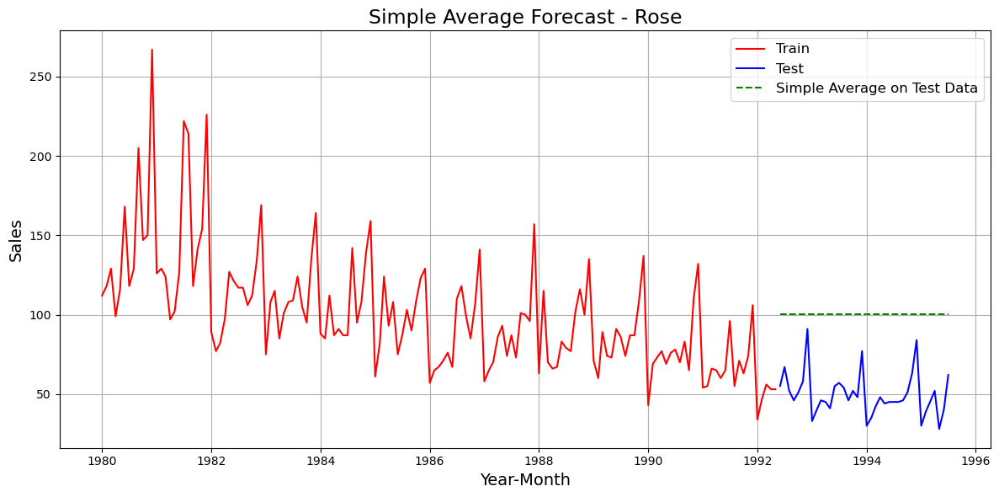

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Simple Average Forecast - Sparkling')

Text(0.5, 0, 'Year-Month')

Text(0, 0.5, 'Sales')

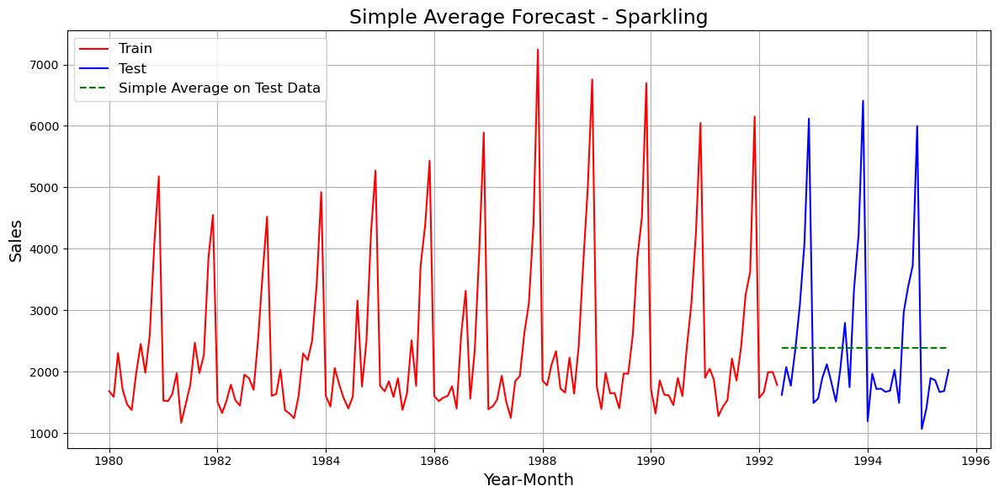

In [46]:
# for rose
plt.figure(figsize=(12, 6))  # Set figure size

# Plot the training data
plt.plot(SimpleAverage_train_rose['Rose'], label='Train', color='red')

# Plot the actual test data
plt.plot(SimpleAverage_test_rose['Rose'], label='Test', color='blue')

# Plot the Simple Average forecast
plt.plot(SimpleAverage_test_rose['mean_forecast'], label='Simple Average on Test Data', color='green', linestyle='--')

# Add plot details
plt.legend(loc='best', fontsize=12)
plt.title("Simple Average Forecast - Rose", fontsize=17)
plt.xlabel("Year-Month", fontsize=14)
plt.ylabel("Sales", fontsize=14)
plt.grid()
plt.tight_layout()  # Adjust layout to prevent label clipping

# Save the plot as an image file
plt.savefig('rose_simpleaverage.jpg', bbox_inches='tight')

# Display the plot
plt.show()

# for sparlng
plt.figure(figsize=(12, 6))  # Set figure size

# Plot the training data
plt.plot(SimpleAverage_train_sparkling['Sparkling'], label='Train', color='red')

# Plot the actual test data
plt.plot(SimpleAverage_test_sparkling['Sparkling'], label='Test', color='blue')

# Plot the Simple Average forecast
plt.plot(SimpleAverage_test_sparkling['mean_forecast'], label='Simple Average on Test Data', color='green', linestyle='--')

# Add plot details
plt.legend(loc='best', fontsize=12)
plt.title("Simple Average Forecast - Sparkling", fontsize=17)
plt.xlabel("Year-Month", fontsize=14)
plt.ylabel("Sales", fontsize=14)
plt.grid()
plt.tight_layout()  # Adjust layout to prevent label clipping

# Save the plot as an image file
plt.savefig('Sparkling_simpleaverage.jpg', bbox_inches='tight')

# Display the plot
plt.show()



In [47]:
# RMSE for Simple Average forecast on Rose Test Data
rmse_model31_test = metrics.mean_squared_error(rtest['Rose'],SimpleAverage_test_rose['mean_forecast'],squared=False)
print("For Simple Average forecast on Rose Test Data,  RMSE is %3.3f" %(rmse_model31_test))

# RMSE for Simple Average forecast on Sparkling Test Data
rmse_model32_test = metrics.mean_squared_error(stest['Sparkling'],SimpleAverage_test_sparkling['mean_forecast'],squared=False)
print("For Simple Average forecast on Sparkling Test Data,  RMSE is %3.3f" %(rmse_model32_test))




For Simple Average forecast on Rose Test Data,  RMSE is 52.239
For Simple Average forecast on Sparkling Test Data,  RMSE is 1331.038


In [48]:
resultsDf_32 = pd.DataFrame({'Test RMSE Sparkling': [rmse_model32_test]}
                           ,index=['SimpleAverageModel'])
resultsDf_32

resultsDf_31 = pd.DataFrame({'Test RMSE Rose': [rmse_model31_test]}
                           ,index=['SimpleAverageModel'])
resultsDf_31


,Test RMSE Sparkling
SimpleAverageModel,1331.037637


,Test RMSE Rose
SimpleAverageModel,52.239499


In [49]:
resultsDf4 = resultsDf_31.join(resultsDf_32, how='outer')
resultsDf4

,Test RMSE Rose,Test RMSE Sparkling
SimpleAverageModel,52.239499,1331.037637


In [50]:
resultsDf5 = pd.concat([resultsDf4], axis=0)
resultsDf5

,Test RMSE Rose,Test RMSE Sparkling
SimpleAverageModel,52.239499,1331.037637


In [51]:
# Create DataFrames for both RMSE results
resultsDf_31 = pd.DataFrame({'Test RMSE Rose': [rmse_model31_test]}, index=['SimpleAverageModel'])
resultsDf_32 = pd.DataFrame({'Test RMSE Sparkling': [rmse_model32_test]}, index=['SimpleAverageModel'])

# Concatenate the two DataFrames side by side
resultsDf5 = pd.concat([resultsDf_31, resultsDf_32], axis=1)
# Print the combined DataFrame
print(resultsDf5)


                    Test RMSE Rose  Test RMSE Sparkling
SimpleAverageModel       52.239499          1331.037637


### Model 3- Moving Average

#### Rose

In [52]:
MovingAverage = rose_data.copy()
MovingAverage.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [53]:

MovingAverage['Trailing_2'] = MovingAverage['Rose'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Rose'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Rose'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Rose'].rolling(9).mean()

MovingAverage.head()

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.5,NaN,NaN
1980-05-01,116.0,107.5,115.5,NaN,NaN


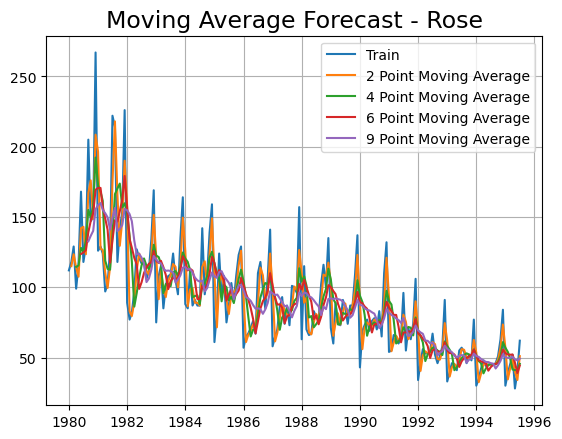

In [54]:
## Plotting on the whole data

plt.plot(MovingAverage['Rose'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid();
plt.title('Moving Average Forecast - Rose', fontsize=17)
plt.savefig('rose_ma.jpg', bbox_inches='tight');

In [55]:
#Creating train and test set 
trailing_MovingAverage_train=MovingAverage[MovingAverage.index<'1991'] 
trailing_MovingAverage_test=MovingAverage[MovingAverage.index>='1991']

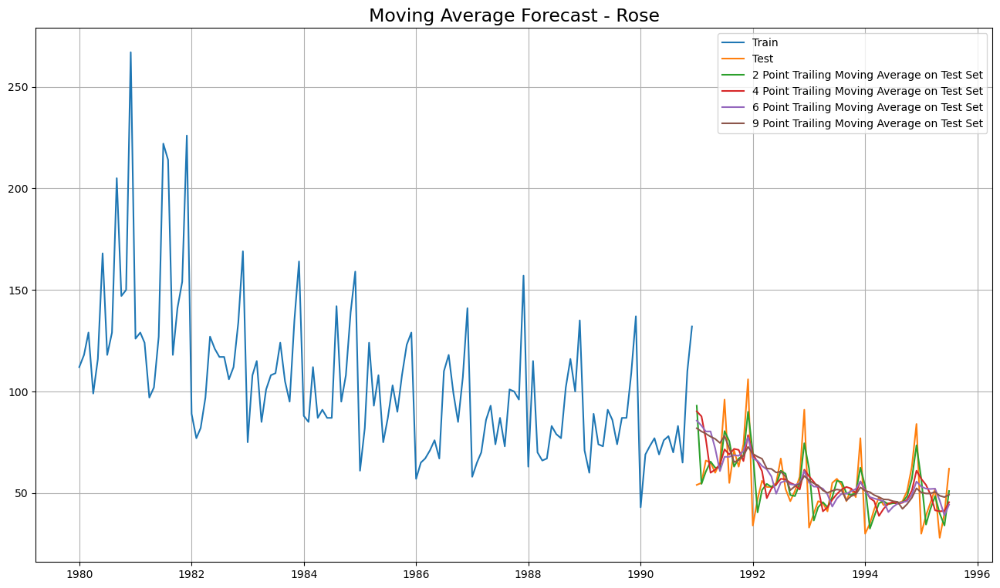

In [56]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_train['Rose'], label='Train')
plt.plot(trailing_MovingAverage_test['Rose'], label='Test')


plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')

plt.legend(loc = 'best')
plt.grid();
plt.title('Moving Average Forecast - Rose', fontsize=17);
plt.savefig('rose_ma_test.jpg', bbox_inches='tight');

In [57]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Calculate RMSE for 2-point moving average
rmse_2 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Rose'], trailing_MovingAverage_test['Trailing_2']))
print("RMSE for 2-point Moving Average:", rmse_2)

# Calculate RMSE for 4-point moving average
rmse_4 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Rose'], trailing_MovingAverage_test['Trailing_4']))
print("RMSE for 4-point Moving Average:", rmse_4)

# Calculate RMSE for 6-point moving average
rmse_6 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Rose'], trailing_MovingAverage_test['Trailing_6']))
print("RMSE for 6-point Moving Average:", rmse_6)

# Calculate RMSE for 9-point moving average
rmse_9 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Rose'], trailing_MovingAverage_test['Trailing_9']))
print("RMSE for 9-point Moving Average:", rmse_9)


RMSE for 2-point Moving Average: 11.529409036341487
RMSE for 4-point Moving Average: 14.455220824702371
RMSE for 6-point Moving Average: 14.572008589876495
RMSE for 9-point Moving Average: 14.731209378114992


In [58]:
resultsDf_41 = pd.DataFrame({'Test RMSE Rose': [rmse_2,rmse_4,rmse_6,rmse_9]}
                           ,index=['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'])
resultsDf_41.to_csv('rose_ma.csv')
resultsDf_41

,Test RMSE Rose
2pointTrailingMovingAverage,11.529409
4pointTrailingMovingAverage,14.455221
6pointTrailingMovingAverage,14.572009
9pointTrailingMovingAverage,14.731209


#### Sparkling

In [59]:
MovingAverage = sparkling_data.copy()
MovingAverage.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [60]:
MovingAverage['Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Sparkling'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Sparkling'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Sparkling'].rolling(9).mean()

MovingAverage.head()

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN


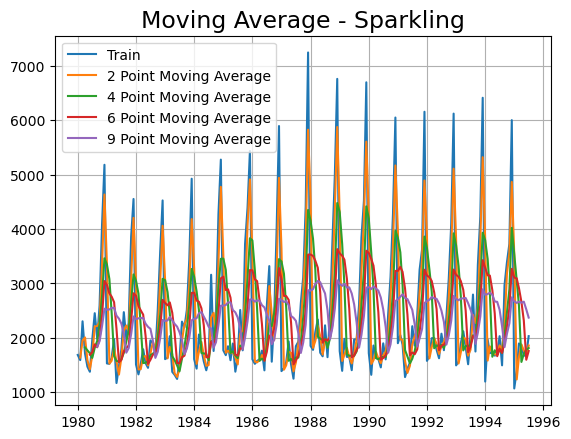

In [61]:
## Plotting on the whole data

plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid();
plt.title('Moving Average - Sparkling', fontsize=17)
plt.savefig('spark_ma.jpg', bbox_inches='tight');

In [62]:
#Creating train and test set 
trailing_MovingAverage_train=MovingAverage[MovingAverage.index<'1991'] 
trailing_MovingAverage_test=MovingAverage[MovingAverage.index>='1991']

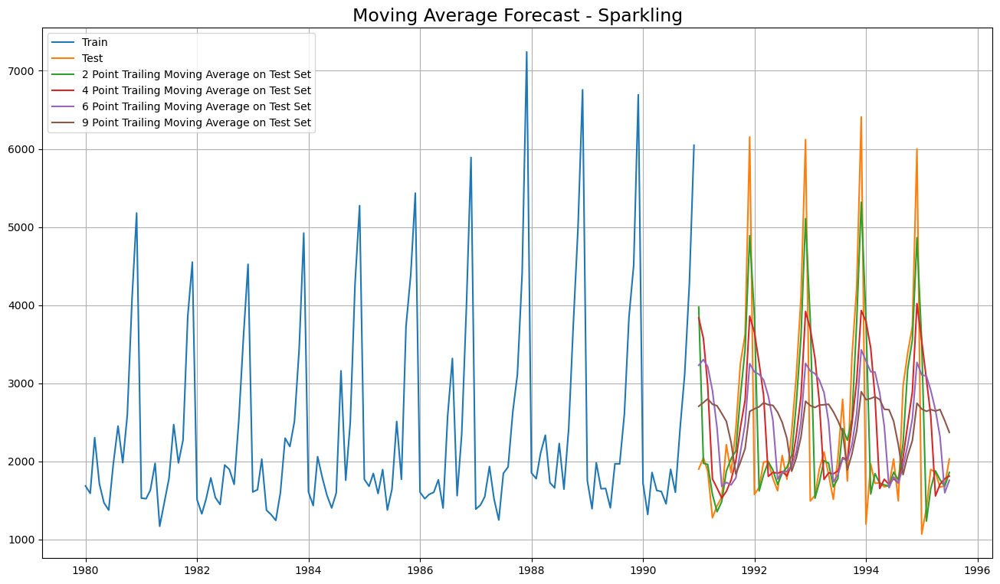

In [63]:
## Plotting on Test data

plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_train['Sparkling'], label='Train')
plt.plot(trailing_MovingAverage_test['Sparkling'], label='Test')


plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')

plt.legend(loc = 'best')
plt.grid();
plt.title('Moving Average Forecast - Sparkling', fontsize=17)
plt.savefig('spark_ma_test.jpg', bbox_inches='tight');

In [64]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Calculate RMSE for 2-point moving average
rmse_sparkling_2 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Sparkling'], trailing_MovingAverage_test['Trailing_2'].dropna()))
print("RMSE for 2-point Moving Average (Sparkling):", rmse_sparkling_2)

# Calculate RMSE for 4-point moving average
rmse_sparkling_4 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Sparkling'], trailing_MovingAverage_test['Trailing_4'].dropna()))
print("RMSE for 4-point Moving Average (Sparkling):", rmse_sparkling_4)

# Calculate RMSE for 6-point moving average
rmse_sparkling_6 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Sparkling'], trailing_MovingAverage_test['Trailing_6'].dropna()))
print("RMSE for 6-point Moving Average (Sparkling):", rmse_sparkling_6)

# Calculate RMSE for 9-point moving average
rmse_sparkling_9 = np.sqrt(mean_squared_error(trailing_MovingAverage_test['Sparkling'], trailing_MovingAverage_test['Trailing_9'].dropna()))
print("RMSE for 9-point Moving Average (Sparkling):", rmse_sparkling_9)


RMSE for 2-point Moving Average (Sparkling): 813.4006839972983
RMSE for 4-point Moving Average (Sparkling): 1156.589694081071
RMSE for 6-point Moving Average (Sparkling): 1283.9274280129855
RMSE for 9-point Moving Average (Sparkling): 1346.2783154241804


In [65]:
resultsDf_42 = pd.DataFrame({'Test RMSE Sparkling': [rmse_sparkling_2,rmse_sparkling_4,rmse_sparkling_6,rmse_sparkling_9]}
                           ,index=['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'])

resultsDf_42.to_csv('spark_ma.csv')
resultsDf_42

,Test RMSE Sparkling
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315


In [66]:
resultsDf6 = resultsDf_41.join(resultsDf_42, how='outer')
resultsDf6

,Test RMSE Rose,Test RMSE Sparkling
2pointTrailingMovingAverage,11.529409,813.400684
4pointTrailingMovingAverage,14.455221,1156.589694
6pointTrailingMovingAverage,14.572009,1283.927428
9pointTrailingMovingAverage,14.731209,1346.278315


###  All model's plot of Rose

In [67]:
# LR on Rose
train_time = [i+1 for i in range(len(rtrain))]
test_time = [i+133 for i in range(len(rtest))]
LinearRegression_train = rtrain.copy()
LinearRegression_test = rtest.copy()
LinearRegression_test['time'] = test_time
LinearRegression_train['time'] = train_time
lr = LinearRegression()
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Rose'])
test_predictions_model1         = lr.predict(LinearRegression_test[['time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

# SA on Rose
SimpleAverage_train = rtrain.copy()
SimpleAverage_test = rtest.copy()
SimpleAverage_test['mean_forecast'] = rtrain['Rose'].mean()

# MA on Rose

MovingAverage = rose_data.copy()
MovingAverage['Trailing_2'] = MovingAverage['Rose'].rolling(2).mean()
trailing_MovingAverage_test = MovingAverage[MovingAverage.index>='1991']

LinearRegression()

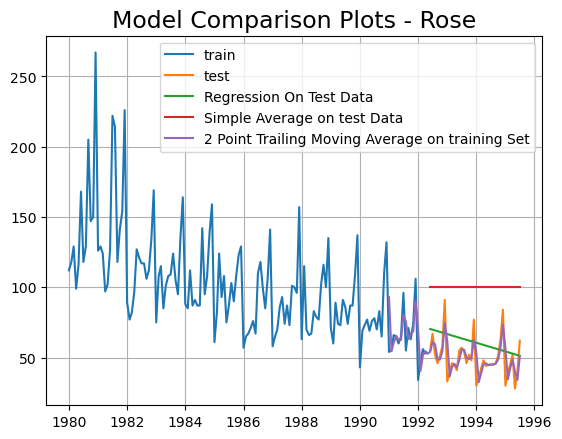

In [68]:
## Plotting on both rtraining and rtest data

plt.plot(rtrain['Rose'], label='train')
plt.plot(rtest['Rose'], label='test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots - Rose", fontsize=17)
plt.grid();

### Sparkling's all model's plot

In [69]:
# LR on Sparkling
train_time = [i+1 for i in range(len(strain))]
test_time = [i+133 for i in range(len(stest))]
LinearRegression_train = strain.copy()
LinearRegression_test = stest.copy()
LinearRegression_test['time'] = test_time
LinearRegression_train['time'] = train_time
lr = LinearRegression()
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sparkling'])
test_predictions_model1         = lr.predict(LinearRegression_test[['time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

# SA on Sparkling
SimpleAverage_train = strain.copy()
SimpleAverage_test = stest.copy()
SimpleAverage_test['mean_forecast'] = strain['Sparkling'].mean()

# MA on Sparkling

MovingAverage = sparkling_data.copy()
MovingAverage['Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
trailing_MovingAverage_test = MovingAverage[MovingAverage.index>='1991']


LinearRegression()

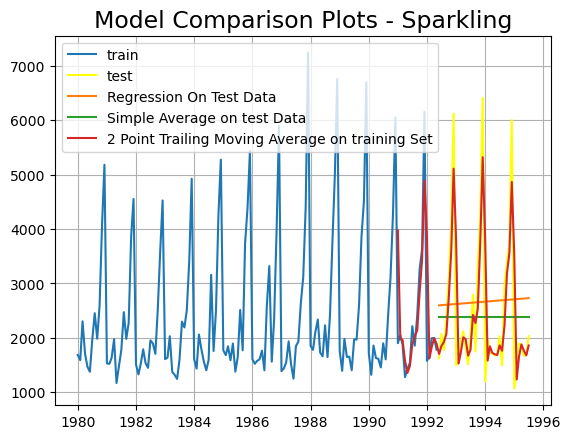

In [70]:
## Plotting on both rtraining and rtest data

plt.plot(strain['Sparkling'], label='train')
plt.plot(stest['Sparkling'], label='test', c='yellow')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots - Sparkling", fontsize=17)
plt.grid();

### Model 4- Exponential Models (Single, Double, Triple)

In [71]:
# Importing the necessary packages

import statsmodels.tools.eval_measures as      em
from   statsmodels.tsa.api             import ExponentialSmoothing, SimpleExpSmoothing, Holt

### SINGLE Exponential Smoothing with additive errors - ROSE

In [72]:
# create class
from statsmodels.tsa.api import SimpleExpSmoothing
model_SES = SimpleExpSmoothing(rtrain,initialization_method='estimated' )

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [73]:
model_SES_autofit = model_SES.fit(optimized=True)

In [74]:
## Let us check the parameters

model_SES_autofit.params

{'smoothing_level': 0.10680645840287396,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 134.10612980844493,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [75]:
# Using the fitted model on the training set to forecast on the test set
SES_predict_rose = model_SES_autofit.forecast(steps=len(rtest))
SES_predict_rose

1992-06-01    64.924598
1992-07-01    64.924598
1992-08-01    64.924598
1992-09-01    64.924598
1992-10-01    64.924598
1992-11-01    64.924598
1992-12-01    64.924598
1993-01-01    64.924598
1993-02-01    64.924598
1993-03-01    64.924598
1993-04-01    64.924598
1993-05-01    64.924598
1993-06-01    64.924598
1993-07-01    64.924598
1993-08-01    64.924598
1993-09-01    64.924598
1993-10-01    64.924598
1993-11-01    64.924598
1993-12-01    64.924598
1994-01-01    64.924598
1994-02-01    64.924598
1994-03-01    64.924598
1994-04-01    64.924598
1994-05-01    64.924598
1994-06-01    64.924598
1994-07-01    64.924598
1994-08-01    64.924598
1994-09-01    64.924598
1994-10-01    64.924598
1994-11-01    64.924598
1994-12-01    64.924598
1995-01-01    64.924598
1995-02-01    64.924598
1995-03-01    64.924598
1995-04-01    64.924598
1995-05-01    64.924598
1995-06-01    64.924598
1995-07-01    64.924598
Freq: MS, dtype: float64

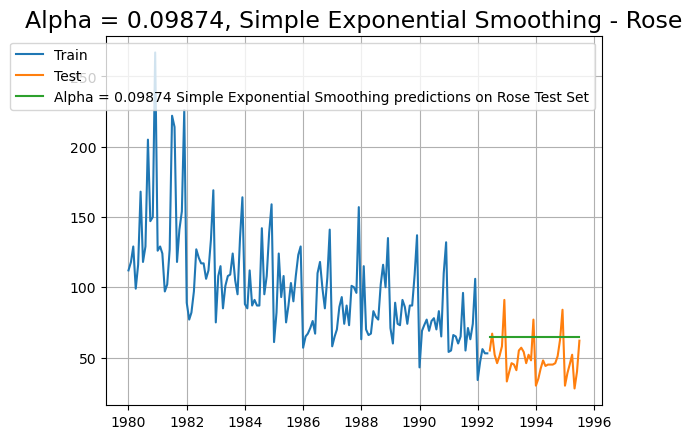

In [76]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_rose, label='Alpha = 0.09874 Simple Exponential Smoothing predictions on Rose Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha = 0.09874, Simple Exponential Smoothing - Rose', fontsize=17);
plt.savefig('rose_ses.jpg', bbox_inches='tight');

In [77]:
## Mean Absolute Percentage Error (MAPE) - Function Definition

def MAPE(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

print('SES RMSE:',mean_squared_error(rtest.values,SES_predict_rose.values,squared=False))
#different way to calculate RMSE
print('SES RMSE (calculated using statsmodels):',em.rmse(rtest.values,SES_predict_rose.values)[0])

resultsDf_rses = pd.DataFrame({'Test RMSE Rose': [em.rmse(rtest.values,SES_predict_rose.values)[0]]},index=['Simple Exponential Smoothing'])
resultsDf_rses

SES RMSE: 20.313625376427446
SES RMSE (calculated using statsmodels): 20.313625376427446


,Test RMSE Rose
Simple Exponential Smoothing,20.313625


### SINGLE Exponential Smoothing with additive errors - SPARKLING

In [78]:
# create class
model_SES = SimpleExpSmoothing(strain,initialization_method='estimated' )

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [79]:

model_SES_autofit = model_SES.fit(optimized=True)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [80]:
## Let us check the parameters

model_SES_autofit.params

{'smoothing_level': 0.038024998419434734,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 2336.6376640060776,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [81]:
# Using the fitted model on the training set to forecast on the test set
SES_predict_spark = model_SES_autofit.forecast(steps=len(stest))
SES_predict_spark

1992-06-01    2497.278277
1992-07-01    2497.278277
1992-08-01    2497.278277
1992-09-01    2497.278277
1992-10-01    2497.278277
1992-11-01    2497.278277
1992-12-01    2497.278277
1993-01-01    2497.278277
1993-02-01    2497.278277
1993-03-01    2497.278277
1993-04-01    2497.278277
1993-05-01    2497.278277
1993-06-01    2497.278277
1993-07-01    2497.278277
1993-08-01    2497.278277
1993-09-01    2497.278277
1993-10-01    2497.278277
1993-11-01    2497.278277
1993-12-01    2497.278277
1994-01-01    2497.278277
1994-02-01    2497.278277
1994-03-01    2497.278277
1994-04-01    2497.278277
1994-05-01    2497.278277
1994-06-01    2497.278277
1994-07-01    2497.278277
1994-08-01    2497.278277
1994-09-01    2497.278277
1994-10-01    2497.278277
1994-11-01    2497.278277
1994-12-01    2497.278277
1995-01-01    2497.278277
1995-02-01    2497.278277
1995-03-01    2497.278277
1995-04-01    2497.278277
1995-05-01    2497.278277
1995-06-01    2497.278277
1995-07-01    2497.278277
Freq: MS, dt

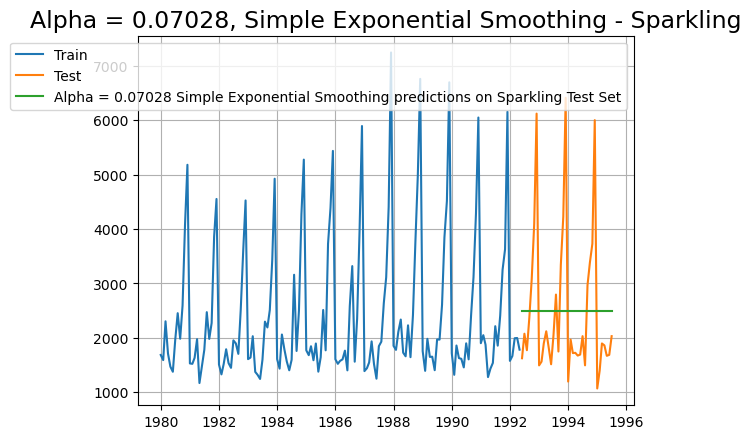

In [82]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_spark, label='Alpha = 0.07028 Simple Exponential Smoothing predictions on Sparkling Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha = 0.07028, Simple Exponential Smoothing - Sparkling', fontsize=17);
plt.savefig('spark_ses.jpg', bbox_inches='tight');

In [83]:
## Mean Absolute Percentage Error (MAPE) - Function Definition

def MAPE(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

In [84]:
print('SES RMSE:',mean_squared_error(stest.values,SES_predict_spark.values,squared=False))
#different way to calculate RMSE
print('SES RMSE (calculated using statsmodels):',em.rmse(rtest.values,SES_predict_spark.values)[0])


resultsDf_sses = pd.DataFrame({'Test RMSE Sparkling': [em.rmse(stest.values,SES_predict_spark.values)[0]]},index=['Simple Exponential Smoothing'])
resultsDf_sses

SES RMSE: 1329.9261887503862
SES RMSE (calculated using statsmodels): 2447.630913319449


,Test RMSE Sparkling
Simple Exponential Smoothing,1329.926189


In [85]:
resultsDf7 = resultsDf_rses.join(resultsDf_sses, how='outer')
resultsDf7

,Test RMSE Rose,Test RMSE Sparkling
Simple Exponential Smoothing,20.313625,1329.926189


In [86]:
resultsDf8 = pd.concat([resultsDf, resultsDf7], axis=0)
resultsDf8

,Test RMSE Rose,Test RMSE Sparkling
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189


In [87]:
resultsDf = resultsDf8.copy()

### Double Exponential Smoothing with Addition Errors - Rose


* A limitation of simple exponential smoothing is its poor performance in handling trended data.
* An enhanced version of SES, called the Double Exponential model, addresses this issue by incorporating two smoothing parameters.
* It is suitable for datasets exhibiting trend but lacking seasonality.
* The model distinguishes between two main components: Level and Trend.
* The Level represents the local mean, while the Trend captures directional changes.
* The smoothing parameter α governs the Level series, while β controls the Trend series.

In [88]:
# Initializing the Double Exponential Smoothing Model
model_DES = Holt(rtrain,initialization_method='estimated')
# Fitting the model
model_DES = model_DES.fit()

print('')
print('Holt model Exponential Smoothing Estimated Parameters :')
print('')
print(model_DES.params)


Holt model Exponential Smoothing Estimated Parameters :

{'smoothing_level': 0.0005001368098467977, 'smoothing_trend': 5.747454010212361e-07, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 138.8962446974027, 'initial_trend': -0.515875131985301, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [89]:
# Forecasting using this model for the duration of the test set
DES_predict_rose =  model_DES.forecast(len(rtest))
DES_predict_rose



1992-06-01    61.512387
1992-07-01    60.996512
1992-08-01    60.480637
1992-09-01    59.964762
1992-10-01    59.448887
1992-11-01    58.933012
1992-12-01    58.417137
1993-01-01    57.901261
1993-02-01    57.385386
1993-03-01    56.869511
1993-04-01    56.353636
1993-05-01    55.837761
1993-06-01    55.321886
1993-07-01    54.806011
1993-08-01    54.290136
1993-09-01    53.774260
1993-10-01    53.258385
1993-11-01    52.742510
1993-12-01    52.226635
1994-01-01    51.710760
1994-02-01    51.194885
1994-03-01    50.679010
1994-04-01    50.163134
1994-05-01    49.647259
1994-06-01    49.131384
1994-07-01    48.615509
1994-08-01    48.099634
1994-09-01    47.583759
1994-10-01    47.067884
1994-11-01    46.552009
1994-12-01    46.036133
1995-01-01    45.520258
1995-02-01    45.004383
1995-03-01    44.488508
1995-04-01    43.972633
1995-05-01    43.456758
1995-06-01    42.940883
1995-07-01    42.425007
Freq: MS, dtype: float64

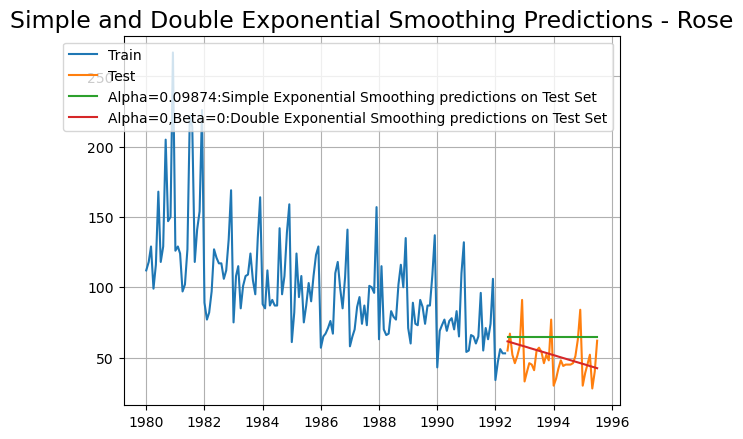

In [90]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_rose, label='Alpha=0.09874:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_rose, label='Alpha=0,Beta=0:Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions - Rose', fontsize=17);
plt.savefig('rose_rdes.jpg', bbox_inches='tight');

In [91]:
print('DES RMSE:',mean_squared_error(rtest.values,DES_predict_rose.values,squared=False))

DES RMSE: 13.726141478881782


In [92]:
resultsDf_temp = pd.DataFrame({'Test RMSE Rose': [mean_squared_error(rtest.values,DES_predict_rose.values,squared=False)]}
                           ,index=['Double Exponential Smoothing'])

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf_temp

,Test RMSE Rose
Double Exponential Smoothing,13.726141


### Double Exponential Smoothing with Addition Errors - Sparkling

In [93]:
# Initializing the Double Exponential Smoothing Model
model_DES = Holt(strain,initialization_method='estimated')
# Fitting the model
model_DES = model_DES.fit()

print('')
print('Holt model Exponential Smoothing Estimated Parameters :')
print('')
print(model_DES.params)


Holt model Exponential Smoothing Estimated Parameters :

{'smoothing_level': 0.07610203945706025, 'smoothing_trend': 0.0691865746076936, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 1505.423570116321, 'initial_trend': 2.272759801334928, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [94]:
# Forecasting using this model for the duration of the test set
DES_predict_spark =  model_DES.forecast(len(stest))
DES_predict_spark

1992-06-01    2410.519136
1992-07-01    2401.963868
1992-08-01    2393.408599
1992-09-01    2384.853330
1992-10-01    2376.298062
1992-11-01    2367.742793
1992-12-01    2359.187525
1993-01-01    2350.632256
1993-02-01    2342.076987
1993-03-01    2333.521719
1993-04-01    2324.966450
1993-05-01    2316.411182
1993-06-01    2307.855913
1993-07-01    2299.300644
1993-08-01    2290.745376
1993-09-01    2282.190107
1993-10-01    2273.634839
1993-11-01    2265.079570
1993-12-01    2256.524301
1994-01-01    2247.969033
1994-02-01    2239.413764
1994-03-01    2230.858496
1994-04-01    2222.303227
1994-05-01    2213.747959
1994-06-01    2205.192690
1994-07-01    2196.637421
1994-08-01    2188.082153
1994-09-01    2179.526884
1994-10-01    2170.971616
1994-11-01    2162.416347
1994-12-01    2153.861078
1995-01-01    2145.305810
1995-02-01    2136.750541
1995-03-01    2128.195273
1995-04-01    2119.640004
1995-05-01    2111.084735
1995-06-01    2102.529467
1995-07-01    2093.974198
Freq: MS, dt

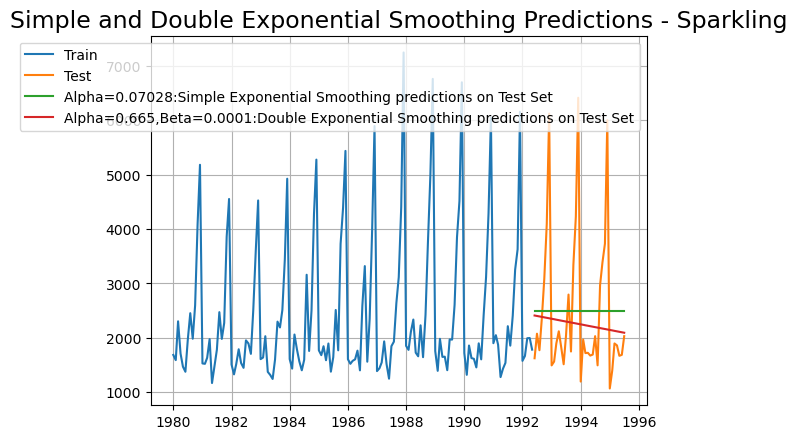

In [95]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_spark, label='Alpha=0.07028:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_spark, label='Alpha=0.665,Beta=0.0001:Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions - Sparkling', fontsize=17);
plt.savefig('spark_des.jpg', bbox_inches='tight');

In [96]:
print('DES RMSE:',mean_squared_error(stest.values,DES_predict_spark.values,squared=False))

DES RMSE: 1340.4527820680219


In [97]:
resultsDf_temp1 = pd.DataFrame({'Test RMSE Sparkling': [mean_squared_error(stest.values,DES_predict_spark.values,squared=False)]}
                           ,index=['Double Exponential Smoothing'])

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf_temp1

,Test RMSE Sparkling
Double Exponential Smoothing,1340.452782


In [98]:
resultsDf9 = resultsDf_temp.join(resultsDf_temp1, how='outer')
resultsDf9

,Test RMSE Rose,Test RMSE Sparkling
Double Exponential Smoothing,13.726141,1340.452782


In [99]:
resultsDf10 = pd.concat([resultsDf, resultsDf9], axis=0)
resultsDf10

,Test RMSE Rose,Test RMSE Sparkling
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782


In [100]:
resultsDf = resultsDf10.copy()
resultsDf

,Test RMSE Rose,Test RMSE Sparkling
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782


### Inference
In this observation, it's evident that Double Exponential Smoothing outperforms Simple Exponential Smoothing. This superiority stems from Double Exponential Smoothing's capability to capture the trend component effectively.

### Triple Exponential Smoothing with Addition Errors - Rose

In [101]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(rtrain,trend='additive',seasonal='additive',initialization_method='estimated')
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.08742718704347877, 'smoothing_trend': 0.0002616108438878894, 'smoothing_seasonal': 0.0, 'damping_trend': nan, 'initial_level': 146.60385131154945, 'initial_trend': -0.5593152524400347, 'initial_seasons': array([-30.53982021, -18.75391268, -10.29865303, -19.91310022,
       -12.17300311,  -7.15890317,   4.43881068,   6.86951577,
         5.0598322 ,   2.50065917,  19.82299101,  61.57465449]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [102]:
# Forecasting using this model for the duration of the test set
TES_predict_add_rose =  model_TES.forecast(len(rtest))
TES_predict_add_rose

1992-06-01     55.702562
1992-07-01     66.741042
1992-08-01     68.612512
1992-09-01     66.243594
1992-10-01     63.125186
1992-11-01     79.888283
1992-12-01    121.080712
1993-01-01     28.407003
1993-02-01     39.633675
1993-03-01     47.529700
1993-04-01     37.356019
1993-05-01     44.536881
1993-06-01     48.991746
1993-07-01     60.030225
1993-08-01     61.901696
1993-09-01     59.532778
1993-10-01     56.414370
1993-11-01     73.177467
1993-12-01    114.369896
1994-01-01     21.696186
1994-02-01     32.922859
1994-03-01     40.818884
1994-04-01     30.645202
1994-05-01     37.826065
1994-06-01     42.280930
1994-07-01     53.319409
1994-08-01     55.190880
1994-09-01     52.821961
1994-10-01     49.703554
1994-11-01     66.466651
1994-12-01    107.659080
1995-01-01     14.985370
1995-02-01     26.212043
1995-03-01     34.108068
1995-04-01     23.934386
1995-05-01     31.115249
1995-06-01     35.570114
1995-07-01     46.608593
Freq: MS, dtype: float64

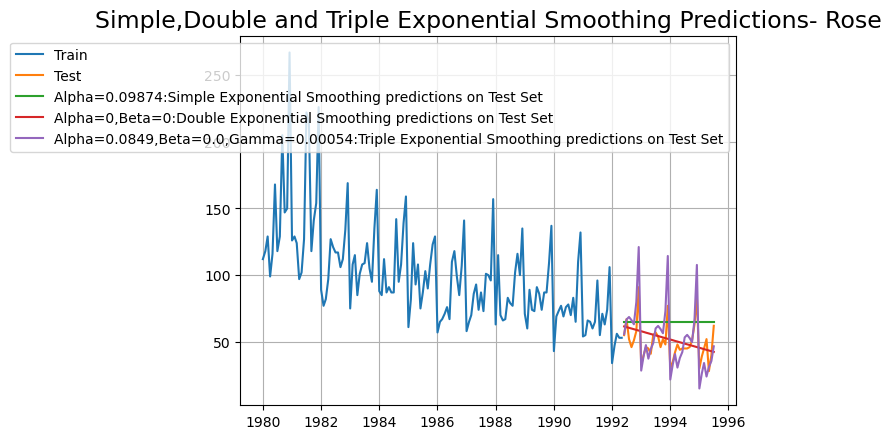

In [103]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_rose, label='Alpha=0.09874:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_rose, label='Alpha=0,Beta=0:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_rose, label='Alpha=0.0849,Beta=0.0,Gamma=0.00054:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions- Rose', fontsize=17);
plt.savefig('rose_add_tes.jpg', bbox_inches='tight');

In [104]:
print('TES RMSE:',mean_squared_error(rtest.values,TES_predict_add_rose.values,squared=False))

TES RMSE: 13.981658143427337


In [105]:
resultsDf_temp = pd.DataFrame({'Test RMSE Rose': [mean_squared_error(rtest.values,TES_predict_add_rose.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Additive Season)'])

import textwrap
textwrap.TextWrapper(resultsDf_temp.index)

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf_temp

,Test RMSE Rose
Triple Exponential Smoothing (Additive Season),13.981658


Triple Exponential Smoothing has performed the best on the test as expected since the data had both trend and seasonality.

### Triple Exponential Smoothing with Addition Errors - Sparkling

In [106]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(strain,trend='additive',seasonal='additive',initialization_method='estimated')
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.07597988906206526, 'smoothing_trend': 0.03256743788735303, 'smoothing_seasonal': 0.4450362526143211, 'damping_trend': nan, 'initial_level': 2356.5132179614134, 'initial_trend': -0.32094124393818113, 'initial_seasons': array([-636.24870185, -722.9960436 , -398.64165969, -473.44834236,
       -808.44216442, -815.36752359, -384.24094248,   73.00058148,
       -237.46220767,  272.32471849, 1541.3979244 , 2590.09505051]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [107]:
# Forecasting using this model for the duration of the test set
TES_predict_add_spark =  model_TES.forecast(len(stest))
TES_predict_add_spark

1992-06-01    1476.398132
1992-07-01    2064.219097
1992-08-01    1829.885088
1992-09-01    2409.122862
1992-10-01    3294.827017
1992-11-01    4063.290765
1992-12-01    6280.002982
1993-01-01    1724.743156
1993-02-01    1714.555885
1993-03-01    1946.650258
1993-04-01    1752.564515
1993-05-01    1530.109719
1993-06-01    1480.588043
1993-07-01    2068.409008
1993-08-01    1834.074999
1993-09-01    2413.312773
1993-10-01    3299.016929
1993-11-01    4067.480677
1993-12-01    6284.192893
1994-01-01    1728.933067
1994-02-01    1718.745796
1994-03-01    1950.840170
1994-04-01    1756.754427
1994-05-01    1534.299630
1994-06-01    1484.777954
1994-07-01    2072.598919
1994-08-01    1838.264910
1994-09-01    2417.502684
1994-10-01    3303.206840
1994-11-01    4071.670588
1994-12-01    6288.382804
1995-01-01    1733.122978
1995-02-01    1722.935707
1995-03-01    1955.030081
1995-04-01    1760.944338
1995-05-01    1538.489542
1995-06-01    1488.967865
1995-07-01    2076.788830
Freq: MS, dt

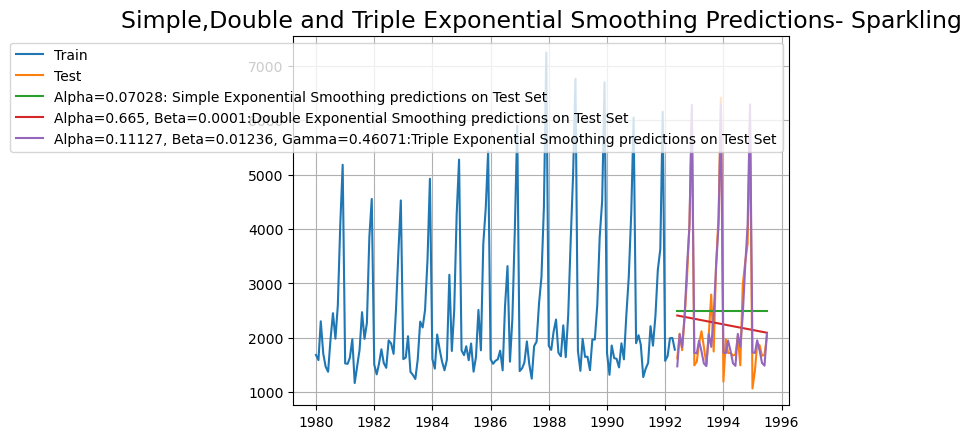

In [108]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_spark, label='Alpha=0.07028: Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_spark, label='Alpha=0.665, Beta=0.0001:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_spark, label='Alpha=0.11127, Beta=0.01236, Gamma=0.46071:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions- Sparkling', fontsize=17);
plt.savefig('spark_add_tes.jpg', bbox_inches='tight');

In [109]:
print('TES RMSE:',mean_squared_error(stest.values,TES_predict_add_spark.values,squared=False))

TES RMSE: 304.2681316248761


In [110]:
resultsDf_temp1 = pd.DataFrame({'Test RMSE Sparkling': [mean_squared_error(stest.values,TES_predict_add_spark.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Additive Season)'])

import textwrap
textwrap.TextWrapper(resultsDf_temp.index)

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf_temp1

,Test RMSE Sparkling
Triple Exponential Smoothing (Additive Season),304.268132


In [111]:
resultsDf11 = resultsDf_temp.join(resultsDf_temp1, how='outer')
resultsDf11

,Test RMSE Rose,Test RMSE Sparkling
Triple Exponential Smoothing (Additive Season),13.981658,304.268132


In [112]:
resultsDf12 = pd.concat([resultsDf, resultsDf11], axis=0)
resultsDf12

,Test RMSE Rose,Test RMSE Sparkling
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782
Triple Exponential Smoothing (Additive Season),13.981658,304.268132


In [113]:
resultsDf = resultsDf12.copy()

### Taking MULTIPLICATIVE SEASONALITY- ROSE

In [114]:
# Initializing the Double Exponential Smoothing Model
model_TES_am = ExponentialSmoothing(rtrain,trend='add',seasonal='multiplicative',initialization_method='estimated')
# Fitting the model
model_TES_am = model_TES_am.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES_am.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.09926222794517521, 'smoothing_trend': 0.00011004882158931748, 'smoothing_seasonal': 0.00021713667357767415, 'damping_trend': nan, 'initial_level': 153.11642701118197, 'initial_trend': -0.6185535740569861, 'initial_seasons': array([0.7104098 , 0.80373209, 0.88435157, 0.78124423, 0.86816859,
       0.93604567, 1.0446323 , 1.09107104, 1.03239048, 1.01242076,
       1.17874784, 1.61766735]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [115]:
# Forecasting using this model for the duration of the test set
TES_predict_am_rose =  model_TES_am.forecast(len(rtest))
TES_predict_am_rose

1992-06-01    57.296561
1992-07-01    63.300550
1992-08-01    65.432195
1992-09-01    61.285164
1992-10-01    59.472849
1992-11-01    68.516832
1992-12-01    93.022024
1993-01-01    40.408282
1993-02-01    45.226101
1993-03-01    49.215782
1993-04-01    42.998488
1993-05-01    47.239682
1993-06-01    50.350213
1993-07-01    55.547986
1993-08-01    57.335932
1993-09-01    53.623029
1993-10-01    51.959013
1993-11-01    59.768265
1993-12-01    81.016773
1994-01-01    35.136567
1994-02-01    39.260996
1994-03-01    42.652317
1994-04-01    37.199723
1994-05-01    40.796540
1994-06-01    43.403866
1994-07-01    47.795422
1994-08-01    49.239670
1994-09-01    45.960893
1994-10-01    44.445177
1994-11-01    51.019698
1994-12-01    69.011521
1995-01-01    29.864852
1995-02-01    33.295891
1995-03-01    36.088851
1995-04-01    31.400958
1995-05-01    34.353399
1995-06-01    36.457519
1995-07-01    40.042857
Freq: MS, dtype: float64

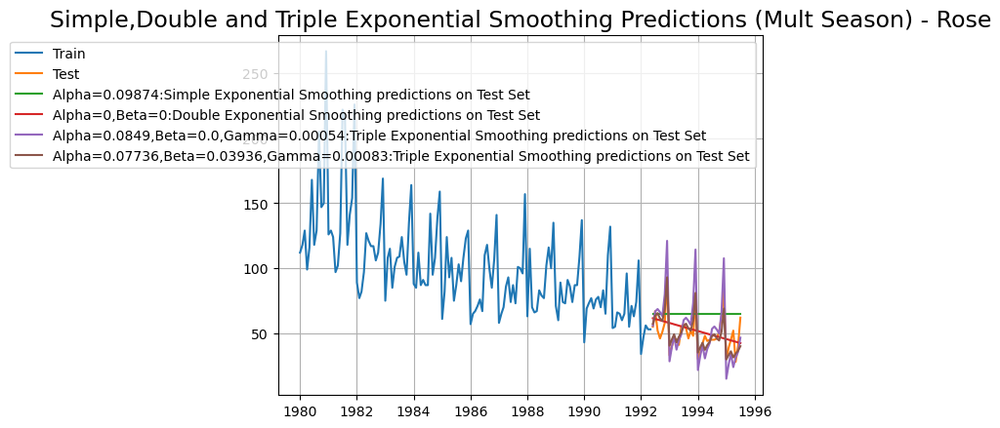

In [116]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_rose, label='Alpha=0.09874:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_rose, label='Alpha=0,Beta=0:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_rose, label='Alpha=0.0849,Beta=0.0,Gamma=0.00054:Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_am_rose, label='Alpha=0.07736,Beta=0.03936,Gamma=0.00083:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions (Mult Season) - Rose', fontsize=17);

plt.savefig('rose_mul_tes.jpg', bbox_inches='tight');

In [117]:
# Report model accuracy

print('TES_am RMSE_rose:',mean_squared_error(rtest.values,TES_predict_am_rose.values,squared=False))

TES_am RMSE_rose: 8.406214700375987


In [118]:
# resultsDf_temp = pd.DataFrame({'Test RMSE': [mean_squared_error(test.values,TES_predict_am.values,squared=False)]}
#                            ,index=['Alpha=0.74,Beta=2.73e-06,Gamma=5.2e-07,Gamma=0:TES'])

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
# resultsDf

resultsDf_temp = pd.DataFrame({'Test RMSE Rose': [mean_squared_error(rtest.values,TES_predict_am_rose.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Multiplicative Season)'])



resultsDf_temp

,Test RMSE Rose
Triple Exponential Smoothing (Multiplicative Season),8.406215


We see that the multiplicative seasonality model has not done that well when compared to the additive seasonality Triple Exponential Smoothing model.

### Taking MULTIPLICATIVE SEASONALITY- Sparkling

In [119]:
# Initializing the Double Exponential Smoothing Model
model_TES_am = ExponentialSmoothing(strain,trend='add',seasonal='multiplicative',initialization_method='estimated')
# Fitting the model
model_TES_am = model_TES_am.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES_am.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.07576072430661668, 'smoothing_trend': 0.0757569226305737, 'smoothing_seasonal': 0.34233995325669975, 'damping_trend': nan, 'initial_level': 2356.5067962632284, 'initial_trend': -13.954366127687548, 'initial_seasons': array([0.72038399, 0.68922005, 0.90648756, 0.80593465, 0.65572497,
       0.65080738, 0.88275852, 1.13409722, 0.92512911, 1.22874598,
       1.91773531, 2.42850239]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [120]:
# Forecasting using this model for the duration of the test set
TES_predict_am_spark =  model_TES_am.forecast(len(stest))
TES_predict_am_spark

1992-06-01    1487.898177
1992-07-01    2075.117459
1992-08-01    1939.901235
1992-09-01    2424.487749
1992-10-01    3329.623297
1992-11-01    4197.112236
1992-12-01    6369.496227
1993-01-01    1739.842609
1993-02-01    1707.144931
1993-03-01    1953.541415
1993-04-01    1771.840644
1993-05-01    1589.381065
1993-06-01    1504.829788
1993-07-01    2098.708990
1993-08-01    1961.934650
1993-09-01    2451.999062
1993-10-01    3367.369732
1993-11-01    4244.648094
1993-12-01    6441.568155
1994-01-01    1759.510677
1994-02-01    1726.425205
1994-03-01    1975.583713
1994-04-01    1791.813987
1994-05-01    1607.280789
1994-06-01    1521.761400
1994-07-01    2122.300521
1994-08-01    1983.968065
1994-09-01    2479.510375
1994-10-01    3405.116168
1994-11-01    4292.183952
1994-12-01    6513.640082
1995-01-01    1779.178745
1995-02-01    1745.705478
1995-03-01    1997.626012
1995-04-01    1811.787330
1995-05-01    1625.180514
1995-06-01    1538.693011
1995-07-01    2145.892052
Freq: MS, dt

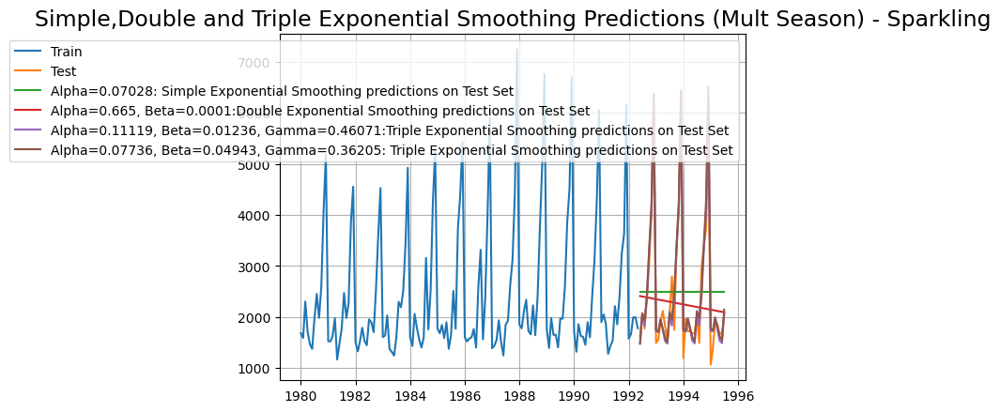

In [121]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_spark, label='Alpha=0.07028: Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_spark, label='Alpha=0.665, Beta=0.0001:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_spark, label='Alpha=0.11119, Beta=0.01236, Gamma=0.46071:Triple Exponential Smoothing predictions on Test Set')

plt.plot(TES_predict_am_spark, label='Alpha=0.07736, Beta=0.04943, Gamma=0.36205: Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions (Mult Season) - Sparkling', fontsize=17);

plt.savefig('spark_mul_tes.jpg', bbox_inches='tight');

In [122]:
#Report model accuracy

print('TES_am RMSE_spark:',mean_squared_error(stest.values,TES_predict_am_spark.values,squared=False))

TES_am RMSE_spark: 318.5327785290836


In [123]:
resultsDf_temp1 = pd.DataFrame({'Test RMSE Sparkling': [mean_squared_error(stest.values,TES_predict_am_spark.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Multiplicative Season)'])



resultsDf_temp1

,Test RMSE Sparkling
Triple Exponential Smoothing (Multiplicative Season),318.532779


In [124]:
resultsDf13 = resultsDf_temp.join(resultsDf_temp1, how='outer')
resultsDf13

,Test RMSE Rose,Test RMSE Sparkling
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779


In [125]:
resultsDf14 = pd.concat([resultsDf5,resultsDf6,resultsDf, resultsDf13], axis=0)
resultsDf14

,Test RMSE Rose,Test RMSE Sparkling
SimpleAverageModel,52.239499,1331.037637
2pointTrailingMovingAverage,11.529409,813.400684
4pointTrailingMovingAverage,14.455221,1156.589694
6pointTrailingMovingAverage,14.572009,1283.927428
9pointTrailingMovingAverage,14.731209,1346.278315
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782
Triple Exponential Smoothing (Additive Season),13.981658,304.268132
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779


In [126]:
resultsDf = resultsDf14.copy()
resultsDf

,Test RMSE Rose,Test RMSE Sparkling
SimpleAverageModel,52.239499,1331.037637
2pointTrailingMovingAverage,11.529409,813.400684
4pointTrailingMovingAverage,14.455221,1156.589694
6pointTrailingMovingAverage,14.572009,1283.927428
9pointTrailingMovingAverage,14.731209,1346.278315
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782
Triple Exponential Smoothing (Additive Season),13.981658,304.268132
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779


In [127]:
resultsDf.to_csv('results_all.csv')

## ETS(A, Ad, A) - Holt Winter's linear method with additive errors - ROSE

### USING DAMPED TREND

In [128]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(rtrain,trend='additive',seasonal='additive',initialization_method='estimated', damped_trend=True)
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.044788153185853455, 'smoothing_trend': 0.009592020240976601, 'smoothing_seasonal': 0.06851330556290872, 'damping_trend': 0.9818901293802165, 'initial_level': 159.46120323979136, 'initial_trend': -1.5865167219731307, 'initial_seasons': array([-30.42306361, -19.06323538, -10.42327905, -20.87381995,
       -12.53737055,  -4.90074174,   5.74163341,   9.59479065,
         6.72052612,   4.01252441,  21.43440879,  64.89249267]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [129]:
# Forecasting using this model for the duration of the test set
TES_predict_add_damp_rose =  model_TES.forecast(len(rtest))
TES_predict_add_damp_rose

1992-06-01     63.618991
1992-07-01     74.863344
1992-08-01     75.837012
1992-09-01     75.012875
1992-10-01     72.504212
1992-11-01     89.832414
1992-12-01    130.096670
1993-01-01     38.710864
1993-02-01     50.449292
1993-03-01     58.547966
1993-04-01     49.833923
1993-05-01     56.316943
1993-06-01     61.921538
1993-07-01     73.196632
1993-08-01     74.200483
1993-09-01     73.405984
1993-10-01     70.926421
1993-11-01     88.283197
1993-12-01    128.575509
1994-01-01     37.217251
1994-02-01     48.982728
1994-03-01     57.107961
1994-04-01     48.419997
1994-05-01     54.928622
1994-06-01     60.558360
1994-07-01     71.858141
1994-08-01     72.886232
1994-09-01     72.115534
1994-10-01     69.659341
1994-11-01     87.039063
1994-12-01    127.353907
1995-01-01     36.017772
1995-02-01     47.804971
1995-03-01     55.951533
1995-04-01     47.284511
1995-05-01     53.813701
1995-06-01     59.463629
1995-07-01     70.783236
Freq: MS, dtype: float64

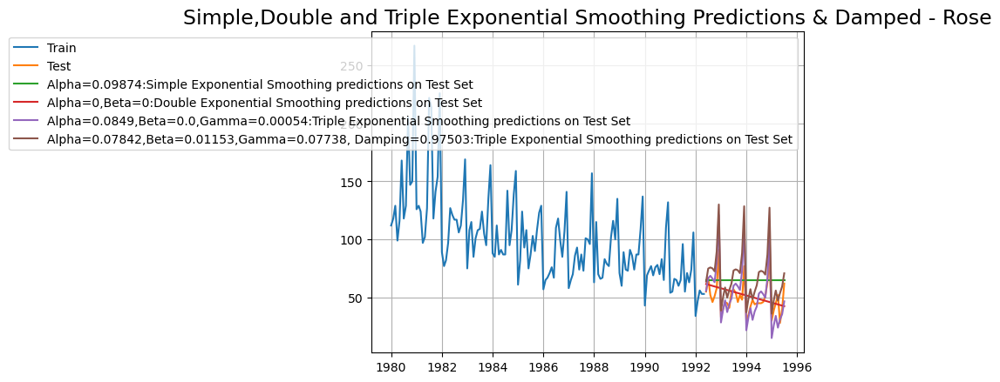

In [130]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_rose, label='Alpha=0.09874:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_rose, label='Alpha=0,Beta=0:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_rose, label='Alpha=0.0849,Beta=0.0,Gamma=0.00054:Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_damp_rose, label='Alpha=0.07842,Beta=0.01153,Gamma=0.07738, Damping=0.97503:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions & Damped - Rose', fontsize=17);
plt.savefig('rose_add_damp_tes.jpg', bbox_inches='tight');

In [131]:
print('TES RMSE DAMPED ROSE:',mean_squared_error(rtest.values,TES_predict_add_damp_rose.values,squared=False))

TES RMSE DAMPED ROSE: 22.016946423148198


In [132]:
resultsDf_temp = pd.DataFrame({'Test RMSE Rose': [mean_squared_error(rtest.values,TES_predict_add_damp_rose.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Additive Season, Damped Trend)'])

import textwrap
textwrap.TextWrapper(resultsDf_temp.index)

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf_temp

,Test RMSE Rose
"Triple Exponential Smoothing (Additive Season, Damped Trend)",22.016946


## ETS(A, A, A) - Holt Winter's linear method with additive errors - SPARKLING

### USING DAMPED TREND

In [133]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(strain,trend='additive',seasonal='additive',initialization_method='estimated', damped_trend=True)
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.07587096220885665, 'smoothing_trend': 0.021650682753712847, 'smoothing_seasonal': 0.44418683268249487, 'damping_trend': 0.989605771080583, 'initial_level': 2356.5961639834577, 'initial_trend': -2.047421201849785, 'initial_seasons': array([-636.38177192, -723.09773139, -398.41923189, -473.54414205,
       -808.58443513, -815.51099661, -384.26605602,   73.15519946,
       -237.65620743,  272.2921642 , 1541.71799026, 2590.34962433]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [134]:
# Forecasting using this model for the duration of the test set
TES_predict_add_damp_spark =  model_TES.forecast(len(stest))
TES_predict_add_damp_spark

1992-06-01    1477.796323
1992-07-01    2065.510915
1992-08-01    1831.754595
1992-09-01    2410.245763
1992-10-01    3295.889423
1992-11-01    4064.759672
1992-12-01    6280.268497
1993-01-01    1724.343421
1993-02-01    1713.412275
1993-03-01    1945.314009
1993-04-01    1751.076424
1993-05-01    1529.741703
1993-06-01    1479.779919
1993-07-01    2067.473893
1993-08-01    1833.697170
1993-09-01    2412.168146
1993-10-01    3297.791825
1993-11-01    4066.642299
1993-12-01    6282.131556
1994-01-01    1726.187115
1994-02-01    1715.236805
1994-03-01    1947.119574
1994-04-01    1752.863222
1994-05-01    1531.509929
1994-06-01    1481.529766
1994-07-01    2069.205551
1994-08-01    1835.410829
1994-09-01    2413.863993
1994-10-01    3299.470044
1994-11-01    4068.303075
1994-12-01    6283.775069
1995-01-01    1727.813545
1995-02-01    1716.846330
1995-03-01    1948.712369
1995-04-01    1754.439461
1995-05-01    1533.069784
1995-06-01    1483.073408
1995-07-01    2070.733148
Freq: MS, dt

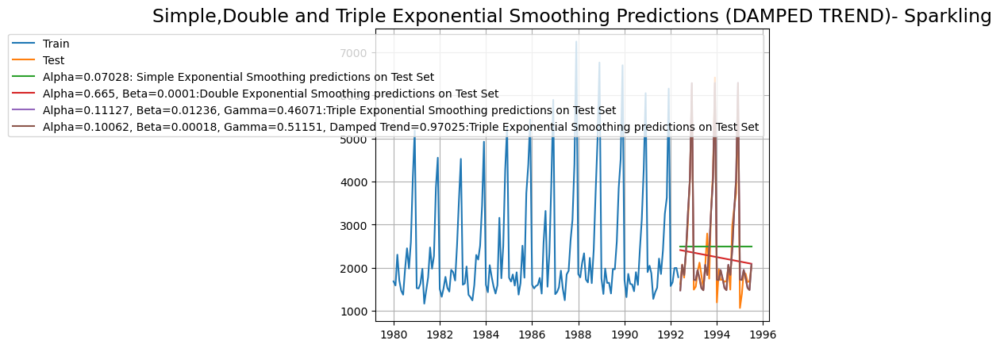

In [135]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_spark, label='Alpha=0.07028: Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_spark, label='Alpha=0.665, Beta=0.0001:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_spark, label='Alpha=0.11127, Beta=0.01236, Gamma=0.46071:Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_damp_spark, label='Alpha=0.10062, Beta=0.00018, Gamma=0.51151, Damped Trend=0.97025:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions (DAMPED TREND)- Sparkling', fontsize=17);
plt.savefig('spark_add_damp_tes.jpg', bbox_inches='tight');

In [136]:
print('TES RMSE SPARK DAMPED:',mean_squared_error(stest.values,TES_predict_add_damp_spark.values,squared=False))

TES RMSE SPARK DAMPED: 303.86570479510425


In [137]:
resultsDf_temp1 = pd.DataFrame({'Test RMSE Sparkling': [mean_squared_error(stest.values,TES_predict_add_spark.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Additive Season, Damped Trend)'])

import textwrap
textwrap.TextWrapper(resultsDf_temp.index)

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf_temp1

,Test RMSE Sparkling
"Triple Exponential Smoothing (Additive Season, Damped Trend)",304.268132


In [138]:
resultsDf11 = resultsDf_temp.join(resultsDf_temp1, how='outer')
resultsDf11

,Test RMSE Rose,Test RMSE Sparkling
"Triple Exponential Smoothing (Additive Season, Damped Trend)",22.016946,304.268132


In [139]:
resultsDf12 = pd.concat([resultsDf, resultsDf11], axis=0)
resultsDf12

,Test RMSE Rose,Test RMSE Sparkling
SimpleAverageModel,52.239499,1331.037637
2pointTrailingMovingAverage,11.529409,813.400684
4pointTrailingMovingAverage,14.455221,1156.589694
6pointTrailingMovingAverage,14.572009,1283.927428
9pointTrailingMovingAverage,14.731209,1346.278315
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782
Triple Exponential Smoothing (Additive Season),13.981658,304.268132
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779


In [140]:
resultsDf = resultsDf12.copy()

### ETS(A, A, M) - Holt Winter's linear method - ROSE
### USING DAMPED TREND
### ETS(A, Ad, M) model - Taking MULTIPLICATIVE SEASONALITY

In [141]:
# Initializing the Double Exponential Smoothing Model
model_TES_am = ExponentialSmoothing(rtrain,trend='add',seasonal='multiplicative',initialization_method='estimated', damped_trend=True)
# Fitting the model
model_TES_am = model_TES_am.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES_am.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.004262281993733273, 'smoothing_trend': 1.665743848718489e-05, 'smoothing_seasonal': 0.0062082311841868375, 'damping_trend': 0.9842702847040703, 'initial_level': 178.17547299446272, 'initial_trend': -1.7238131097936822, 'initial_seasons': array([0.64229728, 0.72901125, 0.80016606, 0.70610673, 0.78293659,
       0.85428442, 0.94970181, 0.986842  , 0.95620517, 0.92505729,
       1.07668852, 1.4816784 ]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [142]:
# Forecasting using this model for the duration of the test set
TES_predict_am_damp_rose =  model_TES_am.forecast(len(rtest))
TES_predict_am_damp_rose

1992-06-01     68.538939
1992-07-01     76.152103
1992-08-01     78.751537
1992-09-01     76.338328
1992-10-01     73.794047
1992-11-01     85.814381
1992-12-01    117.604865
1993-01-01     50.791985
1993-02-01     57.744579
1993-03-01     63.292774
1993-04-01     55.909198
1993-05-01     61.758451
1993-06-01     67.060709
1993-07-01     74.532337
1993-08-01     77.099638
1993-09-01     74.759230
1993-10-01     72.288763
1993-11-01     84.088238
1993-12-01    115.272212
1994-01-01     49.798601
1994-02-01     56.631004
1994-03-01     62.089296
1994-04-01     54.861028
1994-05-01     60.616890
1994-06-01     65.838586
1994-07-01     73.193201
1994-08-01     75.733937
1994-09-01     73.453716
1994-10-01     71.044274
1994-11-01     82.661155
1994-12-01    113.343698
1995-01-01     48.977324
1995-02-01     55.710359
1995-03-01     61.094326
1995-04-01     53.994457
1995-05-01     59.673108
1995-06-01     64.828201
1995-07-01     72.086074
Freq: MS, dtype: float64

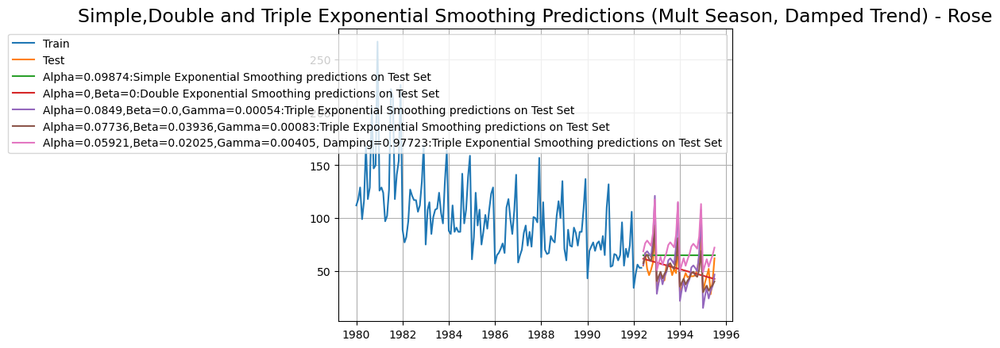

In [143]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_rose, label='Alpha=0.09874:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_rose, label='Alpha=0,Beta=0:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_rose, label='Alpha=0.0849,Beta=0.0,Gamma=0.00054:Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_am_rose, label='Alpha=0.07736,Beta=0.03936,Gamma=0.00083:Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_am_damp_rose, label='Alpha=0.05921,Beta=0.02025,Gamma=0.00405, Damping=0.97723:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions (Mult Season, Damped Trend) - Rose', fontsize=17);

plt.savefig('rose_mul_damp_tes.jpg', bbox_inches='tight');

In [144]:
# Report model accuracy

print('TES_am RMSE_rose DAMPED:',mean_squared_error(rtest.values,TES_predict_am_damp_rose.values,squared=False))

TES_am RMSE_rose DAMPED: 22.456971053586614


In [145]:
# resultsDf_temp = pd.DataFrame({'Test RMSE': [mean_squared_error(test.values,TES_predict_am.values,squared=False)]}
#                            ,index=['Alpha=0.74,Beta=2.73e-06,Gamma=5.2e-07,Gamma=0:TES'])

# resultsDf = pd.concat([resultsDf, resultsDf_temp])
# resultsDf

resultsDf_temp = pd.DataFrame({'Test RMSE Rose': [mean_squared_error(rtest.values,TES_predict_am_damp_rose.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Multiplicative Season, Damped Trend)'])



resultsDf_temp

,Test RMSE Rose
"Triple Exponential Smoothing (Multiplicative Season, Damped Trend)",22.456971


### ETS(A, A, M) - Holt Winter's linear method - SPARKLING
### ETS(A, A, M) model - Taking MULTIPLICATIVE SEASONALITY
### USING DAMPED TREND

In [146]:
# Initializing the Double Exponential Smoothing Model
model_TES_am = ExponentialSmoothing(strain,trend='add',seasonal='multiplicative',initialization_method='estimated', damped_trend=True)
# Fitting the model
model_TES_am = model_TES_am.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES_am.params)

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.




==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.07619769106825917, 'smoothing_trend': 0.06527818410475346, 'smoothing_seasonal': 0.3424529036411769, 'damping_trend': 0.9900025200246466, 'initial_level': 2356.3589705476807, 'initial_trend': -14.670658355418272, 'initial_seasons': array([0.7211031 , 0.68969045, 0.90627558, 0.80862391, 0.66123256,
       0.6562088 , 0.88753915, 1.13443612, 0.92261054, 1.22383913,
       1.8915014 , 2.42008597]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [147]:
# Forecasting using this model for the duration of the test set
TES_predict_am_damp_spark =  model_TES_am.forecast(len(stest))
TES_predict_am_damp_spark

1992-06-01    1492.608846
1992-07-01    2081.440495
1992-08-01    1945.201408
1992-09-01    2431.529912
1992-10-01    3338.749890
1992-11-01    4207.351729
1992-12-01    6383.239527
1993-01-01    1743.006165
1993-02-01    1709.369783
1993-03-01    1956.111685
1993-04-01    1773.844323
1993-05-01    1593.386654
1993-06-01    1508.082155
1993-07-01    2102.782804
1993-08-01    1964.929566
1993-09-01    2455.922079
1993-10-01    3371.878839
1993-11-01    4248.645997
1993-12-01    6445.209797
1994-01-01    1759.744279
1994-02-01    1725.607054
1994-03-01    1974.491621
1994-04-01    1790.331380
1994-05-01    1608.036396
1994-06-01    1521.797881
1994-07-01    2121.700882
1994-08-01    1982.416841
1994-09-01    2477.543586
1994-10-01    3401.244735
1994-11-01    4285.249729
1994-12-01    6500.140985
1995-01-01    1774.581144
1995-02-01    1739.999964
1995-03-01    1990.783816
1995-04-01    1804.945704
1995-05-01    1621.022102
1995-06-01    1533.955665
1995-07-01    2138.470093
Freq: MS, dt

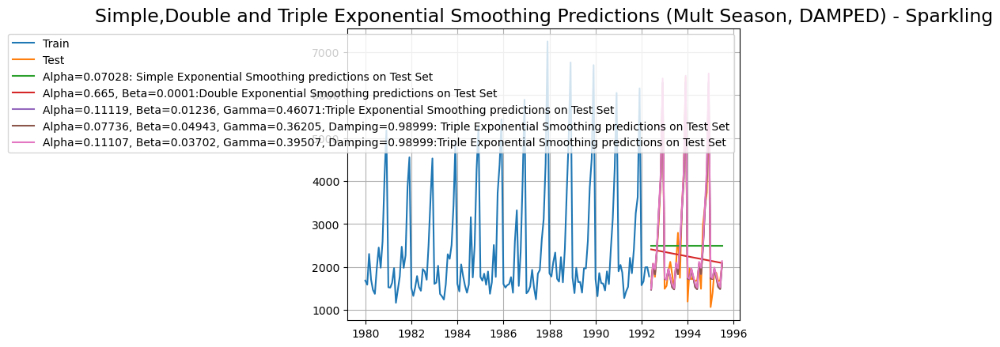

In [148]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_spark, label='Alpha=0.07028: Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_predict_spark, label='Alpha=0.665, Beta=0.0001:Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_spark, label='Alpha=0.11119, Beta=0.01236, Gamma=0.46071:Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_add_spark, label='Alpha=0.07736, Beta=0.04943, Gamma=0.36205, Damping=0.98999: Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_am_damp_spark, label='Alpha=0.11107, Beta=0.03702, Gamma=0.39507, Damping=0.98999:Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple,Double and Triple Exponential Smoothing Predictions (Mult Season, DAMPED) - Sparkling', fontsize=17);

plt.savefig('spark_mul_damp_tes.jpg', bbox_inches='tight');

In [149]:
# Report model ac curacy
print('TES_am DAMPED RMSE_spark:',mean_squared_error(stest.values,TES_predict_am_damp_spark.values,squared=False))

TES_am DAMPED RMSE_spark: 317.8494126736865


In [150]:
resultsDf_temp1 = pd.DataFrame({'Test RMSE Sparkling': [mean_squared_error(stest.values,TES_predict_am_damp_spark.values,squared=False)]}
                           ,index=['Triple Exponential Smoothing (Multiplicative Season, Damped Trend)'])



resultsDf_temp1

,Test RMSE Sparkling
"Triple Exponential Smoothing (Multiplicative Season, Damped Trend)",317.849413


In [151]:
resultsDf13 = resultsDf_temp.join(resultsDf_temp1, how='outer')
resultsDf13

,Test RMSE Rose,Test RMSE Sparkling
"Triple Exponential Smoothing (Multiplicative Season, Damped Trend)",22.456971,317.849413


In [152]:
resultsDf14 = pd.concat([resultsDf, resultsDf13], axis=0)
resultsDf14

,Test RMSE Rose,Test RMSE Sparkling
SimpleAverageModel,52.239499,1331.037637
2pointTrailingMovingAverage,11.529409,813.400684
4pointTrailingMovingAverage,14.455221,1156.589694
6pointTrailingMovingAverage,14.572009,1283.927428
9pointTrailingMovingAverage,14.731209,1346.278315
RegressionOnTime,17.510241,1349.042457
Simple Exponential Smoothing,20.313625,1329.926189
Double Exponential Smoothing,13.726141,1340.452782
Triple Exponential Smoothing (Additive Season),13.981658,304.268132
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779


In [153]:
resultsDf = resultsDf14.copy()

In [154]:
resultsDf.to_csv('results_all.csv')

### Best model:- 

##### Rose — Triple Exponential Smoothing (Multiplicative Season)
##### Sparkling — Triple Exponential Smoothing (Additive Season)

### D. Check for Stationarity

The hypothesis in a simple form for the ADF test is:

𝐻0
  : The Time Series has a unit root and is thus non-stationary.;
𝐻1
  : The Time Series does not have a unit root and is thus stationary.

In [155]:
from statsmodels.tsa.stattools import adfuller

dfrs = adfuller(rose_data,regression='ct')
print('DF test statistic is %3.3f' %dfrs[0])
print('DF test p-value is' ,dfrs[1])
print('Number of lags used' ,dfrs[2])

DF test statistic is -2.241
DF test p-value is 0.46694206026101603
Number of lags used 13


5% of significance level reveals its non-stationary.

To solve this issue, we'll apply a single level of difference to determine, if the series becomes stationary.

In [156]:
dfrs = adfuller(sparkling_data.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dfrs[0])
print('DF test p-value is' ,dfrs[1])
print('Number of lags used' ,dfrs[2])

DF test statistic is -44.912
DF test p-value is 0.0
Number of lags used 10


p-value less than the significance level of 0.0, we reject the Null Hypothesis.

It conclude that after applying a lag of 10, the Rose data becomes stationary.

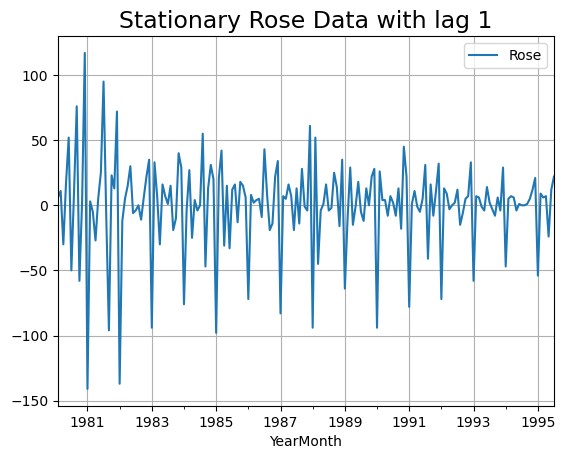

In [157]:
rose_data.diff().dropna().plot(grid=True);
plt.title('Stationary Rose Data with lag 1', fontsize=17);
plt.savefig('rose_stationary.jpg', bbox_inches='tight');

### Check Stationarity of SPARKLING Data

In [158]:
dfss = adfuller(sparkling_data,regression='ct')
print('DF test statistic is %3.3f' %dfss[0])
print('DF test p-value is' ,dfss[1])
print('Number of lags used' ,dfss[2])

DF test statistic is -1.798
DF test p-value is 0.7055958459932068
Number of lags used 12


Significance level of 7%, the Time Series appears to be non-stationary.

Let's apply one level of differencing, if the series achieves stationarity.

In [159]:
dfss = adfuller(sparkling_data.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dfss[0])
print('DF test p-value is' ,dfss[1])
print('Number of lags used' ,dfss[2])

DF test statistic is -44.912
DF test p-value is 0.0
Number of lags used 10


p-value less than the significance level 0.05, so we reject the null hypothesis.

As a result, after applying a lag of 10, the Sparkling data becomes stationary.

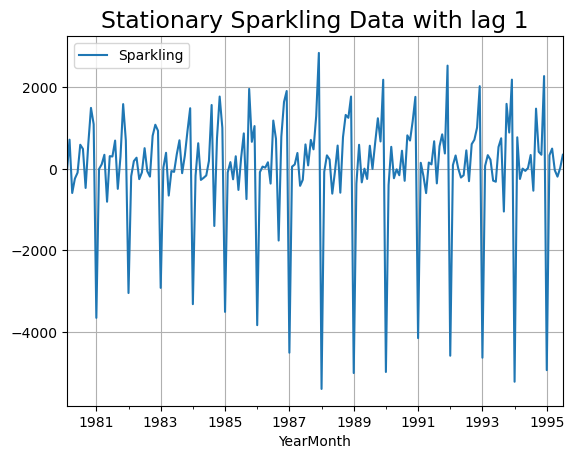

In [160]:
sparkling_data.diff().dropna().plot(grid=True);
plt.title('Stationary Sparkling Data with lag 1', fontsize=17);
plt.savefig('spark_stationary.jpg', bbox_inches='tight');

### E. Model Building - Stationary Data + F. Compare the performance of the models

#### Check for Stationarity of Rose Train Data

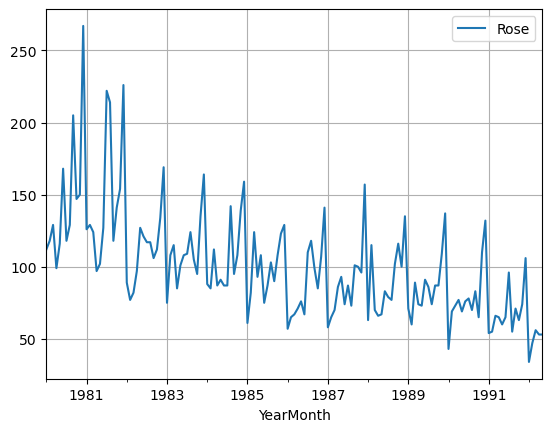

In [161]:
rtrain.plot(grid=True);

In [162]:
dftest = adfuller(rtrain,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -2.105
DF test p-value is 0.5431751684108302
Number of lags used 13


In [163]:
dftest = adfuller(rtrain.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -7.185
DF test p-value is 5.371946645689271e-09
Number of lags used 12


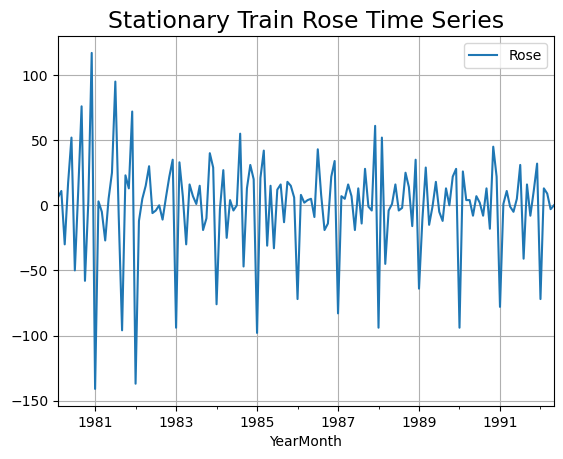

In [164]:
rtrain.diff().dropna().plot(grid=True);
plt.title('Stationary Train Rose Time Series', fontsize=17)
plt.savefig('rose_train_stationary.jpg', bbox_inches='tight');

In [165]:
rtrain.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 149 entries, 1980-01-01 to 1992-05-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Rose    149 non-null    float64
dtypes: float64(1)
memory usage: 2.3 KB


### Automated version of an ARIMA model for that the best parameters are selected with the lowest Akaike Information Criteria (AIC).

Acknowledging the seasonality in the data, it's indeed prudent to consider a SARIMA model. However, before proceeding, let's test whether an ARIMA or SARIMA model better fits the data by comparing their Akaike Information Criteria (AIC) values. We'll choose the model with the lowest AIC as the preferred option.

In [166]:


import itertools

p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))

print('Examples of the parameter combinations for the Model')

for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [167]:

ROSE_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ROSE_ARIMA_AIC

,param,AIC


In [168]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Initialize an empty DataFrame with columns 'param' and 'AIC'
ROSE_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])

for param in pdq:
  ARIMA_model = ARIMA(rtrain['Rose'].values, order=param).fit()
  print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))
  # Create a DataFrame with a single row for the current parameter and AIC
  new_row = pd.DataFrame({'param': [param], 'AIC': [ARIMA_model.aic]})
  # Concatenate the existing DataFrame with the new row
  ROSE_ARIMA_AIC = pd.concat([ROSE_ARIMA_AIC, new_row], ignore_index=True)



ARIMA(0, 1, 0) - AIC:1499.1786931796496


C:\Users\Benita Merlin E\AppData\Local\Temp\ipykernel_1968\980993916.py:13: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



ARIMA(0, 1, 1) - AIC:1438.6436090916682
ARIMA(0, 1, 2) - AIC:1436.1992828019957
ARIMA(0, 1, 3) - AIC:1436.5480262079814
ARIMA(1, 1, 0) - AIC:1480.5593646250518
ARIMA(1, 1, 1) - AIC:1437.155542505622
ARIMA(1, 1, 2) - AIC:1435.6572959808968
ARIMA(1, 1, 3) - AIC:1437.6403967056954
ARIMA(2, 1, 0) - AIC:1457.8711788191404
ARIMA(2, 1, 1) - AIC:1437.7048136239591
ARIMA(2, 1, 2) - AIC:1437.6378674876128
ARIMA(2, 1, 3) - AIC:1432.0269461053194
ARIMA(3, 1, 0) - AIC:1456.0247365265504
ARIMA(3, 1, 1) - AIC:1438.5688150662438


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



ARIMA(3, 1, 2) - AIC:1439.5208503873455
ARIMA(3, 1, 3) - AIC:1432.2155409510306


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [169]:
ROSE_ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
11,"(2, 1, 3)",1432.026946
15,"(3, 1, 3)",1432.215541
6,"(1, 1, 2)",1435.657296
2,"(0, 1, 2)",1436.199283
3,"(0, 1, 3)",1436.548026


In [170]:
auto_ARIMA = ARIMA(rtrain, order=(2,1,3))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  149
Model:                 ARIMA(2, 1, 3)   Log Likelihood                -710.013
Date:                Thu, 02 Jan 2025   AIC                           1432.027
Time:                        22:44:26   BIC                           1450.010
Sample:                    01-01-1980   HQIC                          1439.334
                         - 05-01-1992                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6866      0.052    -32.344      0.000      -1.789      -1.584
ar.L2         -0.8565      0.052    -16.458      0.000      -0.959      -0.755
ma.L1          0.9594      0.076     12.548      0.0

### Rose Train Diagnostics plot.¶

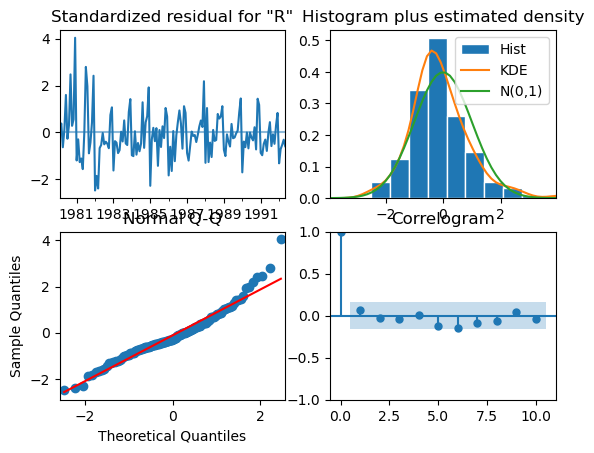

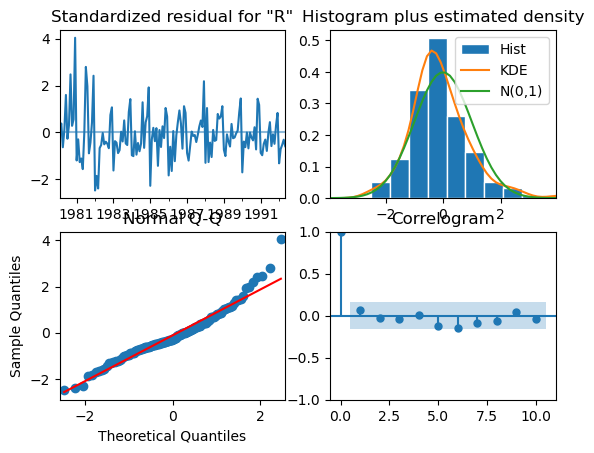

In [171]:

results_auto_ARIMA.plot_diagnostics();

plt.savefig('rose_diag_plot.jpg', bbox_inches='tight')

### Predict on the Rose Test by using this model and evaluate the model.

In [172]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(rtest))
predicted_auto_ARIMA

1992-06-01    58.879149
1992-07-01    68.513257
1992-08-01    62.230408
1992-09-01    64.575309
1992-10-01    66.001781
1992-11-01    61.587397
1992-12-01    67.810969
1993-01-01    61.095214
1993-02-01    67.091477
1993-03-01    62.730290
1993-04-01    64.949991
1993-05-01    64.941674
1993-06-01    63.054469
1993-07-01    66.244587
1993-08-01    62.480515
1993-09-01    66.096649
1993-10-01    63.221638
1993-11-01    64.973370
1993-12-01    64.481389
1994-01-01    63.810769
1994-02-01    65.363244
1994-03-01    63.319215
1994-04-01    65.436977
1994-05-01    63.615885
1994-06-01    64.873453
1994-07-01    64.312229
1994-08-01    64.181660
1994-09-01    64.882583
1994-10-01    63.812228
1994-11-01    65.017149
1994-12-01    63.901695
1995-01-01    64.750995
1995-02-01    64.273966
1995-03-01    64.351083
1995-04-01    64.629603
1995-05-01    64.093793
1995-06-01    64.758941
1995-07-01    64.096026
Freq: MS, Name: predicted_mean, dtype: float64

In [173]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

## Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error

rmse = mean_squared_error(rtest['Rose'],predicted_auto_ARIMA,squared=False)
mape = mean_absolute_percentage_error(rtest['Rose'],predicted_auto_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 19.72675170860721 
MAPE: 41.63453967334537


In [174]:
resultsR0 = pd.DataFrame({'Test RMSE Rose': rmse,'Test MAPE Rose':mape}
                           ,index=['ARIMA(2,1,3)'])

resultsR0.to_csv('rose_arima_auto_213.csv')
resultsR0

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.63454


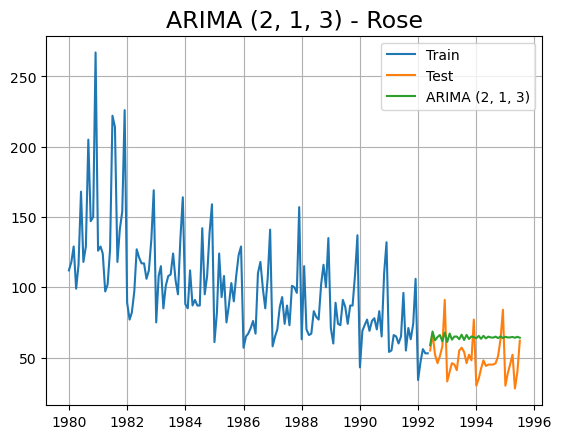

In [175]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')
plt.plot(predicted_auto_ARIMA,label='ARIMA (2, 1, 3)')


plt.legend(loc='best')
plt.grid()
plt.title('ARIMA (2, 1, 3) - Rose', fontsize=17);

plt.savefig('rose_arima_auto_213.jpg', bbox_inches='tight');

### ARIMA model for that the best parameters are selected at the ACF and the PACF plots on ROSE dataset
Lets look at the ACF and the PACF plots

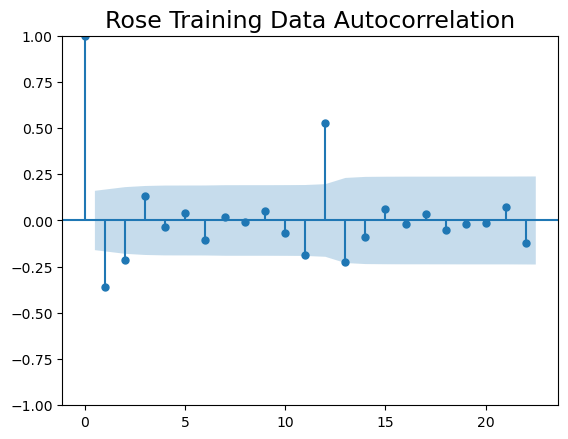

In [176]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(rtrain.diff(), missing='drop', alpha=0.05)
plt.title('Rose Training Data Autocorrelation',fontsize=17)
plt.savefig('rose_train_acf.jpg', bbox_inches='tight');


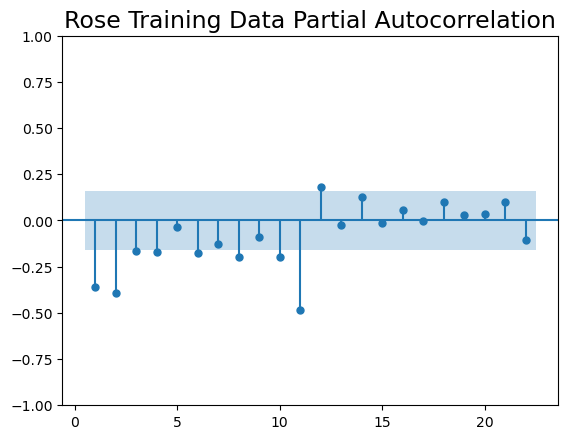

In [177]:
plot_pacf(rtrain.diff().dropna(), zero=False, alpha=0.05, method='ywmle')
plt.title('Rose Training Data Partial Autocorrelation',fontsize=17)
plt.savefig('rose_train_pacf.jpg', bbox_inches='tight');



The significance level of 0.05 and analyzing the characteristics of the PACF and ACF plots, we select the Auto-Regressive (AR) parameter 'p' as 2 and the Moving-Average (MA) parameter 'q' also as 2. This decision is guided by identifying significant lags in both plots before they cut off. The significant lag in the PACF plot before it terminates informs the choice of 'p', while the significant lag in the ACF plot before it cuts off guides the selection of 'q'. These parameter values are crucial for constructing ARIMA or SARIMA models, providing insights into the temporal dependencies within the time series data.

In [178]:
manual_ARIMA = ARIMA(rtrain['Rose'], order=(2,1,2))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  149
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -713.819
Date:                Thu, 02 Jan 2025   AIC                           1437.638
Time:                        22:44:31   BIC                           1452.624
Sample:                    01-01-1980   HQIC                          1443.727
                         - 05-01-1992                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4822      0.389     -1.238      0.216      -1.245       0.281
ar.L2         -0.0144      0.144     -0.100      0.921      -0.297       0.268
ma.L1         -0.2317      0.382     -0.607      0.5

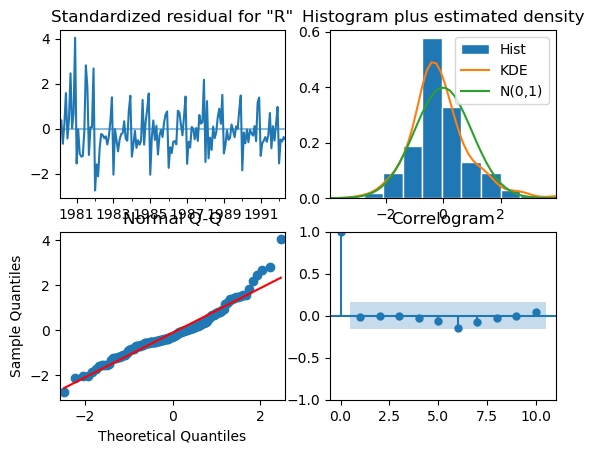

In [179]:
results_manual_ARIMA.plot_diagnostics();
plt.savefig('rose_train_manual_diag_plot.jpg', bbox_inches='tight');

### Predict on the Test by using this model and evaluate the model.

In [180]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(rtest))

In [181]:
rmse = mean_squared_error(rtest['Rose'],predicted_manual_ARIMA,squared=False)
mape = mean_absolute_percentage_error(rtest['Rose'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 20.80704263934656 
MAPE: 44.39390641337691


In [182]:
temp_resultsR2 = pd.DataFrame({'Test RMSE Rose': rmse,'Test MAPE Rose':mape}
                           ,index=['ARIMA(2,1,2)'])


resultsR2 = pd.concat([resultsR0,temp_resultsR2])

resultsR2

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906


In [183]:
resultsR0 = resultsR2.copy()
resultsR0

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906


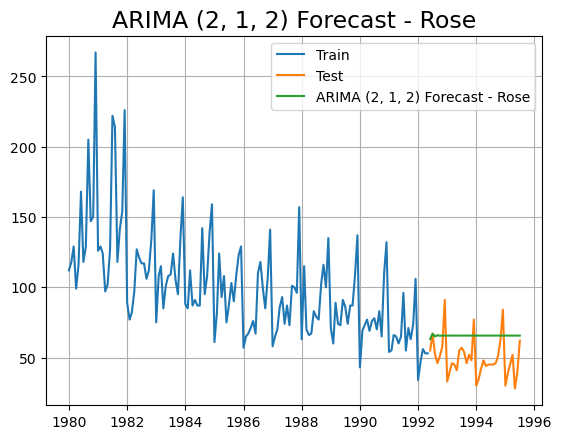

In [184]:
plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(predicted_manual_ARIMA, label = 'ARIMA (2, 1, 2) Forecast - Rose')
plt.grid()
plt.legend(loc='best')
plt.title('ARIMA (2, 1, 2) Forecast - Rose', fontsize=17)
plt.savefig('rose_arima_manual_forecast.jpg', bbox_inches='tight');

### Automated version of a SARIMA model for that the best parameters are selected with the lowest Akaike Information Criteria (AIC) - ROSE DATA

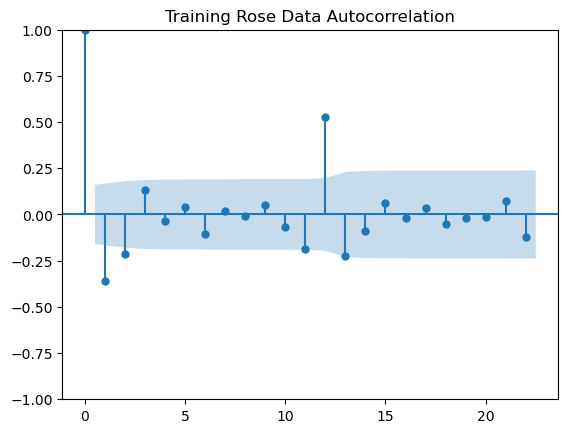

In [185]:
plot_acf(rtrain.diff(),title='Training Rose Data Autocorrelation',missing='drop');

In [186]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [187]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [188]:
import pandas as pd
import statsmodels.api as sm

# Initialize an empty DataFrame with columns 'param', 'seasonal', and 'AIC'
SARIMA_AIC = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
  for param_seasonal in PDQ:
    SARIMA_model = sm.tsa.statespace.SARIMAX(rtrain['Rose'].values,
                                             order=param,
                                             seasonal_order=param_seasonal,
                                             enforce_stationarity=False,
                                             enforce_invertibility=False)

    results_SARIMA = SARIMA_model.fit(maxiter=1000)
    print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))

    # Create a DataFrame with a single row for the current parameters and AIC
    new_row = pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [results_SARIMA.aic]})

    # Concatenate the existing DataFrame with the new row, ignoring the index
    SARIMA_AIC = pd.concat([SARIMA_AIC, new_row], ignore_index=True)


SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1490.0345452860875


C:\Users\Benita Merlin E\AppData\Local\Temp\ipykernel_1968\1474184246.py:22: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1302.697829354208
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1125.1581817890426
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:1015.1383797637212
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1290.8077973421262
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1264.736407929549
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1113.3942533844192
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:976.1261895970679
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1102.8305224014357
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1104.8305217744385
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1097.4032249308354
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:975.3917718611788
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:991.5714902992278
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:991.2295150127563
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:990.7881498552103
SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:973.6560547041018
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1419.9674001674057
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1246.4892340582073
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:1062.317431609564
SARIMA(0, 1, 1)x(0,

In [189]:
SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
191,"(2, 1, 3)","(3, 0, 3, 12)",895.745636
187,"(2, 1, 3)","(2, 0, 3, 12)",896.070194
59,"(0, 1, 3)","(2, 0, 3, 12)",896.576434
63,"(0, 1, 3)","(3, 0, 3, 12)",896.779620
55,"(0, 1, 3)","(1, 0, 3, 12)",897.714188


In [190]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(rtrain['Rose'],
                                order=(3, 1, 1),
                                seasonal_order=(3, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                        SARIMAX Results                                        
Dep. Variable:                                    Rose   No. Observations:                  149
Model:             SARIMAX(3, 1, 1)x(3, 0, [1, 2], 12)   Log Likelihood                -443.427
Date:                                 Thu, 02 Jan 2025   AIC                            906.854
Time:                                         22:55:38   BIC                            933.768
Sample:                                     01-01-1980   HQIC                           917.769
                                          - 05-01-1992                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0322      0.115      0.279      0.781      -0.194       0

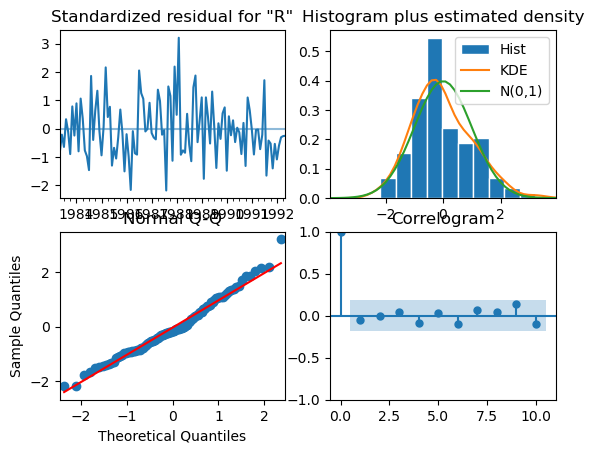

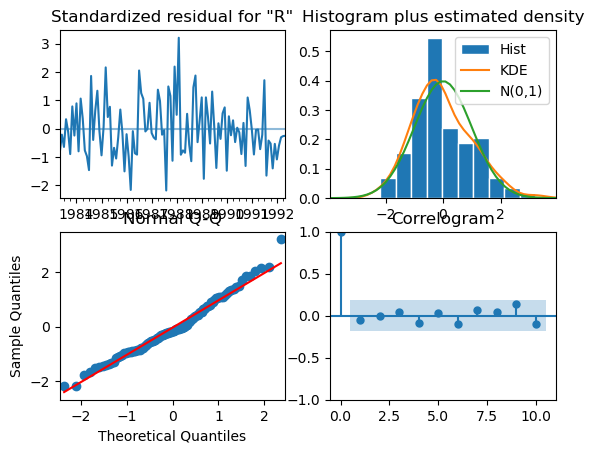

In [191]:
results_auto_SARIMA.plot_diagnostics();
plt.savefig('rose_sarima_auto_30212_diag_plot.jpg', bbox_inches='tight')

### Predict on the Test by using this model and evaluate the model.

In [192]:
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(rtest))
predicted_auto_SARIMA1= results_auto_SARIMA.get_prediction(start=pd.to_datetime('1991-01-01'), dynamic=False)

predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1992-06-01,58.080429,13.625823,31.374307,84.786550
1992-07-01,69.517832,13.750634,42.567084,96.468580
1992-08-01,58.895363,13.815760,31.816971,85.973756
1992-09-01,64.408158,13.839130,37.283962,91.532353
1992-10-01,62.988788,13.880082,35.784327,90.193248


In [193]:
predicted_auto_SARIMA1

In [194]:
rmse = mean_squared_error(rtest['Rose'],predicted_auto_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(rtest['Rose'],predicted_auto_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 9.146772323783 
MAPE: 15.33770710804113


In [195]:
temp_resultsDf = pd.DataFrame({'Test RMSE Rose': rmse,'Test MAPE Rose':mape}
                           ,index=['SARIMA(3, 1, 1)(3, 0, 2, 12)'])


resultsDf = pd.concat([resultsR0,temp_resultsDf])

resultsDf

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906
"SARIMA(3, 1, 1)(3, 0, 2, 12)",9.146772,15.337707


In [196]:
resultsR0 = resultsDf.copy()
resultsR0.to_csv('rose_auto_sarima.csv')
resultsR0

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906
"SARIMA(3, 1, 1)(3, 0, 2, 12)",9.146772,15.337707


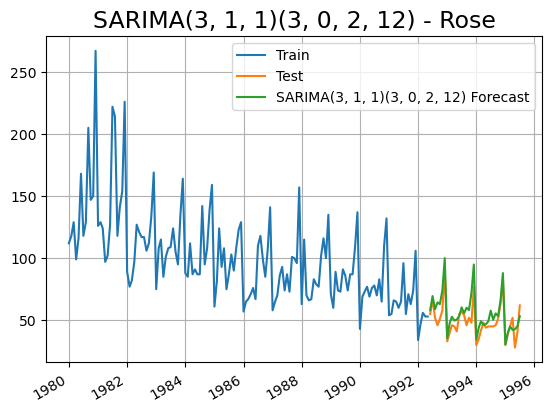

In [197]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')
# plt.plot(predicted_auto_SARIMA,label='SARIMA(3, 1, 1)(3, 0, 2, 12)')
# predicted_auto_SARIMA.plot(label='SARIMA(3, 1, 1)(3, 0, 2, 12)')
predicted_auto_SARIMA.predicted_mean.plot(label='SARIMA(3, 1, 1)(3, 0, 2, 12) Forecast')


plt.legend(loc='best')
plt.grid()
plt.title('SARIMA(3, 1, 1)(3, 0, 2, 12) - Rose', fontsize=17);

plt.savefig('rose_sarima_auto_30212.jpg', bbox_inches='tight');

### SARIMA model for which the best parameters are selected at the ACF and the PACF plots. - Seasonality at 12 months

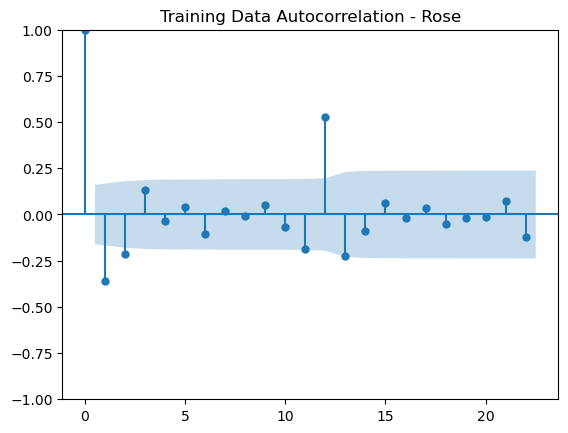

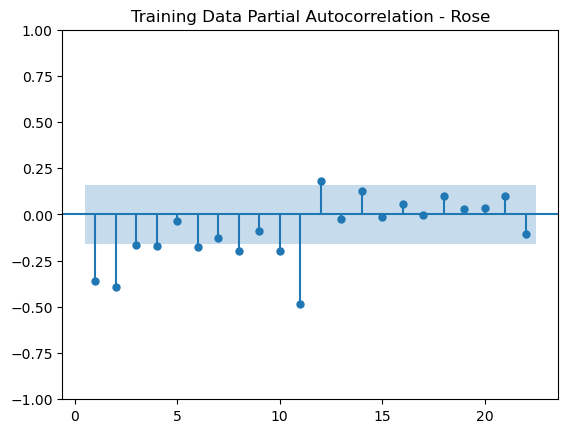

In [198]:
plot_acf(rtrain.diff(),title='Training Data Autocorrelation - Rose',missing='drop')
plot_pacf(rtrain.diff().dropna(),title='Training Data Partial Autocorrelation - Rose',zero=False,method='ywmle');

Given the significance level of 0.05 and a seasonal period of 12, we're setting the Auto-Regressive (AR) parameter 'p' and the Moving-Average (MA) parameter 'q' to 2, consistent with the ARIMA model.

For the seasonal component, we observe that the PACF plot cuts off after a significant lag, suggesting an Auto-Regressive Seasonal (SAR) parameter 'P' of 2. Similarly, the ACF plot cuts off after a significant lag, indicating a Moving-Average Seasonal (SMA) parameter 'Q' of 3.

In [199]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(rtrain['Rose'],
                                order=(2,1,2),
                                seasonal_order=(2, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  149
Model:             SARIMAX(2, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -446.668
Date:                            Thu, 02 Jan 2025   AIC                            911.337
Time:                                    22:55:49   BIC                            935.559
Sample:                                01-01-1980   HQIC                           921.160
                                     - 05-01-1992                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2978      2.203     -0.135      0.892      -4.616       4.020
ar.L2          0.0468      0.200   

In [200]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(rtrain['Rose'],
                                order=(2,1,2),
                                seasonal_order=(3, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA1 = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA1.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  149
Model:             SARIMAX(2, 1, 2)x(3, 1, 2, 12)   Log Likelihood                -401.627
Date:                            Thu, 02 Jan 2025   AIC                            823.255
Time:                                    22:56:01   BIC                            849.104
Sample:                                01-01-1980   HQIC                           833.710
                                     - 05-01-1992                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8195      0.324     -2.530      0.011      -1.454      -0.185
ar.L2         -0.0170      0.144   

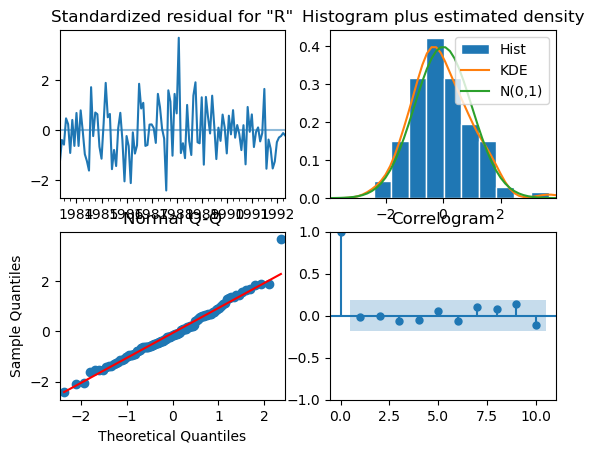

In [201]:
results_manual_SARIMA.plot_diagnostics()
plt.savefig('rose_sarima_21212.jpg', bbox_inches='tight');

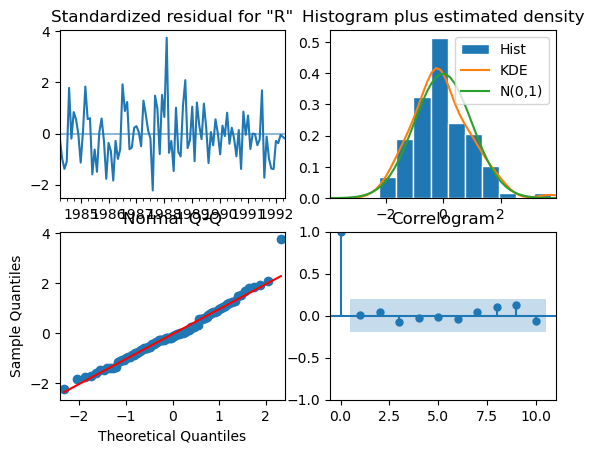

In [202]:
results_manual_SARIMA1.plot_diagnostics()
plt.savefig('rose_sarima_31212.jpg', bbox_inches='tight');

### Predict on the Test by using this model and evaluate the model.

In [203]:
predicted_manual_SARIMA = results_manual_SARIMA.get_forecast(steps=len(rtest))
                                                             
predicted_manual_SARIMA1 = results_manual_SARIMA1.get_forecast(steps=len(rtest))

rmse = mean_squared_error(rtest['Rose'],predicted_manual_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(rtest['Rose'],predicted_manual_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 12.20664060906018 
MAPE: 18.47923993601709


In [204]:
rmse = mean_squared_error(rtest['Rose'],predicted_manual_SARIMA1.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(rtest['Rose'],predicted_manual_SARIMA1.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 12.005275480869289 
MAPE: 18.397010480938423


In [205]:
temp_resultsDf = pd.DataFrame({'Test RMSE Rose': [rmse],'Test MAPE Rose':mape}
                           ,index=['SARIMA(2,1,2)(3,1,2,12)'])


resultsDf = pd.concat([resultsDf,temp_resultsDf])

resultsDf

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906
"SARIMA(3, 1, 1)(3, 0, 2, 12)",9.146772,15.337707
"SARIMA(2,1,2)(3,1,2,12)",12.005275,18.397010


In [206]:
resultsR0 = resultsDf.copy()

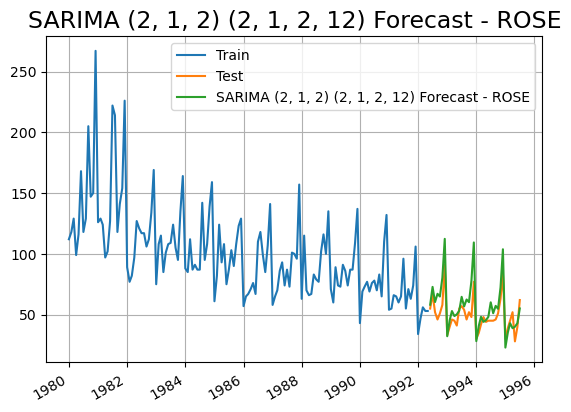

In [207]:
plt.plot(rtrain, label='Train')
plt.plot(rtest, label ='Test')

predicted_manual_SARIMA.predicted_mean.plot(label = 'SARIMA (2, 1, 2) (2, 1, 2, 12) Forecast - ROSE')
plt.grid()
plt.legend(loc='best')
plt.title('SARIMA (2, 1, 2) (2, 1, 2, 12) Forecast - ROSE', fontsize=17)
plt.savefig('rose_sarima_manual_forecast.jpg', bbox_inches='tight');

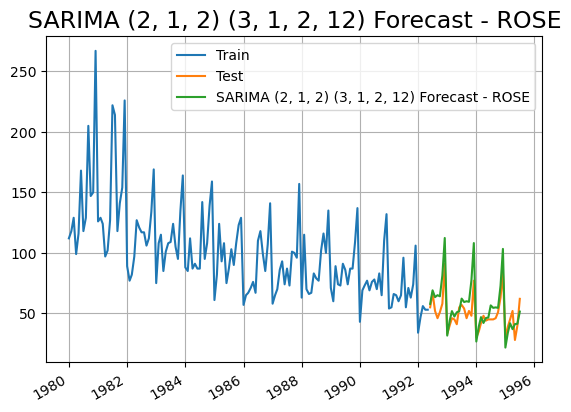

In [208]:
plt.plot(rtrain, label='Train')
plt.plot(rtest, label ='Test')

predicted_manual_SARIMA1.predicted_mean.plot(label = 'SARIMA (2, 1, 2) (3, 1, 2, 12) Forecast - ROSE')
plt.grid()
plt.legend(loc='best')
plt.title('SARIMA (2, 1, 2) (3, 1, 2, 12) Forecast - ROSE', fontsize=17)
plt.savefig('rose_sarima_manual_forecast1.jpg', bbox_inches='tight');

In [209]:
full_data_model = sm.tsa.statespace.SARIMAX(rose_data['Rose'],
                                order=(2,1,2),
                                seasonal_order=(2,1,2,12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_full_data_model = full_data_model.fit(maxiter=1000)
print(results_full_data_model.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  187
Model:             SARIMAX(2, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -587.566
Date:                            Thu, 02 Jan 2025   AIC                           1193.133
Time:                                    22:56:23   BIC                           1220.047
Sample:                                01-01-1980   HQIC                          1204.068
                                     - 07-01-1995                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8645      0.101     -8.550      0.000      -1.063      -0.666
ar.L2          0.0345      0.091   

### Forecast for the next 12 months

In [210]:
predicted_manual_SARIMA_full_data = results_full_data_model.get_forecast(steps=12)

pred_full_manual_SARIMA_date = predicted_manual_SARIMA_full_data.summary_frame(alpha=0.05)
pred_full_manual_SARIMA_date.head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-01,42.841239,12.678228,17.992369,67.690109
1995-09-01,43.279847,12.964956,17.868999,68.690694
1995-10-01,45.825115,12.968975,20.406392,71.243839
1995-11-01,57.324903,13.129359,31.591833,83.057973
1995-12-01,85.051015,13.138181,59.300654,110.801377


In [211]:
rmse = mean_squared_error(rose_data['Rose'],results_full_data_model.fittedvalues,squared=False)
print('RMSE of the Full Model',rmse)

RMSE of the Full Model 35.90969211173819


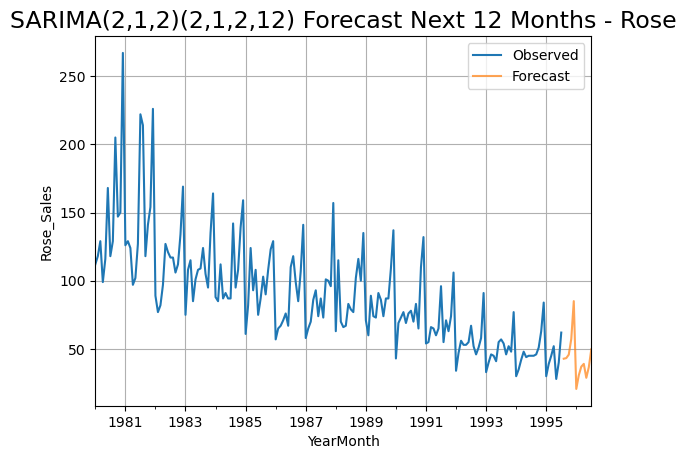

In [212]:
axis = rose_data['Rose'].plot(label='Observed')
pred_full_manual_SARIMA_date['mean'].plot(ax=axis, label='Forecast', alpha=0.7)

axis.set_xlabel('YearMonth')
axis.set_ylabel('Rose_Sales')
plt.legend(loc='best')
plt.grid();
plt.title('SARIMA(2,1,2)(2,1,2,12) Forecast Next 12 Months - Rose', fontsize=17);
plt.savefig('rose_forecast.jpg', bbox_inches='tight');

In [213]:
resultsDf

,Test RMSE Rose,Test MAPE Rose
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906
"SARIMA(3, 1, 1)(3, 0, 2, 12)",9.146772,15.337707
"SARIMA(2,1,2)(3,1,2,12)",12.005275,18.397010


In [214]:
resultsR0 = resultsDf.copy()
resultsR0.to_csv('rose_all_arima.csv')

In [215]:
results_rose = pd.concat([resultsDf14, resultsR0], axis=0)
results_rose

,Test RMSE Rose,Test RMSE Sparkling,Test MAPE Rose
SimpleAverageModel,52.239499,1331.037637,NaN
2pointTrailingMovingAverage,11.529409,813.400684,NaN
4pointTrailingMovingAverage,14.455221,1156.589694,NaN
6pointTrailingMovingAverage,14.572009,1283.927428,NaN
9pointTrailingMovingAverage,14.731209,1346.278315,NaN
RegressionOnTime,17.510241,1349.042457,NaN
Simple Exponential Smoothing,20.313625,1329.926189,NaN
Double Exponential Smoothing,13.726141,1340.452782,NaN
Triple Exponential Smoothing (Additive Season),13.981658,304.268132,NaN
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779,NaN


In [216]:
results_rose.sort_values(by=['Test RMSE Rose']).to_csv('results_rose.csv')

In [217]:
resultsDf.sort_values(by=['Test RMSE Rose'])

,Test RMSE Rose,Test MAPE Rose
"SARIMA(3, 1, 1)(3, 0, 2, 12)",9.146772,15.337707
"SARIMA(2,1,2)(3,1,2,12)",12.005275,18.397010
"ARIMA(2,1,3)",19.726752,41.634540
"ARIMA(2,1,2)",20.807043,44.393906


### ARIMA / SARIMA Model on SPARKLING dataset
#### Check for stationarity of the Training Data - Sparkling

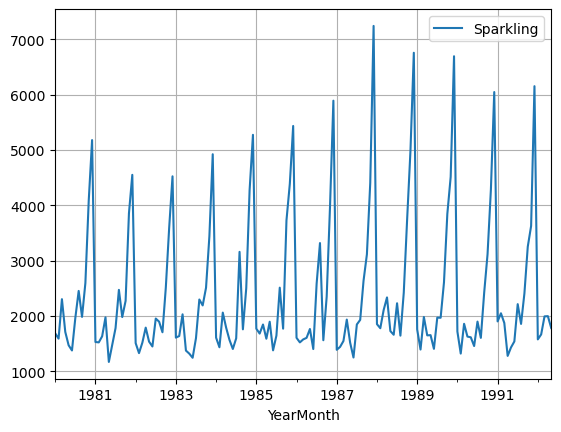

In [218]:
strain.plot(grid=True);

In [219]:
dftest = adfuller(strain,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -2.148
DF test p-value is 0.5192368933802323
Number of lags used 12


In [220]:
dftest = adfuller(strain.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -8.688
DF test p-value is 1.8554049423907268e-12
Number of lags used 11


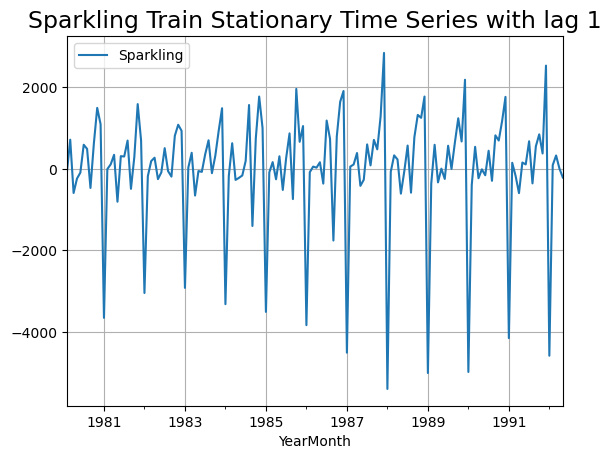

In [221]:
strain.diff().dropna().plot(grid=True);
plt.title('Sparkling Train Stationary Time Series with lag 1', fontsize=17);
plt.savefig('spark_train_stationary.jpg', bbox_inches='tight');

In [222]:
strain.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 149 entries, 1980-01-01 to 1992-05-01
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Sparkling  149 non-null    int64
dtypes: int64(1)
memory usage: 2.3 KB


### Automated version of an ARIMA model for which the best parameters are selected at the lowest Akaike Information Criteria (AIC) - SPARKLING

In [223]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [224]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [225]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Initialize an empty DataFrame with columns 'param' and 'AIC'
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])

for param in pdq:
  ARIMA_model = ARIMA(strain['Sparkling'].values, order=param).fit()
  print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))

  # Create a DataFrame with a single row for the current parameter and AIC
  new_row = pd.DataFrame({'param': [param], 'AIC': [ARIMA_model.aic]})

  # Concatenate the existing DataFrame with the new row, ignoring the index
  ARIMA_AIC = pd.concat([ARIMA_AIC, new_row], ignore_index=True)


ARIMA(0, 1, 0) - AIC:2569.144555918453


C:\Users\Benita Merlin E\AppData\Local\Temp\ipykernel_1968\392230183.py:15: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



ARIMA(0, 1, 1) - AIC:2548.768274437777
ARIMA(0, 1, 2) - AIC:2523.5414888724495
ARIMA(0, 1, 3) - AIC:2523.857635574073
ARIMA(1, 1, 0) - AIC:2565.740479972414
ARIMA(1, 1, 1) - AIC:2524.885266566938
ARIMA(1, 1, 2) - AIC:2524.3341772985245
ARIMA(1, 1, 3) - AIC:2525.586447904496
ARIMA(2, 1, 0) - AIC:2558.914388971052
ARIMA(2, 1, 1) - AIC:2523.417016089832


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



ARIMA(2, 1, 2) - AIC:2503.629318337231


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



ARIMA(2, 1, 3) - AIC:2522.6489343952503
ARIMA(3, 1, 0) - AIC:2555.5506167400176
ARIMA(3, 1, 1) - AIC:2524.773766707549


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



ARIMA(3, 1, 2) - AIC:2519.507954523964
ARIMA(3, 1, 3) - AIC:2519.495554268201


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [226]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
10,"(2, 1, 2)",2503.629318
15,"(3, 1, 3)",2519.495554
14,"(3, 1, 2)",2519.507955
11,"(2, 1, 3)",2522.648934
9,"(2, 1, 1)",2523.417016


In [227]:
auto_ARIMA = ARIMA(strain, order=(2,1,2))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  149
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1246.815
Date:                Thu, 02 Jan 2025   AIC                           2503.629
Time:                        22:56:34   BIC                           2518.615
Sample:                    01-01-1980   HQIC                          2509.718
                         - 05-01-1992                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2575      0.046     27.232      0.000       1.167       1.348
ar.L2         -0.5280      0.082     -6.471      0.000      -0.688      -0.368
ma.L1         -1.9237      0.058    -33.054      0.0

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



### Diagnostics - Sparkling

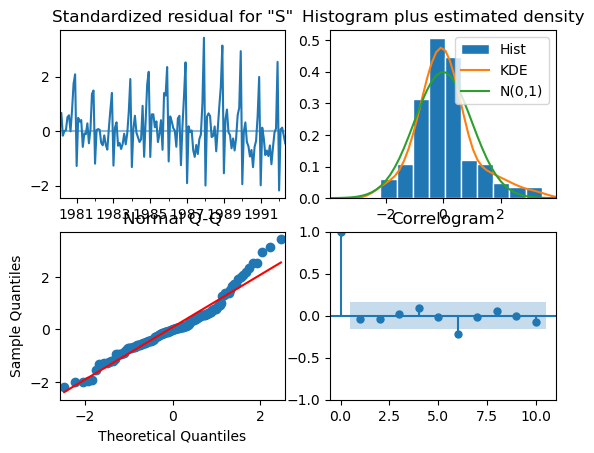

In [228]:
results_auto_ARIMA.plot_diagnostics();
plt.savefig('spark_arima_diag_plot.jpg', bbox_inches='tight');

### Predict on the Test by using this model and evaluate the model.

In [229]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(stest))

## Mean Absolute Percentage Error (MAPE) - Function Definition

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

## Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error


rmse = mean_squared_error(stest['Sparkling'],predicted_auto_ARIMA,squared=False)
mape = mean_absolute_percentage_error(stest['Sparkling'],predicted_auto_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1326.4162732205587 
MAPE: 41.351452421777296


In [230]:
resultsDf = pd.DataFrame({'RMSE': rmse,'MAPE':mape}
                           ,index=['ARIMA(2,1,2)'])

resultsDf.to_csv('spark_arima_auto_212.csv')
resultsDf

,RMSE,MAPE
"ARIMA(2,1,2)",1326.416273,41.351452


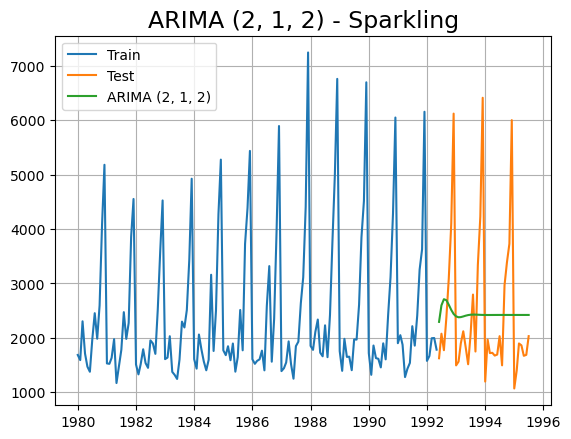

In [231]:
plt.plot(strain, label='Train')
plt.plot(stest, label='Test')
plt.plot(predicted_auto_ARIMA, label='ARIMA (2, 1, 2)')

plt.title('ARIMA (2, 1, 2) - Sparkling', fontsize=17)
plt.grid()
plt.legend(loc='best')

plt.savefig('spark_arima_auto_212.jpg', bbox_inches='tight');

### ARIMA model for which the best parameters are selected at the ACF and the PACF plots - SPARKLING

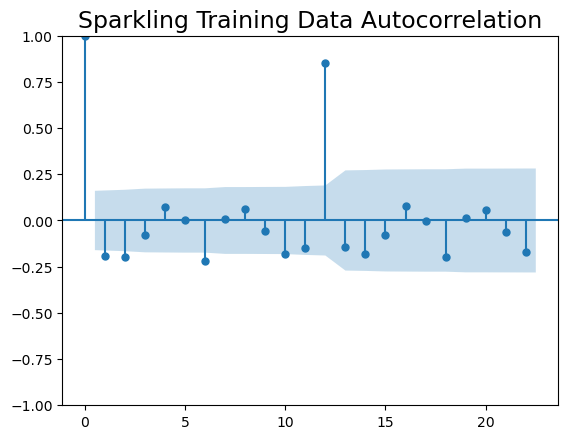

In [232]:
plot_acf(strain.diff(),missing='drop')
plt.title('Sparkling Training Data Autocorrelation', fontsize=17)
plt.savefig('spark_train_acf.jpg', bbox_inches='tight');


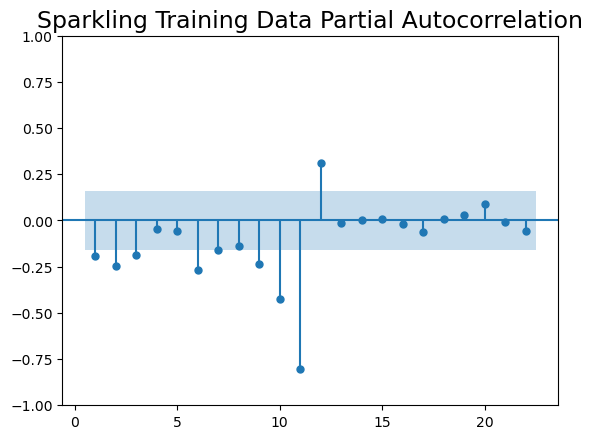

In [233]:
plot_pacf(strain.diff().dropna(),title='Training Data Partial Autocorrelation',zero=False,method='ywmle')
plt.title('Sparkling Training Data Partial Autocorrelation', fontsize=17)
plt.savefig('spark_train_pacf.jpg', bbox_inches='tight');

In [234]:
manual_ARIMA = ARIMA(strain['Sparkling'], order=(0,1,0))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  149
Model:                 ARIMA(0, 1, 0)   Log Likelihood               -1283.572
Date:                Thu, 02 Jan 2025   AIC                           2569.145
Time:                        22:56:39   BIC                           2572.142
Sample:                    01-01-1980   HQIC                          2570.362
                         - 05-01-1992                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.985e+06   1.29e+05     15.350      0.000    1.73e+06    2.24e+06
Ljung-Box (L1) (Q):                   5.43   Jarque-Bera (JB):               200.21
Prob(Q):                              0.02   Pr

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



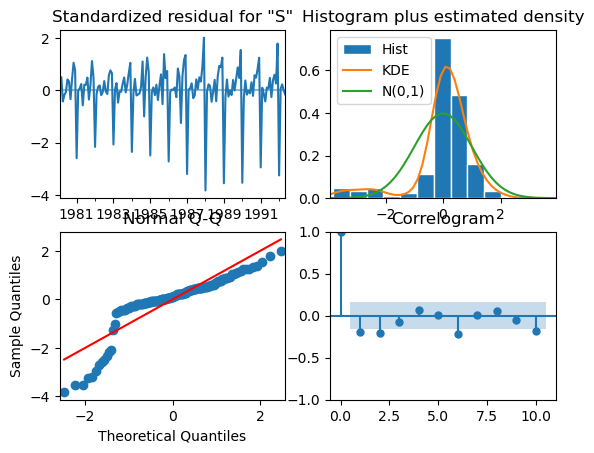

In [235]:
results_manual_ARIMA.plot_diagnostics();

plt.savefig('spark_train_diag_plot.jpg', bbox_inches='tight');

### Predict on the Test by using this model and evaluate the model.

In [236]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(stest))

rmse = mean_squared_error(stest['Sparkling'],predicted_manual_ARIMA,squared=False)
mape = mean_absolute_percentage_error(stest['Sparkling'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1490.2074475864442 
MAPE: 25.510451271088026


In [237]:
temp_resultsDf = pd.DataFrame({'RMSE': rmse,'MAPE':mape}
                           ,index=['ARIMA(0,1,0)'])


resultsDf = pd.concat([resultsDf,temp_resultsDf])

resultsDf

,RMSE,MAPE
"ARIMA(2,1,2)",1326.416273,41.351452
"ARIMA(0,1,0)",1490.207448,25.510451


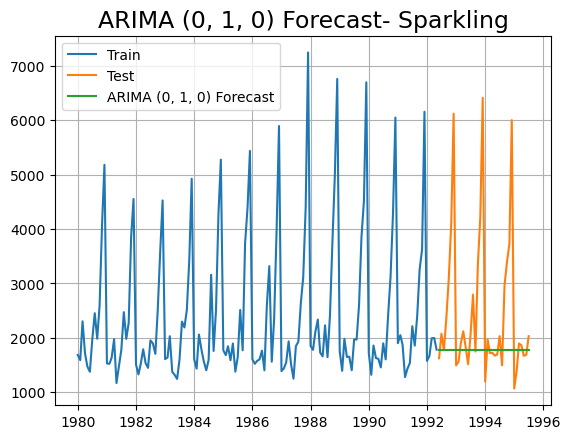

In [238]:
plt.plot(strain, label='Train')
plt.plot(stest, label='Test')
plt.plot(predicted_manual_ARIMA, label='ARIMA (0, 1, 0) Forecast')

plt.grid()
plt.legend(loc='best')
plt.title('ARIMA (0, 1, 0) Forecast- Sparkling', fontsize=17)
plt.savefig('spark_manual_arima_010.jpg', bbox_inches='tight');

### Automated version of a SARIMA model for which the best parameters are selected at lowest Akaike Information Criteria (AIC) - SPARKLING

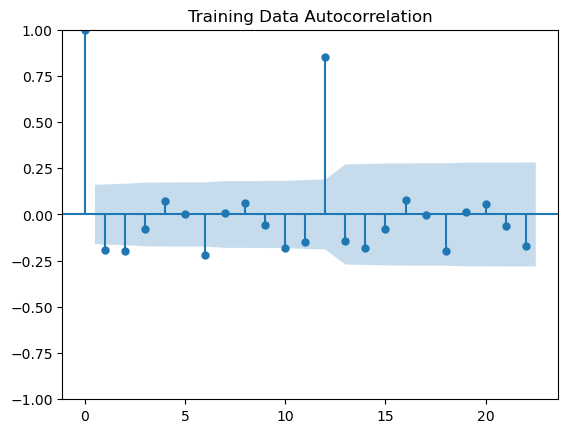

In [239]:
plot_acf(strain.diff(),title='Training Data Autocorrelation',missing='drop');

In [240]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [241]:
import pandas as pd
import statsmodels.api as sm

# Initialize an empty DataFrame with columns 'param', 'seasonal', and 'AIC'
SARIMA_AIC = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
  for param_seasonal in PDQ:
    SARIMA_model = sm.tsa.statespace.SARIMAX(strain['Sparkling'].values,
                                             order=param,
                                             seasonal_order=param_seasonal,
                                             enforce_stationarity=False,
                                             enforce_invertibility=False)

    results_SARIMA = SARIMA_model.fit(maxiter=1000)
    print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))

    # Create a DataFrame with a single row for the current parameters and AIC
    new_row = pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [results_SARIMA.aic]})

    # Concatenate the existing DataFrame with the new row, ignoring the index
    SARIMA_AIC = pd.concat([SARIMA_AIC, new_row], ignore_index=True)


SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:2552.801193879039


C:\Users\Benita Merlin E\AppData\Local\Temp\ipykernel_1968\1376109262.py:22: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:2243.3800988815724
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1999.2900395365498
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:1786.9950965149349
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:2095.6933312954657
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:2064.1436675047944
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1886.906811961827
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:1709.3311583375857
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1903.3395093692977
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1903.1462807791822
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1887.2415731289354
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:1710.8281984142427
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:1724.7987107332874
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:1726.5288991621617
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:1727.627465807219
SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:1702.9887856002315
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:2526.6677450030957
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:2201.248750994061
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:1955.7187291561168
SARIMA(0, 1, 

In [242]:
SARIMA_AIC.sort_values(by=['AIC']).head(40)

,param,seasonal,AIC
55,"(0, 1, 3)","(1, 0, 3, 12)",1619.515515
119,"(1, 1, 3)","(1, 0, 3, 12)",1619.948463
59,"(0, 1, 3)","(2, 0, 3, 12)",1620.537975
123,"(1, 1, 3)","(2, 0, 3, 12)",1620.826840
183,"(2, 1, 3)","(1, 0, 3, 12)",1621.680920
247,"(3, 1, 3)","(1, 0, 3, 12)",1622.839647
187,"(2, 1, 3)","(2, 0, 3, 12)",1624.429665
127,"(1, 1, 3)","(3, 0, 3, 12)",1624.492966
63,"(0, 1, 3)","(3, 0, 3, 12)",1624.814552
255,"(3, 1, 3)","(3, 0, 3, 12)",1625.014576


In [243]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(strain['Sparkling'],
                                order=(3, 1, 1),
                                seasonal_order=(3, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                      SARIMAX Results                                      
Dep. Variable:                           Sparkling   No. Observations:                  149
Model:             SARIMAX(3, 1, 1)x(3, 0, [], 12)   Log Likelihood                -810.121
Date:                             Thu, 02 Jan 2025   AIC                           1636.242
Time:                                     23:14:02   BIC                           1657.773
Sample:                                 01-01-1980   HQIC                          1644.973
                                      - 05-01-1992                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2341      0.103      2.264      0.024       0.031       0.437
ar.L2         -0.1135      

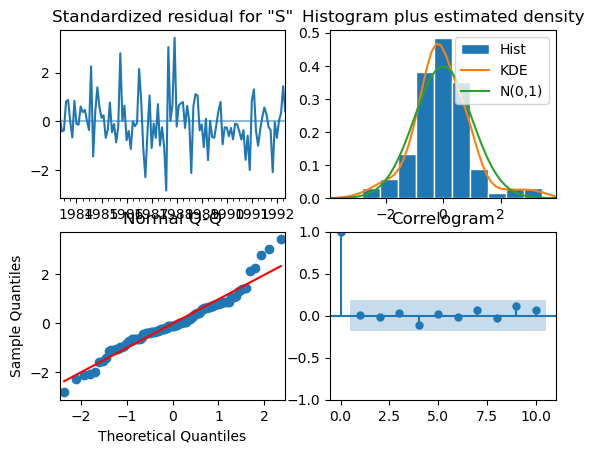

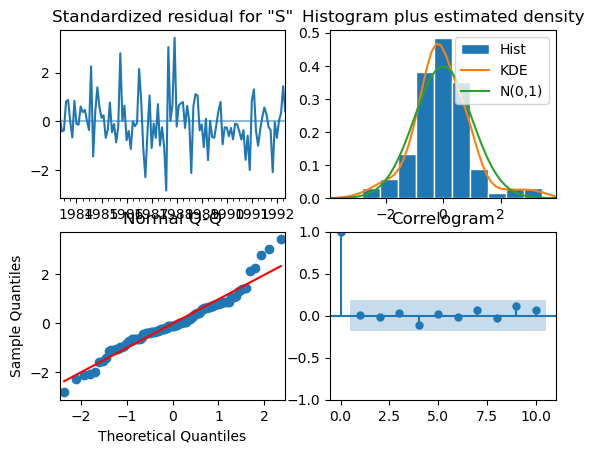

In [244]:
results_auto_SARIMA.plot_diagnostics()
plt.savefig('spark_sarima00312_diag_plot.jpg', bbox_inches='tight');
plt.show()

### Predict on the Test by using this model and evaluate the model.

In [245]:
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(stest))

predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1992-06-01,1493.390472,405.011192,699.583122,2287.197821
1992-07-01,2098.301454,418.685386,1277.693176,2918.909732
1992-08-01,1823.882450,418.798522,1003.052431,2644.712469
1992-09-01,2449.947834,419.223024,1628.285805,3271.609863
1992-10-01,3328.949499,419.830456,2506.096926,4151.802072


In [246]:
rmse = mean_squared_error(stest['Sparkling'],predicted_auto_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(stest['Sparkling'],predicted_auto_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 294.6898923920041 
MAPE: 10.51054049385311


In [247]:
temp_resultsDf = pd.DataFrame({'RMSE': rmse,'MAPE':mape}
                           ,index=['SARIMA(3,1,1)(3,0,2,12)'])


resultsDf = pd.concat([resultsDf,temp_resultsDf])

resultsDf

,RMSE,MAPE
"ARIMA(2,1,2)",1326.416273,41.351452
"ARIMA(0,1,0)",1490.207448,25.510451
"SARIMA(3,1,1)(3,0,2,12)",294.689892,10.510540


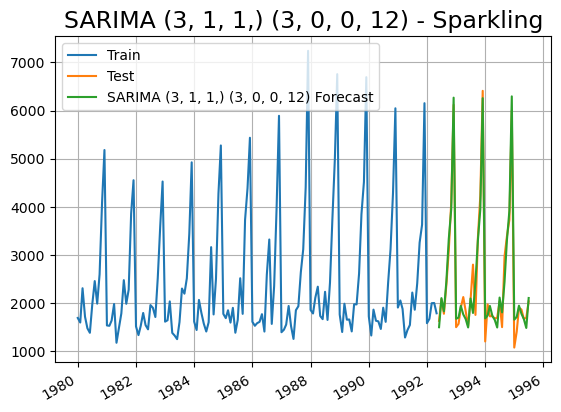

In [248]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')
# plt.plot(predicted_auto_SARIMA,label='SARIMA(3, 1, 1)(3, 0, 2, 12)')
# predicted_auto_SARIMA.plot(label='SARIMA(3, 1, 1)(3, 0, 2, 12)')
predicted_auto_SARIMA.predicted_mean.plot(label='SARIMA (3, 1, 1,) (3, 0, 0, 12) Forecast')


plt.legend(loc='best')
plt.grid()
plt.title('SARIMA (3, 1, 1,) (3, 0, 0, 12) - Sparkling', fontsize=17);

plt.savefig('spark_sarima_auto_30012.jpg', bbox_inches='tight');

### SARIMA model for which the best parameters are selected at the ACF and the PACF plots. - Seasonality at 12 months - SPARKLING

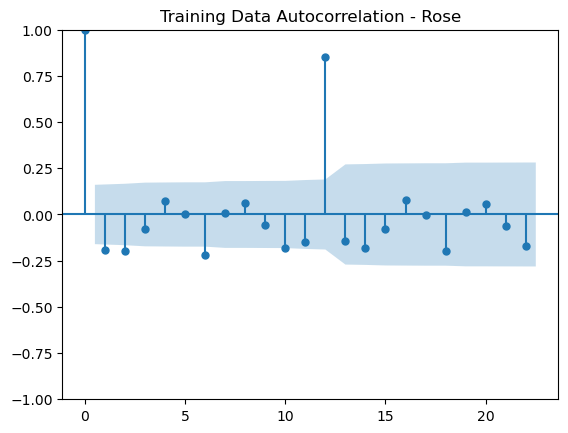

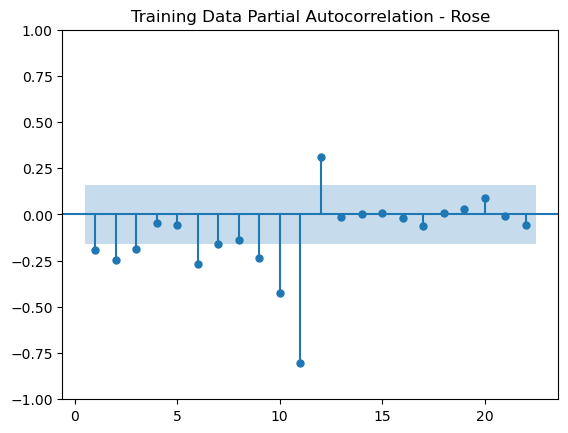

In [249]:
plot_acf(strain.diff(),title='Training Data Autocorrelation - Rose',missing='drop')
plot_pacf(strain.diff().dropna(),title='Training Data Partial Autocorrelation - Rose',zero=False,method='ywmle');

In [250]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(strain['Sparkling'],
                                order=(0,1,0),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                      SARIMAX Results                                       
Dep. Variable:                            Sparkling   No. Observations:                  149
Model:             SARIMAX(0, 1, 0)x(1, 1, [1], 12)   Log Likelihood                -938.062
Date:                              Thu, 02 Jan 2025   AIC                           1882.123
Time:                                      23:14:05   BIC                           1890.560
Sample:                                  01-01-1980   HQIC                          1885.550
                                       - 05-01-1992                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.1541      0.174      0.885      0.376      -0.187       0.495
ma.S.L12      -0.61

In [251]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(strain['Sparkling'],
                                order=(0,1,0),
                                seasonal_order=(2, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA1 = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA1.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                        SARIMAX Results                                        
Dep. Variable:                               Sparkling   No. Observations:                  149
Model:             SARIMAX(0, 1, 0)x(2, 1, [1, 2], 12)   Log Likelihood                -850.564
Date:                                 Thu, 02 Jan 2025   AIC                           1711.127
Time:                                         23:14:05   BIC                           1724.675
Sample:                                     01-01-1980   HQIC                          1716.623
                                          - 05-01-1992                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.1219      1.452     -0.084      0.933      -2.968       2

In [252]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(strain['Sparkling'],
                                order=(0,1,0),
                                seasonal_order=(3, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA2 = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA2.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                        SARIMAX Results                                        
Dep. Variable:                               Sparkling   No. Observations:                  149
Model:             SARIMAX(0, 1, 0)x(3, 1, [1, 2], 12)   Log Likelihood                -767.963
Date:                                 Thu, 02 Jan 2025   AIC                           1547.926
Time:                                         23:14:07   BIC                           1563.557
Sample:                                     01-01-1980   HQIC                          1554.253
                                          - 05-01-1992                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.3309      0.937     -0.353      0.724      -2.168       1

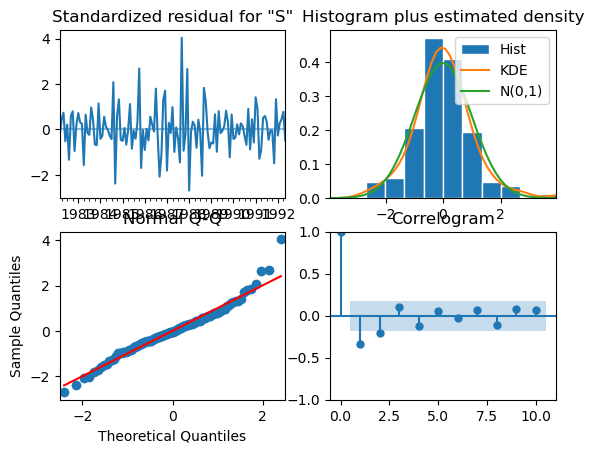

In [253]:
results_manual_SARIMA.plot_diagnostics()
plt.savefig('spark_sarima_11112.jpg', bbox_inches='tight');

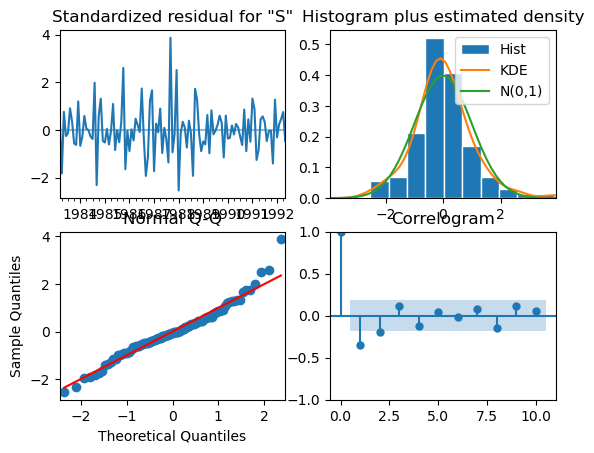

In [254]:
results_manual_SARIMA1.plot_diagnostics()
plt.savefig('spark_sarima_21212.jpg', bbox_inches='tight');

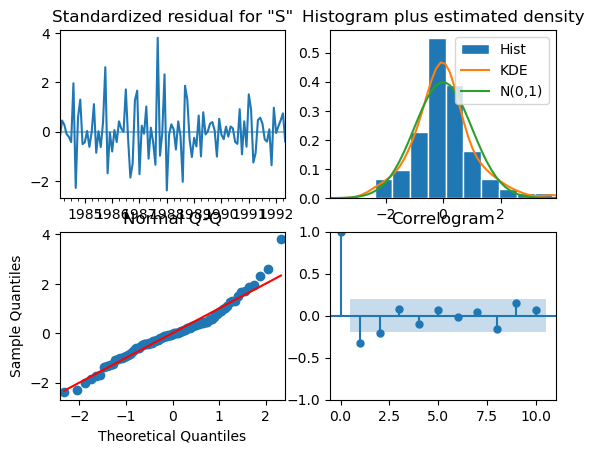

In [255]:
results_manual_SARIMA2.plot_diagnostics()
plt.savefig('spark_sarima_31212.jpg', bbox_inches='tight');

### Predict on the Test by using this model and evaluate the model.

In [256]:
predicted_manual_SARIMA = results_manual_SARIMA.get_forecast(steps=len(stest))
                                                             
predicted_manual_SARIMA1 = results_manual_SARIMA1.get_forecast(steps=len(stest))

predicted_manual_SARIMA2 = results_manual_SARIMA2.get_forecast(steps=len(stest))


rmse = mean_squared_error(stest['Sparkling'],predicted_manual_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(stest['Sparkling'],predicted_manual_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 526.163713235569 
MAPE: 24.241683516868367


In [257]:
rmse1 = mean_squared_error(stest['Sparkling'],predicted_manual_SARIMA1.predicted_mean,squared=False)
mape1 = mean_absolute_percentage_error(stest['Sparkling'],predicted_manual_SARIMA1.predicted_mean)
print('RMSE:',rmse1,'\nMAPE:',mape1)

RMSE: 538.4523641626449 
MAPE: 24.93511579091469


In [258]:
rmse2 = mean_squared_error(stest['Sparkling'],predicted_manual_SARIMA2.predicted_mean,squared=False)
mape2 = mean_absolute_percentage_error(stest['Sparkling'],predicted_manual_SARIMA2.predicted_mean)
print('RMSE:',rmse2,'\nMAPE:',mape2)

RMSE: 565.5210117255473 
MAPE: 26.131920334253756


In [259]:
temp_resultsDf = pd.DataFrame({'RMSE': [rmse, rmse1, rmse2],'MAPE':[mape, mape1, mape2]}
                           ,index=['SARIMA(0,1,0)(3,1,2,12)', 'SARIMA(0,1,0)(2,1,2,12)', 'SARIMA(0,1,0)(3,1,2,12)'])


resultsDf = pd.concat([resultsDf,temp_resultsDf])

resultsDf

,RMSE,MAPE
"ARIMA(2,1,2)",1326.416273,41.351452
"ARIMA(0,1,0)",1490.207448,25.510451
"SARIMA(3,1,1)(3,0,2,12)",294.689892,10.510540
"SARIMA(0,1,0)(3,1,2,12)",526.163713,24.241684
"SARIMA(0,1,0)(2,1,2,12)",538.452364,24.935116
"SARIMA(0,1,0)(3,1,2,12)",565.521012,26.131920


In [260]:
resultsR0 = resultsDf.copy()

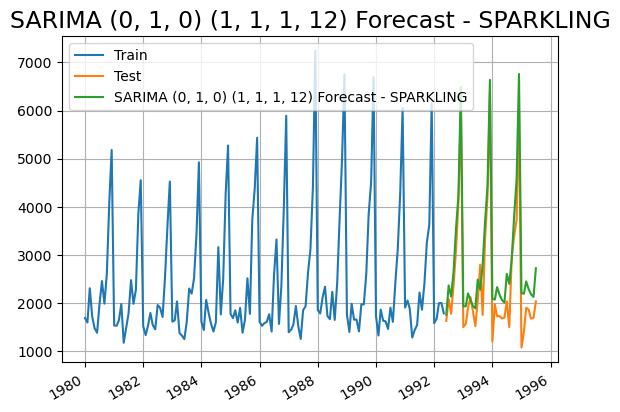

In [261]:
plt.plot(strain, label='Train')
plt.plot(stest, label ='Test')

predicted_manual_SARIMA.predicted_mean.plot(label = 'SARIMA (0, 1, 0) (1, 1, 1, 12) Forecast - SPARKLING')
plt.grid()
plt.legend(loc='best')
plt.title('SARIMA (0, 1, 0) (1, 1, 1, 12) Forecast - SPARKLING', fontsize=17)
plt.savefig('SPARK_sarima_manual_forecast_11112.jpg', bbox_inches='tight');

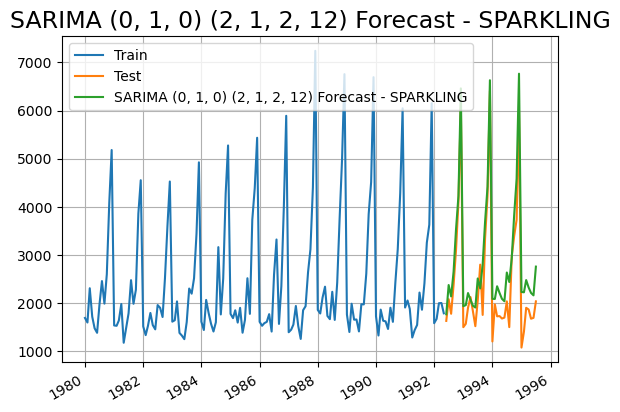

In [262]:
plt.plot(strain, label='Train')
plt.plot(stest, label ='Test')

predicted_manual_SARIMA1.predicted_mean.plot(label = 'SARIMA (0, 1, 0) (2, 1, 2, 12) Forecast - SPARKLING')
plt.grid()
plt.legend(loc='best')
plt.title('SARIMA (0, 1, 0) (2, 1, 2, 12) Forecast - SPARKLING', fontsize=17)
plt.savefig('spark_sarima_manual_forecast1.jpg', bbox_inches='tight');

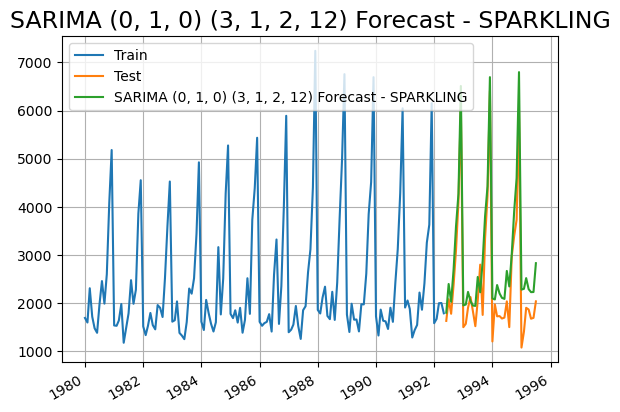

In [263]:
plt.plot(strain, label='Train')
plt.plot(stest, label ='Test')

predicted_manual_SARIMA2.predicted_mean.plot(label = 'SARIMA (0, 1, 0) (3, 1, 2, 12) Forecast - SPARKLING')
plt.grid()
plt.legend(loc='best')
plt.title('SARIMA (0, 1, 0) (3, 1, 2, 12) Forecast - SPARKLING', fontsize=17)
plt.savefig('spark_sarima_manual_forecast2.jpg', bbox_inches='tight');

In [264]:
full_data_model = sm.tsa.statespace.SARIMAX(rose_data['Rose'],
                                order=(2,1,2),
                                seasonal_order=(2,1,2,12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_full_data_model = full_data_model.fit(maxiter=1000)
print(results_full_data_model.summary())

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  187
Model:             SARIMAX(2, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -587.566
Date:                            Thu, 02 Jan 2025   AIC                           1193.133
Time:                                    23:14:15   BIC                           1220.047
Sample:                                01-01-1980   HQIC                          1204.068
                                     - 07-01-1995                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8645      0.101     -8.550      0.000      -1.063      -0.666
ar.L2          0.0345      0.091   

### Evaluate the whole data and predict the next 12 months

In [265]:
predicted_manual_SARIMA_full_data = results_full_data_model.get_forecast(steps=12)

pred_full_manual_SARIMA_date = predicted_manual_SARIMA_full_data.summary_frame(alpha=0.05)
pred_full_manual_SARIMA_date.head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-01,42.841239,12.678228,17.992369,67.690109
1995-09-01,43.279847,12.964956,17.868999,68.690694
1995-10-01,45.825115,12.968975,20.406392,71.243839
1995-11-01,57.324903,13.129359,31.591833,83.057973
1995-12-01,85.051015,13.138181,59.300654,110.801377


In [266]:
rmse = mean_squared_error(rose_data['Rose'],results_full_data_model.fittedvalues,squared=False)
print('RMSE of the Full Model',rmse)

RMSE of the Full Model 35.90969211173819


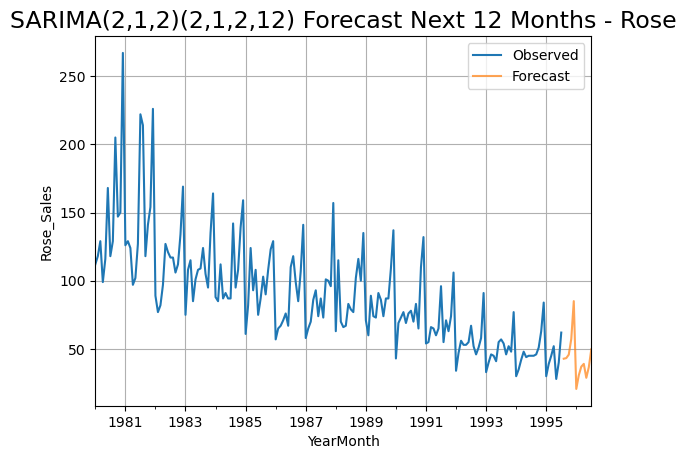

In [267]:
axis = rose_data['Rose'].plot(label='Observed')
pred_full_manual_SARIMA_date['mean'].plot(ax=axis, label='Forecast', alpha=0.7)

axis.set_xlabel('YearMonth')
axis.set_ylabel('Rose_Sales')
plt.legend(loc='best')
plt.grid();
plt.title('SARIMA(2,1,2)(2,1,2,12) Forecast Next 12 Months - Rose', fontsize=17);
plt.savefig('rose_forecast.jpg', bbox_inches='tight');

In [268]:
resultsDf

,RMSE,MAPE
"ARIMA(2,1,2)",1326.416273,41.351452
"ARIMA(0,1,0)",1490.207448,25.510451
"SARIMA(3,1,1)(3,0,2,12)",294.689892,10.510540
"SARIMA(0,1,0)(3,1,2,12)",526.163713,24.241684
"SARIMA(0,1,0)(2,1,2,12)",538.452364,24.935116
"SARIMA(0,1,0)(3,1,2,12)",565.521012,26.131920


In [269]:
resultsS0 = resultsDf.copy()

resultsS0.to_csv('spark_all_arima.csv')

In [270]:
results_all_spark = pd.concat([resultsDf14, resultsS0], axis=0)
results_all_spark

,Test RMSE Rose,Test RMSE Sparkling,RMSE,MAPE
SimpleAverageModel,52.239499,1331.037637,NaN,NaN
2pointTrailingMovingAverage,11.529409,813.400684,NaN,NaN
4pointTrailingMovingAverage,14.455221,1156.589694,NaN,NaN
6pointTrailingMovingAverage,14.572009,1283.927428,NaN,NaN
9pointTrailingMovingAverage,14.731209,1346.278315,NaN,NaN
RegressionOnTime,17.510241,1349.042457,NaN,NaN
Simple Exponential Smoothing,20.313625,1329.926189,NaN,NaN
Double Exponential Smoothing,13.726141,1340.452782,NaN,NaN
Triple Exponential Smoothing (Additive Season),13.981658,304.268132,NaN,NaN
Triple Exponential Smoothing (Multiplicative Season),8.406215,318.532779,NaN,NaN


In [271]:
results_all_spark.to_csv('results_all_spark.csv')

### Best Model Till Now + Forecasting of next 12 months

## SPARKLING
### Triple Exponential Smoothing (Additive Season)

In [272]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(strain,trend='additive',seasonal='additive',initialization_method='estimated')
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)


==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.07597988906206526, 'smoothing_trend': 0.03256743788735303, 'smoothing_seasonal': 0.4450362526143211, 'damping_trend': nan, 'initial_level': 2356.5132179614134, 'initial_trend': -0.32094124393818113, 'initial_seasons': array([-636.24870185, -722.9960436 , -398.64165969, -473.44834236,
       -808.44216442, -815.36752359, -384.24094248,   73.00058148,
       -237.46220767,  272.32471849, 1541.3979244 , 2590.09505051]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [273]:
# Forecasting using this model for the duration of the test set
TES_predict_am_damp_spark =  model_TES_am.forecast(steps=12)
TES_predict_am_damp_spark
prediction_1 = TES_predict_am_damp_spark
TES_predict_am_damp_spark.to_csv('spark_forecast_tes.csv')

1992-06-01    1492.608846
1992-07-01    2081.440495
1992-08-01    1945.201408
1992-09-01    2431.529912
1992-10-01    3338.749890
1992-11-01    4207.351729
1992-12-01    6383.239527
1993-01-01    1743.006165
1993-02-01    1709.369783
1993-03-01    1956.111685
1993-04-01    1773.844323
1993-05-01    1593.386654
Freq: MS, dtype: float64

In [274]:
plt.rcParams["figure.figsize"] = [16,9]

pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(model_TES_am.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(model_TES_am.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1992-06-01,803.283045,1492.608846,2181.934647
1992-07-01,1392.114693,2081.440495,2770.766296
1992-08-01,1255.875607,1945.201408,2634.527210
1992-09-01,1742.204111,2431.529912,3120.855714
1992-10-01,2649.424089,3338.749890,4028.075692


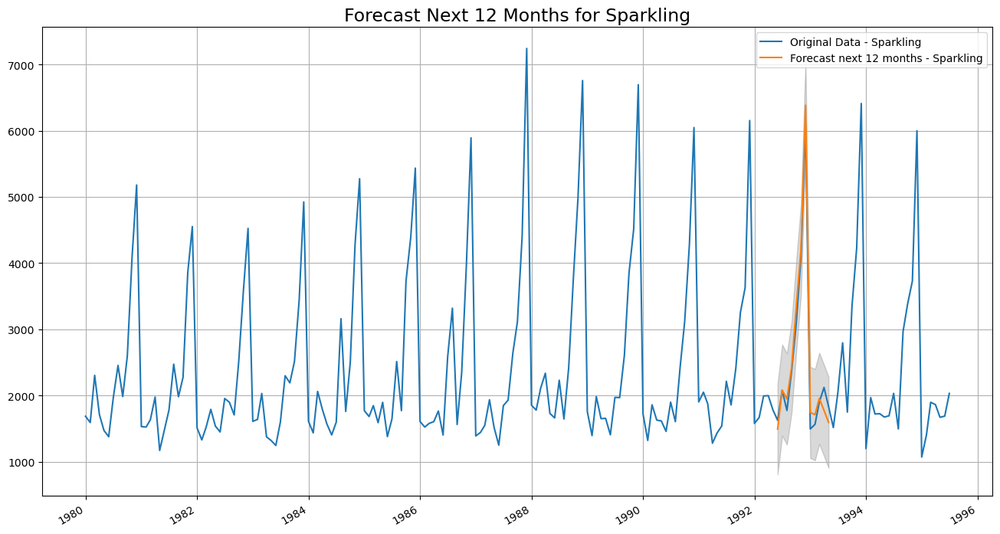

In [275]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(sparkling_data['Sparkling'], label='Original Data - Sparkling')

ax =TES_predict_am_damp_spark.plot(label='Forecast next 12 months - Sparkling')


ax.fill_between(pred_1_df.index,pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Sparkling', fontsize=17);

plt.savefig('spark_forecast_tes.jpg', bbox_inches='tight');

### ROSE 

In [276]:
# Initializing the Double Exponential Smoothing Model
model_TES_am = ExponentialSmoothing(rtrain,trend='add',seasonal='multiplicative',initialization_method='estimated')
# Fitting the model
model_TES_am = model_TES_am.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES_am.params)


==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.09926222794517521, 'smoothing_trend': 0.00011004882158931748, 'smoothing_seasonal': 0.00021713667357767415, 'damping_trend': nan, 'initial_level': 153.11642701118197, 'initial_trend': -0.6185535740569861, 'initial_seasons': array([0.7104098 , 0.80373209, 0.88435157, 0.78124423, 0.86816859,
       0.93604567, 1.0446323 , 1.09107104, 1.03239048, 1.01242076,
       1.17874784, 1.61766735]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\Benita Merlin E\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [277]:
# Forecasting using this model for the duration of the test set
TES_predict =  model_TES_am.forecast(steps=12)
TES_predict
prediction_1 = TES_predict
TES_predict.to_csv('rose_forecast_tes.csv')

1992-06-01    57.296561
1992-07-01    63.300550
1992-08-01    65.432195
1992-09-01    61.285164
1992-10-01    59.472849
1992-11-01    68.516832
1992-12-01    93.022024
1993-01-01    40.408282
1993-02-01    45.226101
1993-03-01    49.215782
1993-04-01    42.998488
1993-05-01    47.239682
Freq: MS, dtype: float64

In [278]:
plt.rcParams["figure.figsize"] = [16,9]

pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(model_TES_am.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(model_TES_am.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1992-06-01,22.646791,57.296561,91.946330
1992-07-01,28.650780,63.300550,97.950320
1992-08-01,30.782425,65.432195,100.081964
1992-09-01,26.635394,61.285164,95.934934
1992-10-01,24.823079,59.472849,94.122619


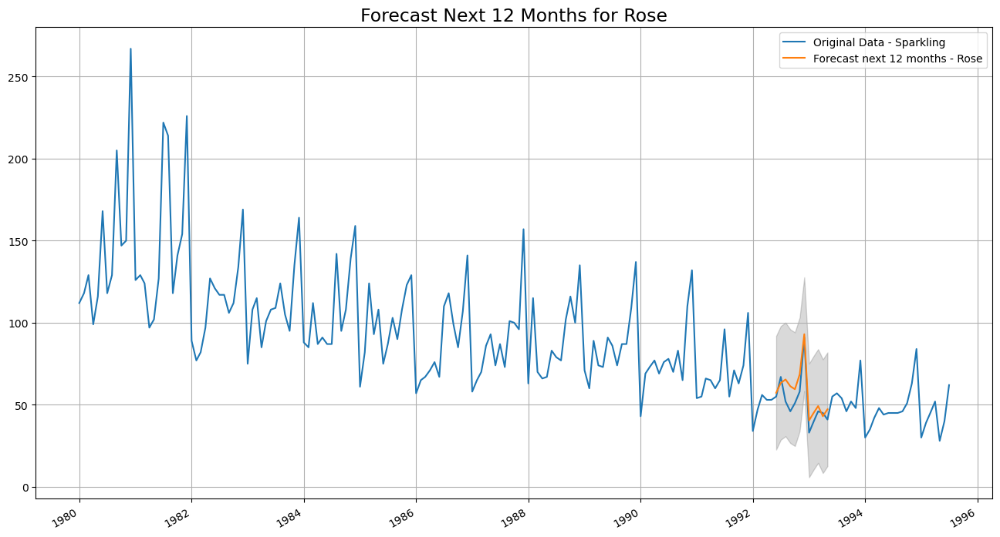

In [279]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rose_data['Rose'], label='Original Data - Sparkling')

ax =TES_predict.plot(label='Forecast next 12 months - Rose')


ax.fill_between(pred_1_df.index,pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Rose', fontsize=17);

plt.savefig('rose_forecast_tes.jpg', bbox_inches='tight');

# 